In [1]:
import os
import numpy as np
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
import sklearn.preprocessing
import scipy.sparse
import scipy.io
import sklearn.mixture
import rpy2
from anndata import AnnData
sc.settings.set_figure_params(dpi=100)
sc.settings.verbosity = 3  # verbosity: errors (0), warnings (1), info (2), hints (3)
%load_ext rpy2.ipython

In [2]:
from matplotlib import rc

In [3]:
import builtins
builtins.set

set

## Dataset Filenames, Labels, and Parameters

In [4]:
PROJECT_NAME = 'pbmc1_15_10x'
DOUBLET_FILTER_STEP_NAME = '7'


samples = ['pbmc1','pbmc2','pbmc3', "pbmc4", "pbmc5", "pbmc6", "pbmc8", "pbmc9", "pbmc10", "pbmc12",
           'pbmc13', 'pbmc14', 'pbmc15', 'CR2-pbmc-10k-nextgem', 'CR2-pbmc-5k-nextgem', 'CR2-pbmc-1k-nextgem',
           'CR2-pbmc-500-nextgem', 'tenX_atac_pbmc_10k_v1', 'tenX_atac_pbmc_1k_v1', 'tenX_atac_pbmc_500_v1',
           'tenX_atac_pbmc_5k_v1'  ]


LOW_FRIP_REMOVAL_ROUND = '4'



wd = '/nfs/lab/jnewsome/pbmc/cluster_Input_Matrix_Softlinks/'
OUTPUT_DIR = '/nfs/lab/jnewsome/pbmc/cluster_Input_Matrix_Softlinks/h5ad/'

QC_FILENAME = '/nfs/lab/jnewsome/pbmc/cluster_Input_Matrix_Softlinks/pbmc1-15_merged_10x2.fixed.qc_metrics.txt'

figureOutputDir = "/nfs/lab/jnewsome/notebooks_from_PBMC_project_dir/figures/umap/"


possibleCellTypeList = ['b_cell', 'b_cell_memory', 'b_cell_naive',
                        'basophil', 'dendritic_cell', 'dendritic_cell_conventional'
                        'dendritic_cell_plasmacytoid', 'eosinophil', 'hematopoietic_stem_cell', 
                        'macrophage', 'megakaryocyte', 'monocyte', 
                        'monocyte_classical', 'monocyte_non-classical', 'neutrophil', 
                        'nk_cell', 'nk_cell_adaptive', 'nk_cell_cytotoxic', 
                        'plasma_cell', 'platelet_activated', 'platelet_resting', 
                        'red_blood_cell', 't_cell', 't_cell_activated', 
                        't_cell_activated_CD4', 't_cell_activated_CD8', 't_cell_naive', 
                        't_cell_CD4', 't_cell_CD8', 
                        't_cell_naive_CD4', 
                        't_cell_naive_CD8', 
                        't_cell_regulatory']

afterLowFripAnnDataFile = wd + PROJECT_NAME +  '.merged_samples_v1.h5ad'
outputAnnDataFile = wd + PROJECT_NAME +  '.merged_samples_v1_afterLowFRIP.h5ad'
outputFilteredBarcodeFile = wd + PROJECT_NAME +  '.merged_v5.aaaaaaa'
# low_readsFile  = wd + PROJECT_NAME +  '.round1-4.allMerged.badBarcodes.txt'

WD = wd


outputFilteredBarcodeFile = wd + PROJECT_NAME +  '.badBarcodes.doubletRemovalRound.' + DOUBLET_FILTER_STEP_NAME

input_h5ad = wd + PROJECT_NAME +  '.merged_samples_v2.merge5b_harmony_justDonor.h5ad'





figureOutputDir = "/nfs/lab/jnewsome//notebooks_from_PBMC_project_dir/figures/"
figureOutputDirDot = figureOutputDir + 'dotplot/'
# subset_geneCellTypeTable = pd.read_table('/nfs/lab/jnewsome/gene_marker_celltype_table_v2.txt', sep='\t', header=0)







possibleCellTypeList = [
                        'b_cell', 'b_cell_activated', 'b_cell_memory',
                        'b_cell_naive', 'dendritic_cell', 'dendritic_cell_conventional',
                        'dendritic_cell_plasmacytoid', 'macrophage', 'megakaryocyte',
                        'monocyte', 'monocyte_classical', 'monocyte_intermediate',
                        'monocyte_non-classical', 'nk_cell', 'nk_cell_adaptive',
                        'nk_cell_cytotoxic', 't_cell', 't_cell_activated',
                        't_cell_activated_CD4', 't_cell_activated_CD8', 't_cell_CD4',
                        't_cell_CD4_regulatory', 't_cell_CD8', 't_cell_naive',
                        't_cell_naive_CD4', 't_cell_naive_CD8', 't_cell_regulatory']


filterStep = 'v6_DoubletFilter' + DOUBLET_FILTER_STEP_NAME
subClusterStep = 'v6_DoubletFilter' + DOUBLET_FILTER_STEP_NAME



afterLowFripAnnDataFile = "/home/jnewsome/pbmc.merged_samples_v6_afterLowFripRemoval.h5ad"
outputAnnDataFile = '/home/jnewsome/pbmc.merged_samples_v6_after' + DOUBLET_FILTER_STEP_NAME + 'thDoublet.h5ad'
# outputFilteredBarcodeFile = '/nfs/lab/projects/pbmc_snATAC/pipeline/snATAC/clusterBarcodeFiles/merged_v6.doublets' + doubletFilterStepNumber
# badBarcodeFileList = [ 
#     '/nfs/lab/projects/pbmc_snATAC/pipeline/snATAC/clusterBarcodeFiles/pbmc.merged_samples_1to12_v6.lowfrip1',
#     '/nfs/lab/projects/pbmc_snATAC/pipeline/snATAC/clusterBarcodeFiles/pbmc.merged_samples_1to12_v6.lowfrip2',
#     '/nfs/lab/projects/pbmc_snATAC/pipeline/snATAC/cellRangerMultiplet_realExcludedBarcodes/pbmc1to12_merged_cellRangerExcludedFiltered.barcodes',
#     '/nfs/lab/projects/pbmc_snATAC/pipeline/snATAC/clusterBarcodeFiles/merged_v6.doublets1',
#     '/nfs/lab/projects/pbmc_snATAC/pipeline/snATAC/clusterBarcodeFiles/merged_v6.doublets2',
#     '/nfs/lab/projects/pbmc_snATAC/pipeline/snATAC/clusterBarcodeFiles/merged_v6.doublets3',
#     '/nfs/lab/projects/pbmc_snATAC/pipeline/snATAC/clusterBarcodeFiles/merged_v6.doublets4',
#     '/nfs/lab/projects/pbmc_snATAC/pipeline/snATAC/clusterBarcodeFiles/merged_v6.doublets5',
#     '/nfs/lab/projects/pbmc_snATAC/pipeline/snATAC/clusterBarcodeFiles/merged_v6.doublets6',
#     '/nfs/lab/projects/pbmc_snATAC/pipeline/snATAC/clusterBarcodeFiles/merged_v6.doublets7',
#     '/nfs/lab/projects/pbmc_snATAC/pipeline/snATAC/clusterBarcodeFiles/merged_v6.doublets8',
    #'/nfs/lab/projects/pbmc_snATAC/pipeline/snATAC/clusterBarcodeFiles/merged_v6.doublets1',
# ]


# pbmc_subset_genes_macroPop_dict = { 
#     'Monocytes' : ['IL1B', 'MAFB', 'BIN1', 'HES4', 'CD4'],
#     'T-cells': ['CD3D', 'CD4', 'FOXP3', 'CD8A', 'CD8B', 'TNFA', 'IFNG', 'IL23R'],
#     'NK_cells': ['IFNG', 'NCAM1', 'SH2D1B', 'CD27'],
#     'B-cells': ['MS4A1', 'TCL1A', 'CD27'],
#     'pDC': ['PTCRA', 'RGS7'],
#     'Megakaryocyte': ['GATA1', 'ITGA2B']
# }


pbmc_subset_genes_macroPop_list = ['IL1B', 'MAFB', 'BIN1', 'HES4', 'CD4',
                                   'CD3D', 'CD4', 'FOXP3', 'CD8A', 'CD8B', 'TNF', 'IFNG', 'IL23R',
                                   'IFNG', 'NCAM1', 'SH2D1B', 'CD27',
                                   'MS4A1', 'TCL1A', 'CD27',
                                   'PTCRA', 'RGS7',
                                  'GATA1', 'ITGA2B' ]


pbmc_subset_genes_pop_dict = {
    'Megakaryocytes' : ['GATA'],
    'pDC' : ['PTCRA'],
    'Activated CD8+ T-cells, \nCytotoxic NK cells, Activated \nCD4+ T-cells' : ['IFNG'],
    'Natural Killer Cell' : ['NCR1'],
    'B-cell' : ['MS4A1'],
    'Naïve B-cell' : ['TCL1A'],
    'T-cell' : ['CD3D'],
    'CD4+ T-cell' : ['CD4'],
    'Regulatory CD4+ T-cell' : ['FOXP3'],
    'CD8+ T-cell' : ['CD8A'],
    'Memory CD8+ T-cell' : ['KLRB1'],
    'Monocyte' : ['GPR20'],
    'HSC' : ['CD34'],    
    'γδ T-cell' : ['TYMS'],
    }

geneList = [ 'GATA1','PTCRA','IFNG', 'NCR1','MS4A1','TCL1A', \
                   'CD3D','CD4','FOXP3', 'CD8A','KLRB1','IL1B', 'DNAI2','GPR20', 'CD34', 'TYMS']









markerGenes = {
    'Megakaryocytes' : ['GATA'],
    'pDC' : ['PTCRA'],
    'Activated CD8+ T-cells, \nCytotoxic NK cells, Activated \nCD4+ T-cells' : ['IFNG'],
    'Natural Killer Cell' : ['NCR1'],
    'B-cell' : ['MS4A1'],
    'Naïve B-cell' : ['TCL1A'],
    'T-cell' : ['CD3D'],
    'CD4+ T-cell' : ['CD4'],
    'Regulatory CD4+ T-cell' : ['FOXP3'],
    'CD8+ T-cell' : ['CD8A'],
    'Memory CD8+ T-cell' : ['KLRB1'],
    'Monocyte' : ['GPR20'],
    'HSC' : ['CD34'],    
    'γδ T-cell' : ['TYMS'],
    }






experimentalGeneDict = {
    'cDC Progenitor' : ['THBD', 'CD1C'],
    'cDC' : ['ITGAX'],
    'Monocytes' : [ 'CD14'],
    'DC / Monocytes' : ['CLEC9A'],
    'AS DCs' : ['AXL', 'SIGLEC1', 'SIGLEC6'],
    'pDC' : ['ENY2'],
    'CD1C+ DC' : ['CD1C'],
    'TReg' : ['IL2RA'],
    'B' : ['CD19', 'CD79A', 'CD79B'],
    'NK' : ['NCAM1'],
    'Naive T' : ['PTPRC'],
    'T' : ['CD34'],
    'Memory T cell' : ['CCR10'],
    'CD8 T-cell' : ['GZMB'],
    'Myeloid Cell' : ['S100A8', 'S100A9'],
    'Megakaryoctyes' : ['PF4', 'PPBP'],
    'Proliferating Erythrocytes' : ['HBG1', 'HBG2'],
    }

experimentalGeneTitleList = ['cDC Progenitor?: THBD', 'cDC Progenitor?: CD1C', 'cDC: ITGAX', \
'DC / Monocytes: CLEC9A', 'AS DCs: AXL', \
 'AS DCs: SIGLEC1', 'AS DCs: SIGLEC6',  'Monocytes: CD14', 'CD1C+ DC: CD1C', 'TReg: IL2RA', \
 'Memory? / Naive T : PTPRC', 'B cells: CD19', 'NK: NCAM1',  'T cells: CD34', \
 'Memory T cell: CCR10', 'CD8 T-cell: GZMB', 'Myeloid Cell: S100A8', 'Myeloid Cell: S100A9', \
 'B cells: CD79A', 'B cells: CD79B', \
 'Megakaryocytes: PPBP', 'Proliferating Erythrocytes: HBG1', 'Proliferating Erythrocytes: HBG2', 'CD38+ B-cell Marker: CD38']


# gene = FCGR3A is not in dataset
# gene = CD56 is not in dataset
# gene = CD45RA is not in dataset
# gene = PB4 is not in dataset

experimentalGeneList = ['THBD', 'CD1C', 'ITGAX',  'CLEC9A', 'AXL', \
 'SIGLEC1', 'SIGLEC6',  'CD14', 'CD1C', 'IL2RA', \
 'PTPRC', 'CD19', 'NCAM1', 'CD34', 'CCR10', 'GZMB', 'S100A8', 'S100A9', \
 'CD79A', 'CD79B',  'PPBP', 'HBG1', 'HBG2', 'CD38']

print('len list = ', len(experimentalGeneList), 'len title = ', len(experimentalGeneTitleList))

# CD141 THBD                cDC Progenitor?
# CD1C  CD1C                cDC Progenitor?
# CD11C  ITGAX              cDC
# CD16  FCGR3A              Monocytes
# CLEC9A   CLEC9A           DC / Monocytes
# AXL    AXL                AS DCs
# SIGLEC1    SIGLEC1        AS DCs
# SIGLEC6   SIGLEC6         AS DCs
# DC6    ENY2             pDC
# CD14   CD14            Monocytes
# CD1C     CD1C           CD1C+ DC


# CD25    IL2RA          TReg
# CD45RO  PTPRC  ???     Memory
# CD19     CD19           B
# CD56     NCAM1          KN
# CD45RA   PTPRC ???     Naive T

# CD34  CD34              T

# CCR10  CCR10           Memory T cell
# GZMB    GZMB           CD8 T-cell
# S100A8                Myeloid Cell
# S100A9                Myeloid Cell
# CD79A                   B Cell
# CD79B                   B Cell
# PF4                    Megakaryoctyes
# PPBP                   Megakaryocytes
# HBG1                  Proliferating Erythrocytes
# HBG2                  Proliferating Erythrocytes

len list =  23 len title =  23


In [5]:
adata_norm = sc.read(input_h5ad)

Only considering the two last: ['.merge5b_harmony_justDonor', '.h5ad'].
Only considering the two last: ['.merge5b_harmony_justDonor', '.h5ad'].


In [6]:
len(adata_norm.obs.index)

148771

In [7]:
# read all bad barcode files
LOW_FRIP_REMOVAL_ROUND = 4
lowFripBarcodeList = list()
roundLast = int(LOW_FRIP_REMOVAL_ROUND) - 1

while (roundLast > 0):
    lowFripFileName = '/nfs/lab/jnewsome/pbmc_clusters/'+  PROJECT_NAME + '.lowFrip.round'+ str(roundLast) + '.justBarcodes.txt'
    low_frip = open(lowFripFileName).read().splitlines()
    print('low frip round ', roundLast, " # bad barcodes = ", len(low_frip))
    for bar in low_frip:
        lowFripBarcodeList.append(bar)
    roundLast = roundLast - 1

print('total # bad barcodes = ', len(lowFripBarcodeList))

low frip round  3  # bad barcodes =  1194
low frip round  2  # bad barcodes =  536
low frip round  1  # bad barcodes =  5036
total # bad barcodes =  6766


In [8]:
# read all doublet files
doubletBarcodeList = list()
roundLast = int(DOUBLET_FILTER_STEP_NAME) - 1

while (roundLast > 0):
    doubletFileName =  wd + PROJECT_NAME +  '.badBarcodes.doubletRemovalRound.' + str(roundLast)   
    low_frip = open(doubletFileName).read().splitlines()
    print('doublet filter round ', roundLast, " # bad barcodes = ", len(low_frip))
    for bar in low_frip:
        doubletBarcodeList.append(bar)
    roundLast = roundLast - 1

print('total # bad barcodes = ', len(doubletBarcodeList))

doublet filter round  6  # bad barcodes =  696
doublet filter round  5  # bad barcodes =  2296
doublet filter round  4  # bad barcodes =  790
doublet filter round  3  # bad barcodes =  2105
doublet filter round  2  # bad barcodes =  2388
doublet filter round  1  # bad barcodes =  1372
total # bad barcodes =  9647


In [9]:
lowFripBarcodeList[-5:]

['tenX_atac_pbmc_500_v1_TCTATTGTCTGACTTT',
 'tenX_atac_pbmc_500_v1_TGCTTCGCAGTTCGGC',
 'tenX_atac_pbmc_500_v1_TGGCGCATCGAACCGC',
 'tenX_atac_pbmc_500_v1_TTACGGATCGATATGC',
 'tenX_atac_pbmc_500_v1_TTGTTGTAGCGGACTA']

In [10]:
doubletBarcodeList[-5:]

['tenX_atac_pbmc_500_v1_GTGCCAGGTAAACGGC',
 'tenX_atac_pbmc_500_v1_TCAGTTTCAGATTAAG',
 'tenX_atac_pbmc_500_v1_TCCCACATCTCGACAA',
 'tenX_atac_pbmc_500_v1_TGCATGAAGAAACGCC',
 'tenX_atac_pbmc_500_v1_TGGACATAGATGGGTC']

In [11]:
# Exclude low FRIP lists from adata object 
adata_norm = adata_norm[(~adata_norm.obs.index.isin(lowFripBarcodeList)),:]
adata_norm = adata_norm[(~adata_norm.obs.index.isin(doubletBarcodeList)),:]

In [12]:
len(adata_norm.obs.index)

133613

### Established Functions:

In [13]:
class GeneCellTypeThing (object):
    def __init__(self, gene, celltypes, title, source):
        self.gene = gene
        self.celltypes = celltypes
        self.title = title
        self.source = source



def getDuplicatedIndices (adata):
    duped = adata.obs.index.duplicated()

    count = 0
    for index1 in adata.obs.index:
        if duped[count]:
            print(index1 + "\t" + str(duped[count]))
        count = count + 1
        
        
def fixCategoricalValuesToNumeric (adata_norm):

    adata_norm.obs['frac_reads_in_peaks'] = pd.to_numeric(adata_norm.obs['frac_reads_in_peaks'])
    adata_norm.obs['frac_reads_in_promoters'] = pd.to_numeric(adata_norm.obs['frac_reads_in_promoters'])
    adata_norm.obs['frac_promoters_used'] = pd.to_numeric(adata_norm.obs['frac_promoters_used'])
    adata_norm.obs['frac_mito_reads'] = pd.to_numeric(adata_norm.obs['frac_mito_reads'])
    adata_norm.obs['frac_duplicated_reads'] = pd.to_numeric(adata_norm.obs['frac_duplicated_reads'])
    return adata_norm


def clusterData (adata_norm, filterStepName, isOutputFigure ):
    figName_umapLeiden = "/cluster_" + filterStepName + "_UMAPLeiden.png"
    figName_umapDonor = "/cluster_" + filterStepName +  "_UMAPsample.png"
    figName_umapLog10Use = "/cluster_" + filterStepName + "_UMAPlog10UseableReads.png"    
    sc.pp.neighbors(adata_norm, n_neighbors=30, method='umap', metric='cosine', random_state=0, n_pcs=50)
    sc.tl.leiden(adata_norm, resolution=1.25, random_state=0)
    sc.tl.umap(adata_norm, min_dist=0.3, random_state=0)
    
    if isOutputFigure:
        sc.pl.umap(adata_norm, color=['leiden'], size=9, legend_loc='on data', title='Leiden Clusters', save=figName_umapLeiden) 
        sc.pl.umap(adata_norm, color=['donor'], size=9, save=figName_umapDonor)
        sc.pl.umap(adata_norm, color=['log10_usable_counts'], size=9, color_map='Blues', save=figName_umapLog10Use)
    else:
        sc.pl.umap(adata_norm, color=['leiden'], size=9, legend_loc='on data', title='Leiden Clusters') 
        sc.pl.umap(adata_norm, color=['donor'], size=9)
        sc.pl.umap(adata_norm, color=['log10_usable_counts'], size=9, color_map='Blues')
    return adata_norm


def makeOlderVersionMarkerUmaps (adata_norm, filterStepName, isOutputFigure):
    figName_gene1 = "/cluster_" + filterStepName + "_UMAP_marker_gene1.png"
    figName_gene2 = "/cluster_" + filterStepName + "_UMAP_marker_gene2.png"
    figName_gene3 = "/cluster_" + filterStepName + "_UMAP_marker_gene3.png"
    figName_gene4 = "/cluster_" + filterStepName + "_UMAP_marker_gene4.png"
    figName_gene5 = "/cluster_" + filterStepName + "_UMAP_marker_gene5.png"
    figName_gene6 = "/cluster_" + filterStepName + "_UMAP_marker_gene6.png"
    figName_gene7 = "/cluster_" + filterStepName + "_UMAP_marker_gene7.png"
    if isOutputFigure:
        sc.pl.umap(adata_norm, color=['CD14','IL1B','MAFB'], size=9, color_map='Blues', frameon=True, use_raw=True, title=['Monocyte marker: CD14','Monocyte marker: IL1B','Monocyte marker: MAFB'], save=figName_gene1)  # Monocyte
        sc.pl.umap(adata_norm, color=['CD4','CD3D','IL2RA'], size=9, color_map='Blues', frameon=True, use_raw=True, title=['CD4+ T-cell marker: CD4','CD4+ T-cell marker: CD3D','CD4+ T-cell marker: IL2RA'], save=figName_gene2)  # CD4 T-cell
        sc.pl.umap(adata_norm, color=['CD8A','NFIC','FASLG'], size=9, color_map='Blues', frameon=True, use_raw=True, title=['CD8+ T-cell marker: CD8A','CD8+ T-cell marker: NFIC','CD8+ T-cell marker: FASLG'], save=figName_gene3)  # CD8 T-cell
        sc.pl.umap(adata_norm, color=['CD19','MS4A1','CD79A'], size=9, color_map='Blues', frameon=True, use_raw=True, title=['B-cell marker: CD19','B-cell marker: MS4A1','B-cell marker: CD79A'], save=figName_gene4)  #B-cell 
        sc.pl.umap(adata_norm, color=['NCAM1','NCR1','SH2D1B'], size=9, color_map='Blues', frameon=True, use_raw=True, title=['NK cell marker: NCAM1 (CD56)','NK cell marker: NCR1','NK cell marker: SH2D1B'], save=figName_gene5)  # NK cell
        sc.pl.umap(adata_norm, color=['ITGA2B','PTGER3','CD9'], size=9, color_map='Blues', frameon=True, use_raw=True, title=['Megakaryocyte marker: ITGA2B (CD41)','Megakaryocyte marker: PTGER3','Megakaryocyte marker: CD9'], save=figName_gene6)  # Megakaryocyte
        sc.pl.umap(adata_norm, color=['PTCRA','LAMP5','RGS7'], size=9, color_map='Blues', frameon=True, use_raw=True, title=['Plasmacytoid dendritic cell marker: PTCRA','Plasmacytoid dendritic cell marker: LAMP5','Plasmacytoid dendritic cell marker: RGS7'], save=figName_gene7)  #9
    else:
        sc.pl.umap(adata_norm, color=['CD14','IL1B','MAFB'], size=9, color_map='Blues', frameon=True, use_raw=True, title=['Monocyte marker: CD14','Monocyte marker: IL1B','Monocyte marker: MAFB'])  # Monocyte
        sc.pl.umap(adata_norm, color=['CD4','CD3D','IL2RA'], size=9, color_map='Blues', frameon=True, use_raw=True, title=['CD4+ T-cell marker: CD4','CD4+ T-cell marker: CD3D','CD4+ T-cell marker: IL2RA'])  # CD4 T-cell
        sc.pl.umap(adata_norm, color=['CD8A','NFIC','FASLG'], size=9, color_map='Blues', frameon=True, use_raw=True, title=['CD8+ T-cell marker: CD8A','CD8+ T-cell marker: NFIC','CD8+ T-cell marker: FASLG'])  # CD8 T-cell
        sc.pl.umap(adata_norm, color=['CD19','MS4A1','CD79A'], size=9, color_map='Blues', frameon=True, use_raw=True, title=['B-cell marker: CD19','B-cell marker: MS4A1','B-cell marker: CD79A'])  #B-cell 
        sc.pl.umap(adata_norm, color=['NCAM1','NCR1','SH2D1B'], size=9, color_map='Blues', frameon=True, use_raw=True, title=['NK cell marker: NCAM1 (CD56)','NK cell marker: NCR1','NK cell marker: SH2D1B'])  # NK cell
        sc.pl.umap(adata_norm, color=['ITGA2B','PTGER3','CD9'], size=9, color_map='Blues', frameon=True, use_raw=True, title=['Megakaryocyte marker: ITGA2B (CD41)','Megakaryocyte marker: PTGER3','Megakaryocyte marker: CD9'])  # Megakaryocyte
        sc.pl.umap(adata_norm, color=['PTCRA','LAMP5','RGS7'], size=9, color_map='Blues', frameon=True, use_raw=True, title=['Plasmacytoid dendritic cell marker: PTCRA','Plasmacytoid dendritic cell marker: LAMP5','Plasmacytoid dendritic cell marker: RGS7'])  #9
    return adata_norm


def makeFracUMAPs (adata_norm, filterStepName, isOutputFigure, outputPlotDir ):
    figName_frip = "/cluster_" + filterStepName + "_UMAP_FRIP.png"
    figName_friprom = "/cluster_" + filterStepName + "_UMAP_FRIPromoters.png"
    figName_fracPromUsed = "/cluster_" + filterStepName + "_UMAP_FracPromUsed.png"
    figName_fracMitoReads = "/cluster_" + filterStepName + "_UMAP_FracMitoReads.png"
    figName_fracDupReads = "/cluster_" + filterStepName + "_UMAP_FracDuplicatedReads.png"
    figName_log10Useable = outputPlotDir + "cluster_" + filterStepName + "_cluster" +  "_log10UseableCounts.png"
    figName_frip2 = outputPlotDir + "cluster_" + filterStepName +  "_FRIP.png"
    
    if isOutputFigure:
        sc.pl.umap(adata_norm, color=['frac_reads_in_peaks'], cmap='Reds', size=9, legend_loc='on data', save=figName_frip)
        sc.pl.umap(adata_norm, color=['frac_reads_in_promoters'], cmap='Reds', size=9, legend_loc='on data', save=figName_friprom)
        sc.pl.umap(adata_norm, color=['frac_promoters_used'], cmap='Reds', size=9, legend_loc='on data', save=figName_fracPromUsed)
        sc.pl.umap(adata_norm, color=['frac_mito_reads'], cmap='Reds', size=9, legend_loc='on data', save=figName_fracMitoReads)
        sc.pl.umap(adata_norm, color=['frac_duplicated_reads'], cmap='Reds', size=9, legend_loc='on data', save=figName_fracDupReads)
    
        fig, ax1 = plt.subplots(1,1,figsize=(7,5))
        sns.boxplot(x='leiden', y='log10_usable_counts', data=adata_norm.obs)
        plt.show()
        fig.savefig(figName_log10Useable)

        fig, ax1 = plt.subplots(1,1,figsize=(7,5))
        sns.boxplot(x='leiden', y='frac_reads_in_peaks', data=adata_norm.obs)
        plt.show()
        fig.savefig(figName_frip2)
    
    else:
        sc.pl.umap(adata_norm, color=['frac_reads_in_peaks'], cmap='Reds', size=9, legend_loc='on data')
        sc.pl.umap(adata_norm, color=['frac_reads_in_promoters'], cmap='Reds', size=9, legend_loc='on data')
        sc.pl.umap(adata_norm, color=['frac_promoters_used'], cmap='Reds', size=9, legend_loc='on data')
        sc.pl.umap(adata_norm, color=['frac_mito_reads'], cmap='Reds', size=9, legend_loc='on data')
        sc.pl.umap(adata_norm, color=['frac_duplicated_reads'], cmap='Reds', size=9, legend_loc='on data')
        
        fig, ax1 = plt.subplots(1,1,figsize=(7,5))
        sns.boxplot(x='leiden', y='log10_usable_counts', data=adata_norm.obs)
        plt.show()

        fig, ax1 = plt.subplots(1,1,figsize=(7,5))
        sns.boxplot(x='leiden', y='frac_reads_in_peaks', data=adata_norm.obs)
        plt.show()
    return adata_norm


def adjustDictionary (adataObs, subClusterDict):
    subClusters = adataObs['subset'].unique()
    subClustersReal = list()
    for sub in subClusters:
        if "," in sub:
            subClustersReal.append(sub)
    for subC in subClustersReal:
        list1  = [subC]
        subClusterDict[subC] = adataObs.loc[adataObs['subset'].isin(list1)].index
    return subClusterDict


def getSubCluster (adata, clusterChosen, subset_genes, experimentalGeneList, outputPlotDir, isOutputPlot, filterStepName, subClusterDict, secondGeneList):
    figName_umap = "/subClusterCheck_" + filterStepName + "_cluster" + str(clusterChosen) + "_WholeUMAP.png"
    figName_heatmap = outputPlotDir + "subClusterCheck_" + filterStepName + "_cluster" + str(clusterChosen) + "_heatmap.png"
    figName_heatmap_v2 = outputPlotDir + "subClusterCheck_" + filterStepName + "_cluster" + str(clusterChosen) + "_heatmap_v2.png"
    figName_umapCluster = outputPlotDir + "subClusterCheck_" + filterStepName + "_cluster" + str(clusterChosen) + "_ClusterUMAP.png"
    figName_log10Useable = outputPlotDir + "subClusterCheck_" + filterStepName + "_cluster" + str(clusterChosen) + "_log10UseableCounts.png"
    figName_frip = outputPlotDir + "subClusterCheck_" + filterStepName + "_cluster" + str(clusterChosen) + "_FRIP.png"
    figName_fpu = outputPlotDir + "subClusterCheck_" + filterStepName + "_cluster" + str(clusterChosen) + "_FPU.png"
    
    subset_cluster = [clusterChosen]
    sc.tl.louvain(adata, restrict_to=('leiden',subset_cluster), resolution=2, random_state=0, key_added='subset')
    #sc.pl.umap(adata, color=['subset'], size=9)#, legend_loc='on data')
    
    if isOutputPlot:
        sc.pl.umap(adata, color=['subset'], size=14, 
                   title = ("Subclusters of Cluster " + clusterChosen), 
                   save=figName_umap)
    else:
        sc.pl.umap(adata, color=['subset'], title = ("Subclusters of Cluster " + clusterChosen), 
                   size=14)

    
    adata_obs = adata.obs.copy()
    adata_obs['cells'] = 1
    
    adata_obs2 = adata_obs.copy()
    for gene in subset_genes:
        #print(gene)
        #thinglyPoof = (adata.raw.X[:,adata.raw.var.index.get_loc(gene)].todense().A1 > 0).astype(int)
        #print("len obs = " + str(len(adata_obs.index)) + "\t len new cell list = " + str(len(thinglyPoof)))
        adata_obs[gene] = (adata.raw.X[:,adata.raw.var.index.get_loc(gene)].todense().A1 > 0).astype(int)
   
    for gene in experimentalGeneList:
        #print(gene)
        #thinglyPoof = (adata.raw.X[:,adata.raw.var.index.get_loc(gene)].todense().A1 > 0).astype(int)
        #print("len obs = " + str(len(adata_obs.index)) + "\t len new cell list = " + str(len(thinglyPoof)))
        adata_obs2[gene] = (adata.raw.X[:,adata.raw.var.index.get_loc(gene)].todense().A1 > 0).astype(int)    
        
    
    
    
    
    
    subset_obs = adata_obs.loc[adata_obs['subset'].str.contains(',')]
    subset_pct = pd.DataFrame(index=sorted(set(subset_obs['subset'])))
    
    subset_obs2 = adata_obs2.loc[adata_obs2['subset'].str.contains(',')]
    subset_pct2 = pd.DataFrame(index=sorted(set(subset_obs2['subset'])))
    

    for gene in subset_genes:
        subset_pct[gene] = (subset_obs.groupby('subset')[gene].sum()/subset_obs.groupby('subset')['cells'].count()).dropna()
    fig, ax1 = plt.subplots(1,1,figsize=(9,7))
    sns.heatmap(subset_pct, cmap='Reds', yticklabels=1, ax=ax1, vmax=.25)
    plt.show()
    if isOutputPlot:
        fig.savefig(figName_heatmap)

        

    for gene in experimentalGeneList:
        subset_pct2[gene] = (subset_obs2.groupby('subset')[gene].sum()/subset_obs2.groupby('subset')['cells'].count()).dropna()
    fig, ax1 = plt.subplots(1,1,figsize=(12,7))
    sns.heatmap(subset_pct2, cmap='Reds', yticklabels=1, ax=ax1, vmax=.25)
    plt.show()
    if isOutputPlot:
        fig.savefig(figName_heatmap_v2)

        
        
        
    fig, ax1 = plt.subplots(1,1,figsize=(10,10))
    subset = adata.obs.join(pd.DataFrame(adata.obsm['X_umap'], index=adata.obs.index, columns=['UMAP1','UMAP2']), how='inner', rsuffix='_right')
    subset = subset.loc[subset['leiden'].isin(subset_cluster)]
    for s in sorted(set(subset['subset'])):
        ax1.scatter(subset.loc[subset['subset']==s, 'UMAP1'], subset.loc[subset['subset']==s, 'UMAP2'], alpha=1, s=4, label=s)
    ax1.legend(markerscale=3)
    plt.show()
    if isOutputPlot:
        fig.savefig(figName_umapCluster)
    
    fig, ax1 = plt.subplots(1,1,figsize=(12,5))
    sns.boxplot(x='subset', y='log10_usable_counts', data=adata.obs, ax=ax1)
    ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90)
    plt.show()
    if isOutputPlot:
        fig.savefig(figName_log10Useable)
    
    fig, ax1 = plt.subplots(1,1,figsize=(12,5))
    sns.boxplot(x='subset', y='frac_reads_in_peaks', data=adata.obs, ax=ax1)
    ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90)
    plt.show()
    if isOutputPlot:
        fig.savefig(figName_frip)
    
    fig, ax1 = plt.subplots(1,1,figsize=(12,5))
    sns.boxplot(x='subset', y='frac_promoters_used', data=adata.obs, ax=ax1)
    ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90)
    plt.show()
    if isOutputPlot:
        fig.savefig(figName_fpu)
    
    subClusterDict = adjustDictionary (adata.obs, subClusterDict)
    
    return adata.obs, subClusterDict

def getDFOfRowsToRemove (adata, listOfSubClustersToRemove, subClusterDict):
    removeBarcodes = list()
    for sub in listOfSubClustersToRemove:
       # print(subClusterDict[sub])
       # removeBarcodes = removeBarcodes + subClusterDict[sub]
        for bar in subClusterDict[sub]:
            removeBarcodes.append(bar)
    #print(removeBarcodes)
    removeRows = adata.obs.loc[adata.obs.index.isin(removeBarcodes)]
    return removeRows


def fixUMAPTitle (title, nCharactersPerLine):
    if len(title) > (nCharactersPerLine - 1):
        title = "\n".join(wrap(title, nCharactersPerLine))
    return title
    
    

def makeUMAPGeneHeatmaps (adata_norm, subset_genes, newGeneCellTypeDict, filterStepName):
    count = 0
    ind = 0
    
    nChar = 40
    
    madeGenes = list()
    
    for pos in range(0, len(subset_genes), 3):
        #figName_genes01_umap = filePrefix + str(count ) + fileSuffix
        figName_genes01_umap =   "/geneUMAP_cluster_" + filterStepName + "_genes_" + str(count) + ".png"
        
        ind = ind + 0
        ind2 = ind + 1
        ind3 = ind + 2
        
        
        if ind3 < len(subset_genes):
            gene1 = subset_genes[pos]
            gene2 = subset_genes[pos + 1]
            gene3 = subset_genes[pos + 2]
                                   
            madeGenes.append(subset_genes[pos])
            madeGenes.append(subset_genes[pos + 1])                       
            madeGenes.append(subset_genes[pos + 2])    
                           
                                   
            title1 = fixUMAPTitle (newGeneCellTypeDict[gene1].title, nChar)
            
                                 
            title2 = fixUMAPTitle (newGeneCellTypeDict[gene2].title, nChar)  
            title3 = fixUMAPTitle (newGeneCellTypeDict[gene3].title, nChar)  
                                   
                                   
            sc.pl.umap(adata_norm, color=[gene1, gene2, gene3], size=9, color_map='Blues', 
                       frameon=True, use_raw=True, 
                       title=[title1, 
                              title2, 
                              title3], save=figName_genes01_umap) 
        ind = ind3 + 1
        count = count + 1
            
    for gene in subset_genes: 
        if not gene in madeGenes:
            figName_genes01_umap =   "/geneUMAP_cluster_" + filterStepName + "_genes_" + str(count) + ".png"
            title1 = fixUMAPTitle (newGeneCellTypeDict[gene].title, nChar)
            sc.pl.umap(adata_norm, color=[gene], size=9, color_map='Blues', 
                       frameon=True, use_raw=True, 
                       title=[title1], save=figName_genes01_umap) 
            count = count + 1
        
        
        
def initiateGeneDictAndGeneList (possibleCellTypeList, subset_geneCellTypeTable, adata):
    subClusterDict = dict()
    geneCellTypeDict = dict()
    subset_genes_orig = list()
    for index, row in subset_geneCellTypeTable.iterrows():
        #print(row['c1'], row['c2'])
        gene = row['Gene']
        cellTypes = row['CellType']
        title = row['Title']
        source = row['Sources']
        celltypes = cellTypes.split(";")
        gctt = GeneCellTypeThing(gene, celltypes, title, source)
        geneCellTypeDict[gene] = gctt
        if not gene in subset_genes_orig:
            subset_genes_orig.append(gene)
    newGeneCellTypeDict = dict()
    subset_genes = list()
    
    
    notDict = dict()
    
    for gene in subset_genes_orig:
        if gene in adata.raw.var.index:
            for ct in geneCellTypeDict[gene].celltypes:
                if ct in possibleCellTypeList:
                    newGeneCellTypeDict[gene] = geneCellTypeDict[gene]
                    subset_genes.append(gene)
        else: 
            notDict[gene] = geneCellTypeDict[gene]
        
    
    print("Markers not found in dataset: ")
    for gene in notDict.keys():
        cellTypes = ",".join(geneCellTypeDict[gene].celltypes)
        print(gene + "\t\t" + cellTypes) 
            
    return newGeneCellTypeDict, subset_genes





def filterZeroReadGenesFromGeneList (geneList, adata):
    fixedGeneList = list()
    
    for gene in geneList:
        if gene in adata.raw.var.index:
            fixedGeneList.append(gene)
        else:
            print("gene = " + gene + " is not in dataset")
    return fixedGeneList


def createAllSubClusters (adata_norm, subClusterDict, subset_genes, experimentalGeneList, figureOutputDir, filterStep, isOutput, secondGeneList ):
    clusterNames = adata_norm.obs['leiden'].unique()
    clusterNumbers = list()
    for clust in clusterNames:
        clusterNumbers.append(int(clust))
    maxCurrent = -1
    for clust in clusterNumbers:
        if clust > maxCurrent:
            maxCurrent = clust
    # FIX THIS LATER
    #maxCluster = max(clusterNumbers)
    maxCluster = maxCurrent
    for i in range(0,maxCluster+1):
        adataObsTemp, subClusterDict =  getSubCluster(
            adata_norm, str(i), subset_genes, experimentalGeneList, 
            figureOutputDir, isOutput, filterStep, subClusterDict, secondGeneList)
    return adataObsTemp, subClusterDict



def umapSingleSetOfMarkers (adata_norm, markerList):
    sc.pl.umap(adata_norm, color= markerList, size=9, color_map='Blues', frameon=True, use_raw=True )


### Experimental Functions:

In [14]:
def makeUMAPGeneHeatmaps_ForSubClusters (adata_norm, subset_genes, geneCellTypeDict, filterStepName, filePrefix, fileSuffix):
    count = 0
    for gene in subset_genes:
        figName_umapCluster = filePrefix + str(count) + fileSuffix
        for s in sorted(set(subset['subset'])):
            ax1.scatter(subset.loc[subset['subset']==s, 'UMAP1'], subset.loc[subset['subset']==s, 'UMAP2'], alpha=1, s=4, label=s, color=[gene])
        ax1.legend(markerscale=3)
        plt.show()
        if isOutputPlot:
            fig.savefig(figName_umapCluster)
        count = count + 1



def getSubCluster_withGeneMarkers (adata, clusterChosen, subset_genes, outputPlotDir, isOutputPlot, filterStepName, subClusterDict, geneCellTypeDict, markerGeneGroupName):
    figName_umap = "/subClusterCheck_" + filterStepName + "_cluster" + str(clusterChosen) + "_WholeUMAP.png"
    figName_heatmap = outputPlotDir + "subClusterCheck_" + filterStepName + "_cluster" + str(clusterChosen) + "_heatmap.png"
    figName_umapCluster = outputPlotDir + "subClusterCheck_" + filterStepName + "_cluster" + str(clusterChosen) + "_ClusterUMAP.png"
    figName_log10Useable = outputPlotDir + "subClusterCheck_" + filterStepName + "_cluster" + str(clusterChosen) + "_log10UseableCounts.png"
    figName_frip = outputPlotDir + "subClusterCheck_" + filterStepName + "_cluster" + str(clusterChosen) + "_FRIP.png"
    figName_fpu = outputPlotDir + "subClusterCheck_" + filterStepName + "_cluster" + str(clusterChosen) + "_FPU.png"
    
    figName_umap_prefix = "/subClusterCheck_" + filterStepName + "_cluster" + str(clusterChosen)+ "_" + "_markerGene"
    figName_umap_suffix = ".png"
    subset_cluster = [clusterChosen]
    adata_obs = adata.obs.copy()
    adata_obs['cells'] = 1
    for gene in subset_genes:
        #print(gene)
        thinglyPoof = (adata.raw.X[:,adata.raw.var.index.get_loc(gene)].todense().A1 > 0).astype(int)
        #print("len obs = " + str(len(adata_obs.index)) + "\t len new cell list = " + str(len(thinglyPoof)))
        adata_obs[gene] = (adata.raw.X[:,adata.raw.var.index.get_loc(gene)].todense().A1 > 0).astype(int)
    subset_obs = adata_obs.loc[adata_obs['subset'].str.contains(',')]
    subset_pct = pd.DataFrame(index=sorted(set(subset_obs['subset'])))
    for gene in subset_genes:
        subset_pct[gene] = (subset_obs.groupby('subset')[gene].sum()/subset_obs.groupby('subset')['cells'].count()).dropna()

    subset = adata.obs.join(pd.DataFrame(adata.obsm['X_umap'], index=adata.obs.index, columns=['UMAP1','UMAP2']), how='inner', rsuffix='_right')
    subset = subset.loc[subset['leiden'].isin(subset_cluster)]
    
    makeUMAPGeneHeatmaps_ForSubClusters (subset, subset_genes, geneCellTypeDict, filterStepName, figName_umap_prefix, figName_umap_suffix)
    return adata.obs, subClusterDict



def makeSampleQCBoxPlots (samples, outputPlotDir, adata_norm, isOutput):
    for pbmc in samples:
        figName = outputPlotDir + "cluster_" + filterStep + "_" + pbmc +  "_sampleQC.png"
        fig, ax1 = plt.subplots(1,3,figsize=(18,6), sharex=True)
        plt.title(pbmc)
        sns.boxplot(x='leiden', y='log10_usable_counts', data=adata_norm.obs.loc[adata_norm.obs.donor.isin([pbmc])], ax=ax1[0])
        sns.boxplot(x='leiden', y='frac_reads_in_peaks', data=adata_norm.obs.loc[adata_norm.obs.donor.isin([pbmc])], ax=ax1[1])
        sns.boxplot(x='leiden', y='frac_reads_in_promoters', data=adata_norm.obs.loc[adata_norm.obs.donor.isin([pbmc])], ax=ax1[2])
        plt.show()
        if isOutput:
            fig.savefig(figName)
    
    
    

def umapIndividualSamples (adata_norm, max1, min1, samples, filterStep, isOutput):
    adata_norm2 = adata_norm.copy()
    
    max1 = 5
    min1 = 1



    for pbmc in samples:
        adata_norm2.obs[pbmc] = adata_norm2.obs['donor']

    for pbmc in samples:
        pbmcDict = dict()
        for sample in samples:
            if sample == pbmc:
                pbmcDict[sample] = max1
            else:
                pbmcDict[sample] = min1
        #print(pbmcDict)
        adata_norm2.obs[pbmc] = adata_norm2.obs[pbmc].replace(pbmcDict)

    count = 0
    ind = 0
    madeSamples = list()

    for pos in range(0, len(samples), 3):
        #figName_genes01_umap = filePrefix + str(count ) + fileSuffix
        figName_genes01_umap =   "/sampleUMAP_" + filterStep + "_singleSampleUMAP_" + str(count) + ".png"

        ind = ind + 0
        ind2 = ind + 1
        ind3 = ind + 2


        if ind3 < len(samples):
            pbmc1 = samples[pos]
            pbmc2 = samples[pos + 1]
            pbmc3 = samples[pos + 2]

            madeSamples.append(samples[pos])
            madeSamples.append(samples[pos + 1])                       
            madeSamples.append(samples[pos + 2])    

            sc.pl.umap(adata_norm2, color= [pbmc1, pbmc2, pbmc3], size=9, color_map='Blues', frameon=True, use_raw=True, save=figName_genes01_umap)
            count = count + 1
        ind = ind3 + 1



    for pbmc in samples:
        if not pbmc in madeSamples:
            figName_genes01_umap =   "/sampleUMAP_" + filterStep + "_singleSampleUMAP_" + str(count) + ".png"
            sc.pl.umap(adata_norm2, color= [pbmc], size=9, color_map='Blues', frameon=True, use_raw=True, save=figName_genes01_umap)
            count = count + 1

    
    
def getSubClusterListForCluster (cluster, allSubClustersList):
    specSubClusterList = list()
    prefix = str(cluster) + ','
    for subc in allSubClustersList:
        if subc.startswith(prefix):
            specSubClusterList.append(subc)
    return specSubClusterList



def makeSubClusterColumnsForEachCluster (adata_normTemp, subClusterDict, replaceVal):
    adata_normTemp.obs['subcluster'] = adata_normTemp.obs['leiden']
    keys1 = subClusterDict.keys()
    adata_normTemp.obs['subcluster'] = adata_normTemp.obs.subcluster.astype(str)
    for k in keys1:
        list1 = subClusterDict[k]
        for l in list1:
            adata_normTemp.obs.set_value(l,'subcluster', k)

    subclusterList = adata_normTemp.obs.subcluster.unique()

    clusterList = adata_normTemp.obs['leiden'].unique()
    
    for cluster in clusterList:
        subList = getSubClusterListForCluster (cluster, subclusterList)
        clusterColumnName = 'Cluster' + str(cluster)
        adata_normTemp.obs[clusterColumnName] = adata_normTemp.obs['subcluster']
        clusterDict = dict()
        clusterDict.clear()
        for subc in subclusterList:
            if subc in subList:
                clusterDict[subc] = subc
            else:
                clusterDict[subc] = replaceVal
        adata_normTemp.obs[clusterColumnName] = adata_normTemp.obs[clusterColumnName].replace(clusterDict)
    return adata_normTemp


def makeCellTypeDotPlotsBySubClusters (adata_normTemp, macro_cluster_labels_dict, isOutput, filterStep):
    
    for k in macro_cluster_labels_dict.keys():
        macroPop = macro_cluster_labels_dict[k]
        
        clusterColName = 'Cluster' + str(k)
        
        if isOutput:
            save1 = "/" + filterStep + clusterColName + "SubClusters_FinePopMarkerGenes" + macroPop + ".png"
        else:
            save1 = False
        
        if macroPop == 'Monocyte':
            sc.pl.dotplot(adata_normTemp, monocyteClumpDict,
               groupby=clusterColName, dendrogram=True, save=save1)
        if macroPop == 'B-cell':
            sc.pl.dotplot(adata_normTemp, bCellClumpDict,
               groupby=clusterColName, dendrogram=True, save=save1)
        if macroPop == 'pDC':
                sc.pl.dotplot(adata_normTemp, pDCClumpDict,
                   groupby=clusterColName, dendrogram=True, save=save1)
        if macroPop == 'Megakaryocyte':
            sc.pl.dotplot(adata_normTemp, megakaryocyteClumpDict,
               groupby=clusterColName, dendrogram=True, save=save1)
        if macroPop == 'CD8_T-cell' or macroPop == 'CD4_T-cell' or macroPop == 'NK_cell'  :
            sc.pl.dotplot(adata_normTemp, nkTcellClumpDict,
               groupby=clusterColName, dendrogram=True, save=save1)

            



def replaceSubClusterValuesWithClusterName (adata_norm, columnName, subClusterDict, clusterToFix, replaceVal):
    clusterToFix = str(clusterToFix)
    subclusterList = getSubClusterListForCluster (clusterToFix, subClusterDict.keys())
    clusterDict = dict()
    clusterDict.clear()
    for subc in subclusterList:
        clusterDict[subc] = replaceVal
    adata_norm.obs[columnName] = adata_norm.obs[columnName].replace(clusterDict)
    return adata_norm






## Additional Cell Type Marker Dicts

In [15]:
#adata_norm = sc.read(afterLowFripAnnDataFile)
# adata = adata_norm.copy()



In [16]:
sc.pp.neighbors(adata_norm, n_neighbors=30, method='umap', metric='cosine', random_state=0)
sc.tl.leiden(adata_norm, resolution=1.25, random_state=0)
sc.tl.umap(adata_norm, min_dist=0.3, random_state=0)

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:01:00)
running Leiden clustering
    finished: found 22 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:03:23)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:04:45)


In [17]:
adata_norm = fixCategoricalValuesToNumeric (adata_norm)

In [18]:
experimentalGeneListFixed = filterZeroReadGenesFromGeneList (experimentalGeneList, adata_norm)

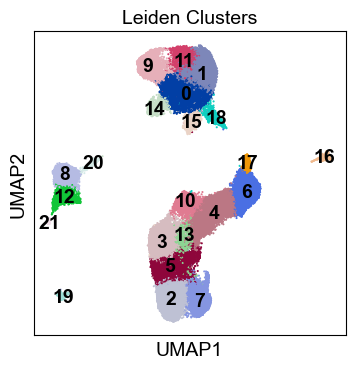

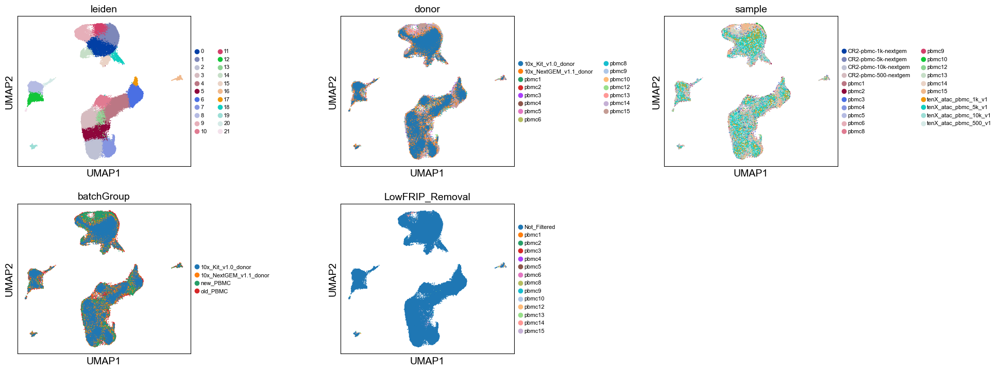

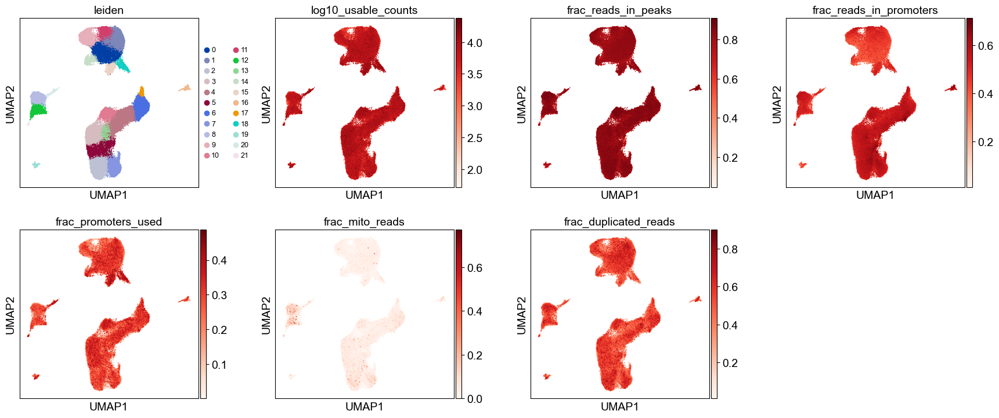

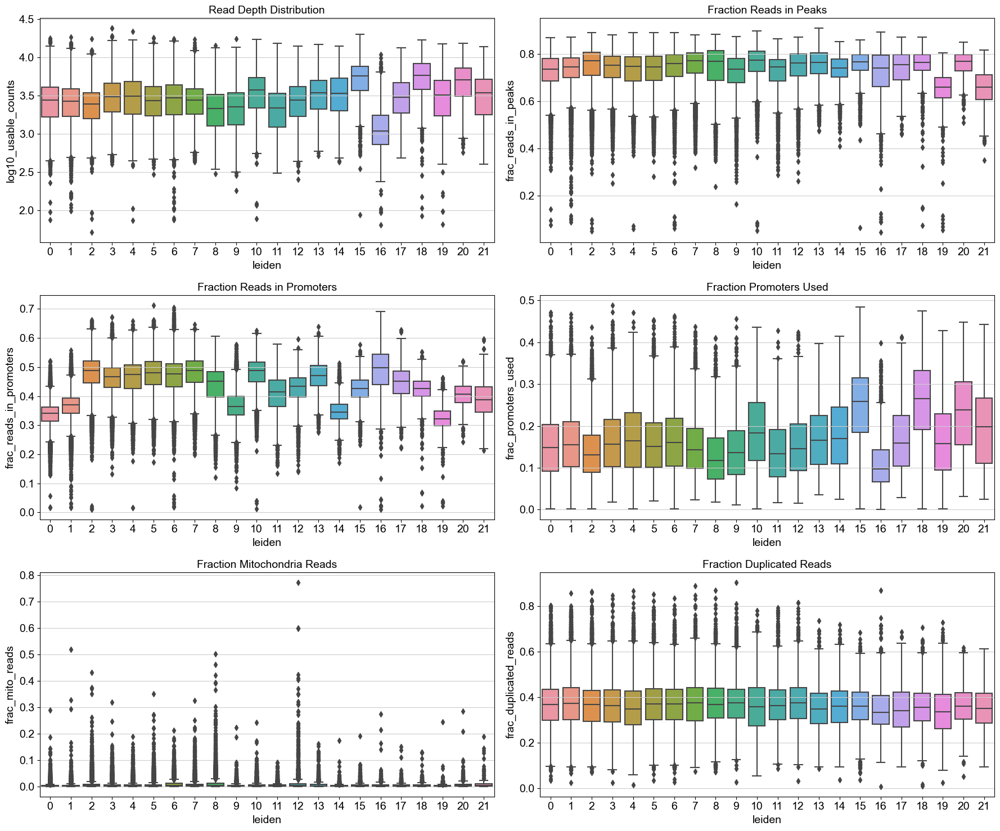

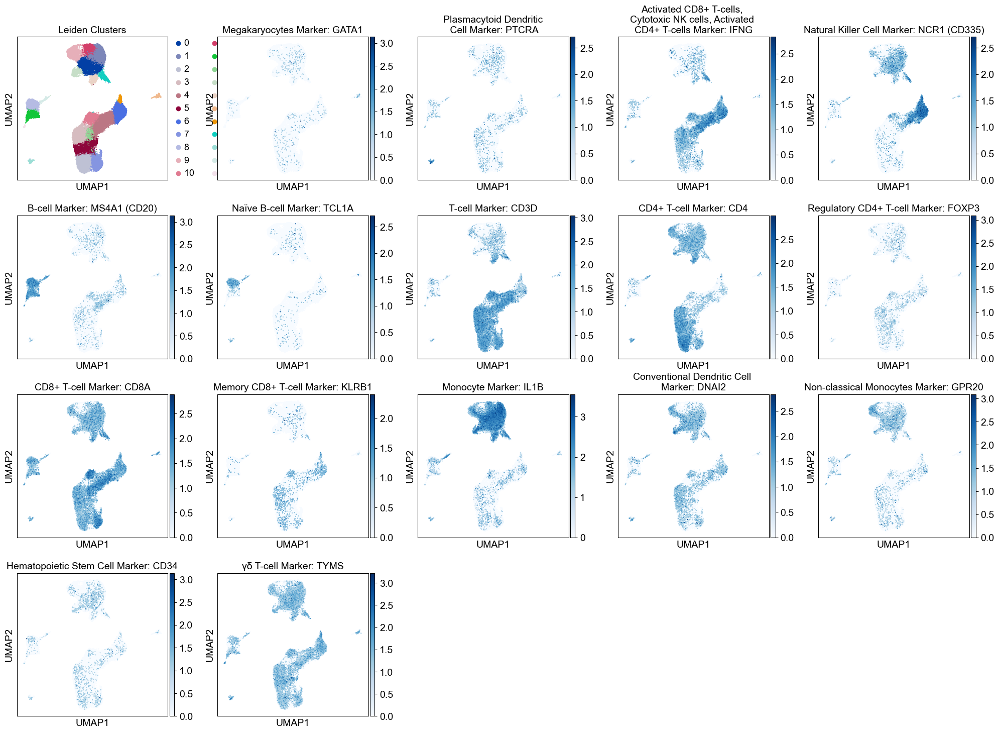

...

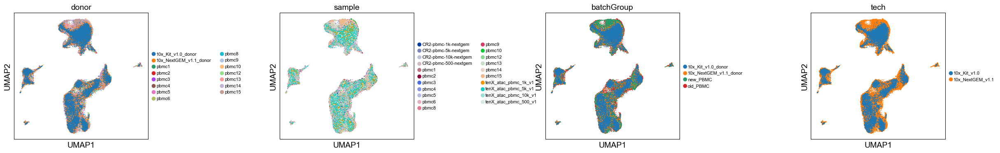

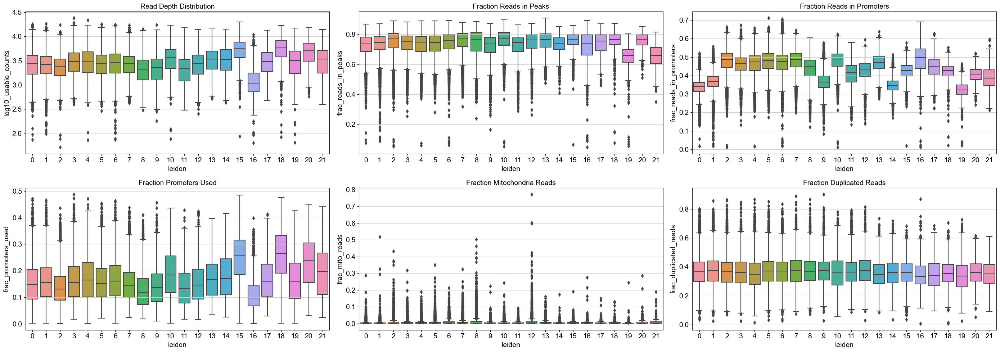

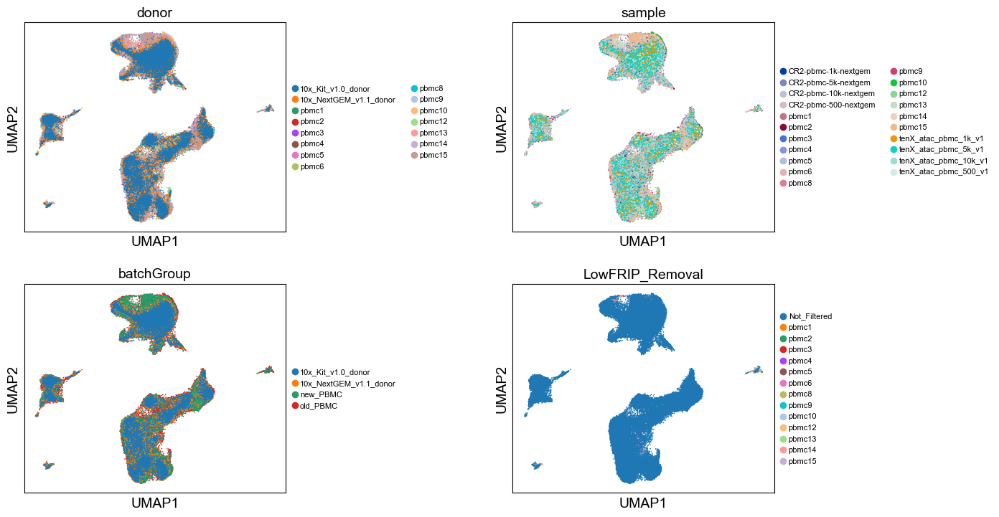

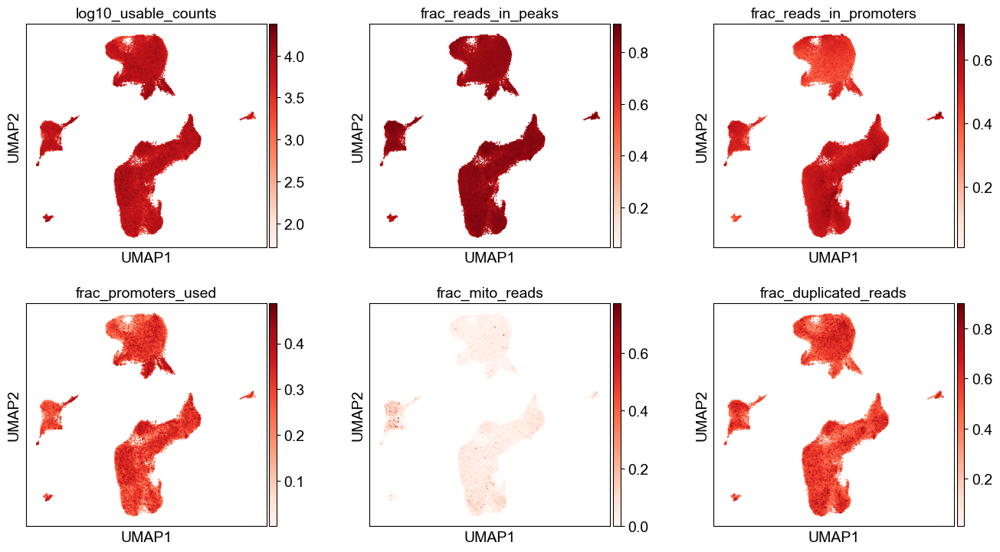

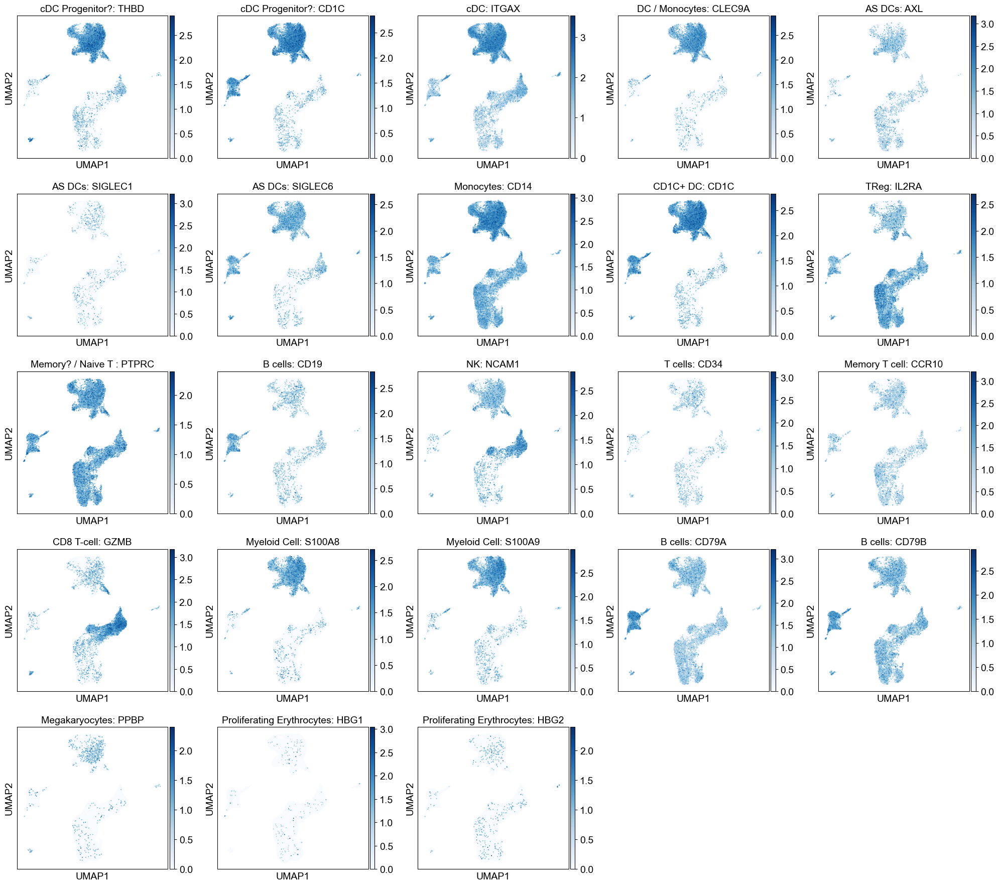

In [19]:
sc.pl.umap(adata_norm, color=['leiden'], size=9, legend_loc='on data', title='Leiden Clusters') 
sc.pl.umap(adata_norm, color=['leiden', 'donor', 'sample', 'batchGroup', 'LowFRIP_Removal'], \
           ncols=3, size=6, wspace=0.7 , legend_fontsize=8.0 )

sc.pl.umap(adata_norm, color=['leiden', 'log10_usable_counts', 'frac_reads_in_peaks',  \
                              'frac_reads_in_promoters', 'frac_promoters_used',  \
                              'frac_mito_reads', 'frac_duplicated_reads'],  \
                               ncols=4, color_map='Reds', size=6 , wspace=0.3 , legend_fontsize=9.0)
#                                legend_loc='on data')


# boxplot of read depth distribution (reads within highly variable windows)
fig, ax1 = plt.subplots(ncols = 2, nrows = 3,figsize=(18,15))
sns.boxplot(x='leiden', y='log10_usable_counts', \
            ax=ax1[0,0], data=adata_norm.obs).set_title("Read Depth Distribution")
sns.boxplot(x='leiden', y='frac_reads_in_peaks', \
            ax=ax1[0,1], data=adata_norm.obs).set_title("Fraction Reads in Peaks")
sns.boxplot(x='leiden', y='frac_reads_in_promoters', \
            ax=ax1[1,0], data=adata_norm.obs).set_title("Fraction Reads in Promoters")
sns.boxplot(x='leiden', y='frac_promoters_used', ax=ax1[1,1], \
            data=adata_norm.obs).set_title('Fraction Promoters Used')
sns.boxplot(x='leiden', y='frac_mito_reads', ax=ax1[2,0], \
            data=adata_norm.obs).set_title('Fraction Mitochondria Reads')
sns.boxplot(x='leiden', y='frac_duplicated_reads', ax=ax1[2,1], \
            data=adata_norm.obs).set_title('Fraction Duplicated Reads')

fig.tight_layout()

plt.show()




leidenTitle =  'Leiden Clusters'
sc.pl.umap(adata_norm, \
           color= ['leiden', 'GATA1','PTCRA','IFNG', 'NCR1','MS4A1','TCL1A', \
                   'CD3D','CD4','FOXP3', 'CD8A','KLRB1','IL1B', 'DNAI2','GPR20', 'CD34', 'TYMS'], \
           size=8, ncols = 5, color_map='Blues', frameon=True, \
           title= [leidenTitle, 'Megakaryocytes Marker: GATA1','Plasmacytoid Dendritic\n Cell Marker: PTCRA', \
                     'Activated CD8+ T-cells, \nCytotoxic NK cells, Activated \nCD4+ T-cells Marker: IFNG', \
                     'Natural Killer Cell Marker: NCR1 (CD335)','B-cell Marker: MS4A1 (CD20)','Naïve B-cell Marker: TCL1A',  \
                     'T-cell Marker: CD3D','CD4+ T-cell Marker: CD4','Regulatory CD4+ T-cell Marker: FOXP3',  \
                     'CD8+ T-cell Marker: CD8A','Memory CD8+ T-cell Marker: KLRB1','Monocyte Marker: IL1B', \
                     'Conventional Dendritic Cell \nMarker: DNAI2','Non-classical Monocytes Marker: GPR20', \
                      'Hematopoietic Stem Cell Marker: CD34', 'γδ T-cell Marker: TYMS'])


sc.pl.umap(adata_norm, color=['leiden'], size=9, legend_loc='on data', title='Leiden Clusters') 
sc.pl.umap(adata_norm, color=['donor', 'sample', 'batchGroup', 'tech'], \
           ncols=4, size=6, wspace=0.8 , legend_fontsize=8.0 )



# boxplot of read depth distribution (reads within highly variable windows)
fig, ax1 = plt.subplots(ncols = 3, nrows = 2,figsize=(28,10))
sns.boxplot(x='leiden', y='log10_usable_counts', \
            ax=ax1[0,0], data=adata_norm.obs).set_title("Read Depth Distribution")
sns.boxplot(x='leiden', y='frac_reads_in_peaks', \
            ax=ax1[0,1], data=adata_norm.obs).set_title("Fraction Reads in Peaks")
sns.boxplot(x='leiden', y='frac_reads_in_promoters', \
            ax=ax1[0,2], data=adata_norm.obs).set_title("Fraction Reads in Promoters")
sns.boxplot(x='leiden', y='frac_promoters_used', ax=ax1[1,0], \
            data=adata_norm.obs).set_title('Fraction Promoters Used')
sns.boxplot(x='leiden', y='frac_mito_reads', ax=ax1[1,1], \
            data=adata_norm.obs).set_title('Fraction Mitochondria Reads')
sns.boxplot(x='leiden', y='frac_duplicated_reads', ax=ax1[1,2], \
            data=adata_norm.obs).set_title('Fraction Duplicated Reads')

fig.tight_layout()

plt.show()
sc.pl.umap(adata_norm, color=['donor', 'sample', 'batchGroup', 'LowFRIP_Removal'], \
           ncols=2, size=6, wspace=0.7 , legend_fontsize=8.0 )

sc.pl.umap(adata_norm, color=[ 'log10_usable_counts', 'frac_reads_in_peaks',  \
                              'frac_reads_in_promoters', 'frac_promoters_used',  \
                              'frac_mito_reads', 'frac_duplicated_reads'],  \
                               ncols=3, color_map='Reds', size=6 , wspace=0.3 , legend_fontsize=9.0)
#                                legend_loc='on data')
sc.pl.umap(adata_norm, \
           color= experimentalGeneList, \
           size=8, ncols = 5, color_map='Blues', frameon=True, \
           title= experimentalGeneTitleList)


In [20]:
adata_norm.obs.head()

,donor,sample,batchGroup,tech,unique_usable_reads,total_sequenced_reads,duplicated_reads,unique_mito_reads,reads_in_peaks,reads_in_promoters,...,frac_reads_in_promoters,frac_promoters_used,frac_mito_reads,frac_duplicated_reads,log10_unique_usable_reads,n_counts,LowFRIP_Removal,leiden,log10_usable_counts,norm
pbmc1_AAACGAAAGAAAGGGT,pbmc1,pbmc1,old_PBMC,10x_NextGEM_v1.1,18920,27626,8419,146,13178,7862,...,0.415539,0.160964,0.007658,0.304749,4.276944,19042.0,Not_Filtered,6,3.450249,0
pbmc1_AAACGAAAGAGCCTGA,pbmc1,pbmc1,old_PBMC,10x_NextGEM_v1.1,15153,21446,6004,206,11537,7113,...,0.469412,0.144681,0.013412,0.279959,4.180527,15395.0,Not_Filtered,6,3.407391,0
pbmc1_AAACGAAAGCGAGAAA,pbmc1,pbmc1,old_PBMC,10x_NextGEM_v1.1,10532,15859,5106,148,7224,3565,...,0.338492,0.079706,0.013858,0.321962,4.022552,10602.0,Not_Filtered,9,3.149527,0
pbmc1_AAACGAAAGCTCCGGT,pbmc1,pbmc1,old_PBMC,10x_NextGEM_v1.1,9238,13882,4608,4,6766,4275,...,0.462763,0.092319,0.000433,0.331941,3.965625,9260.0,Not_Filtered,4,3.247236,0
pbmc1_AAACGAAAGTACTCTG,pbmc1,pbmc1,old_PBMC,10x_NextGEM_v1.1,12723,18557,5423,304,8009,3869,...,0.304095,0.088339,0.023336,0.292235,4.104624,12626.0,Not_Filtered,0,3.172603,0


running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 41 clusters and added
    'subset', the cluster labels (adata.obs, categorical) (0:00:05)


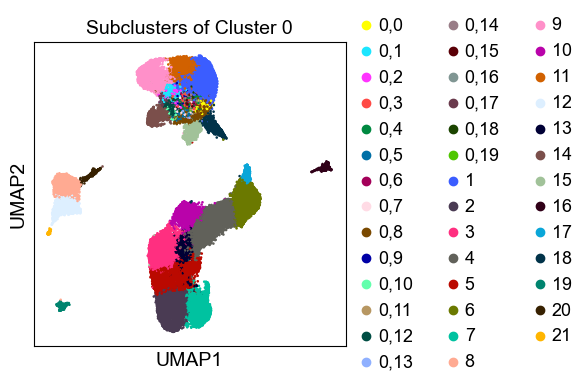

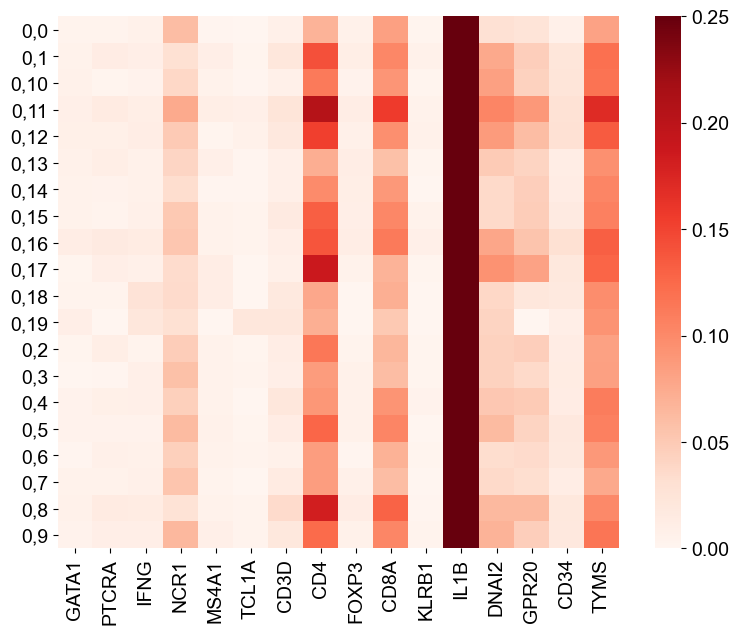

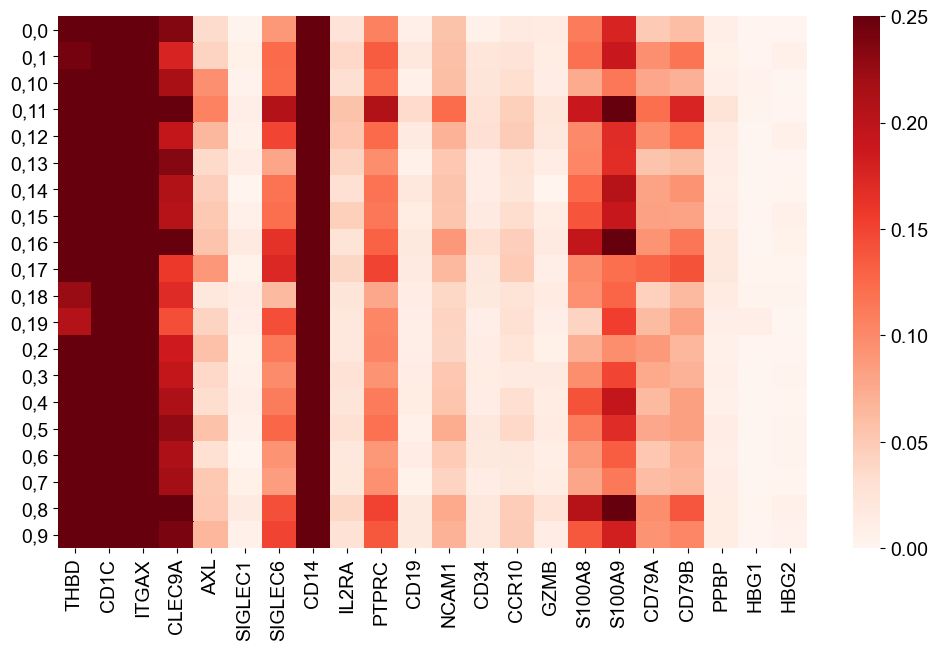

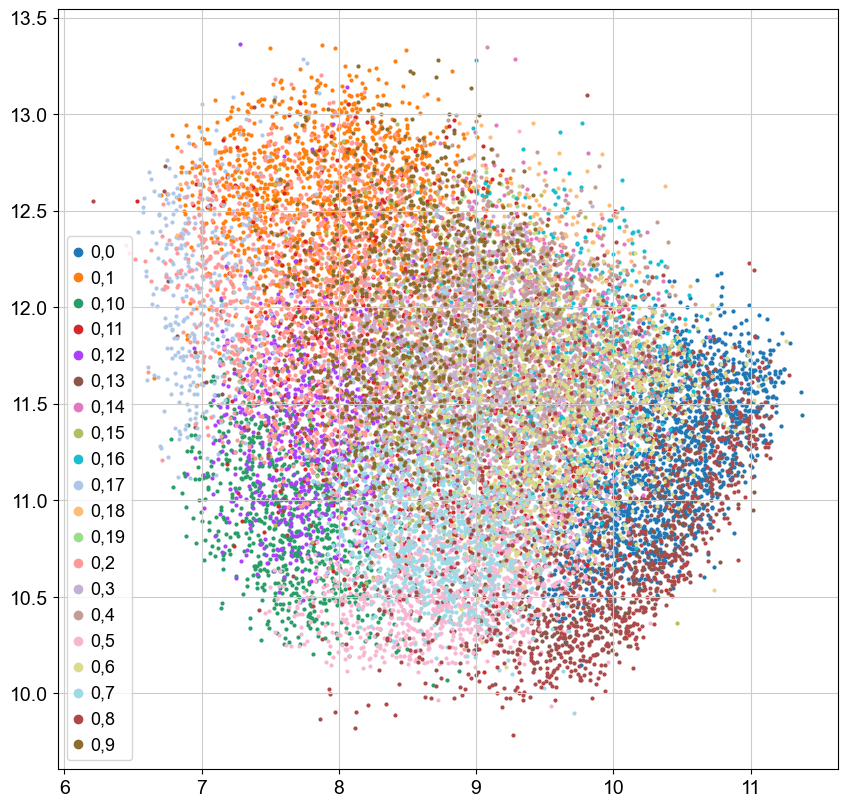

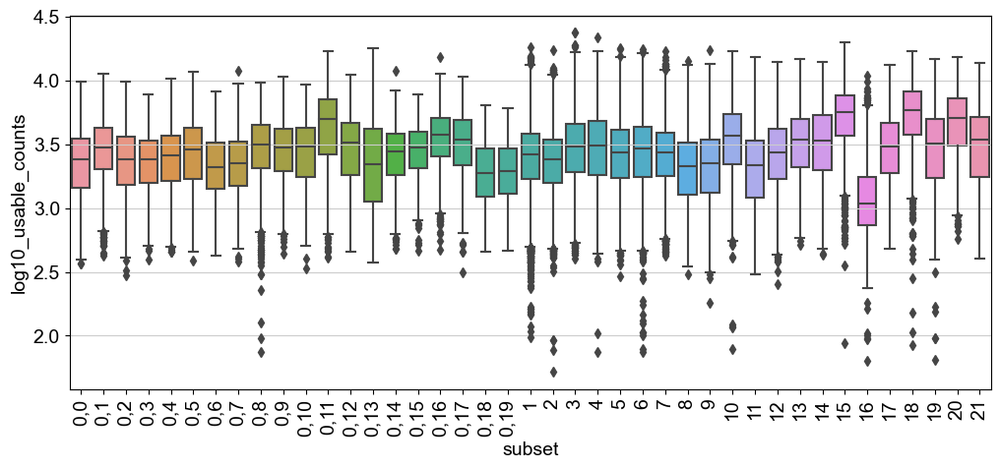

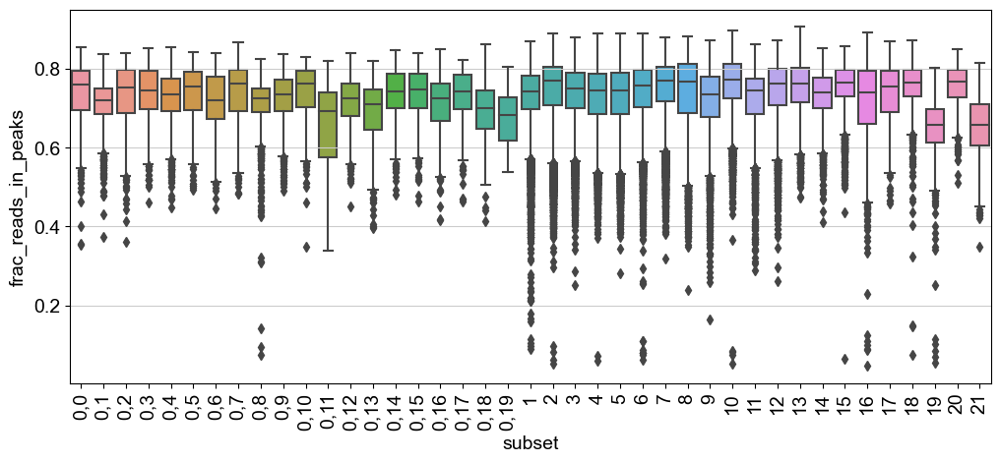

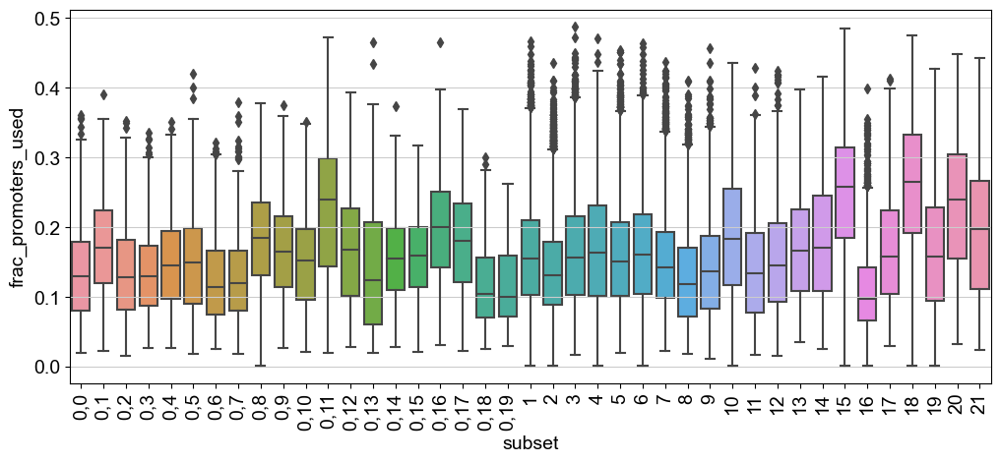

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 41 clusters and added
    'subset', the cluster labels (adata.obs, categorical) (0:00:04)


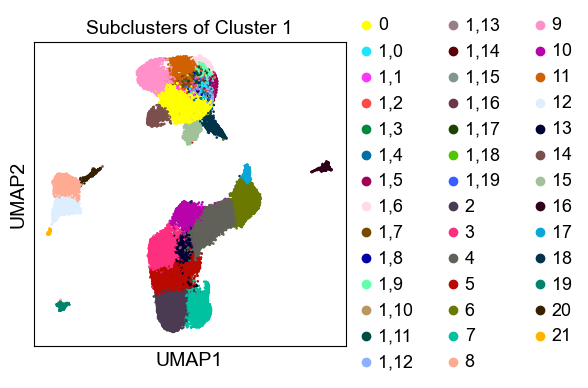

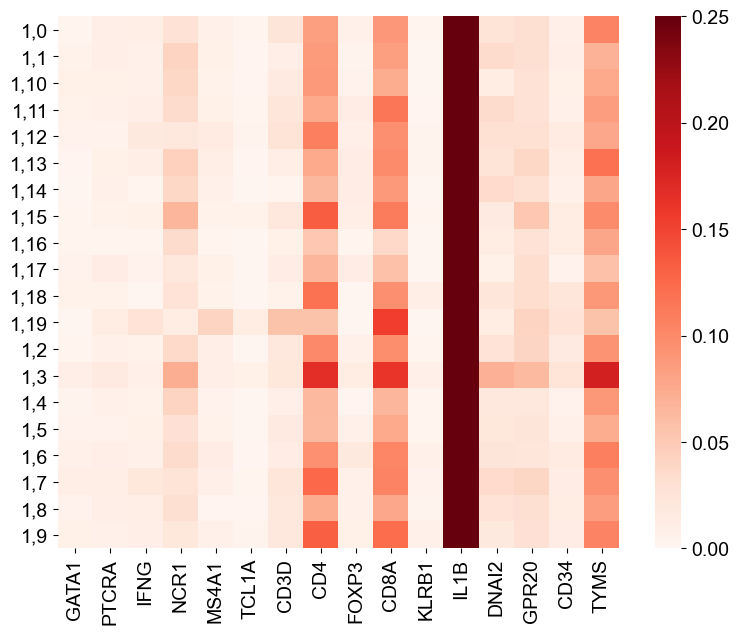

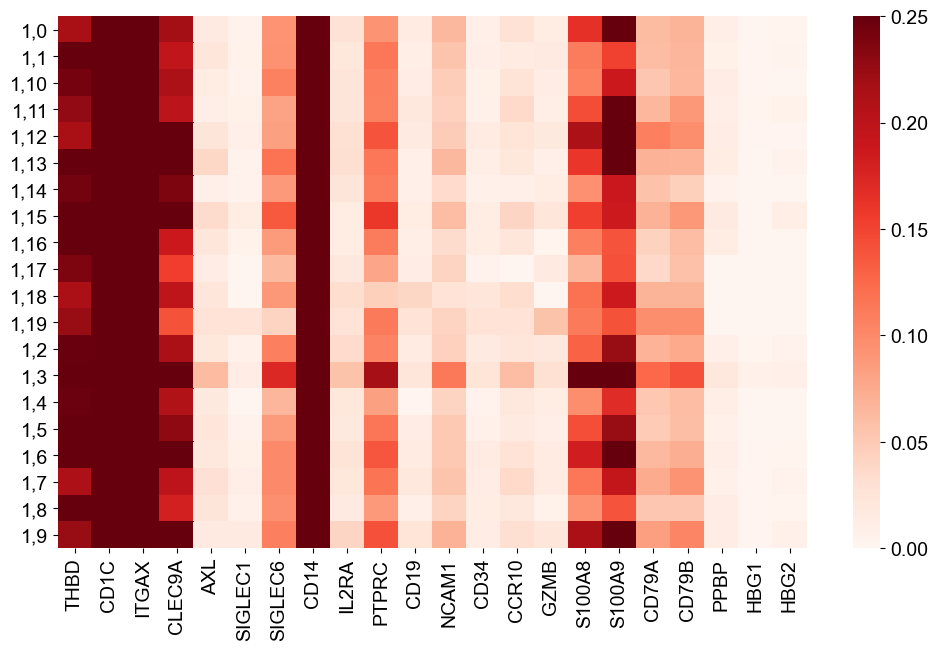

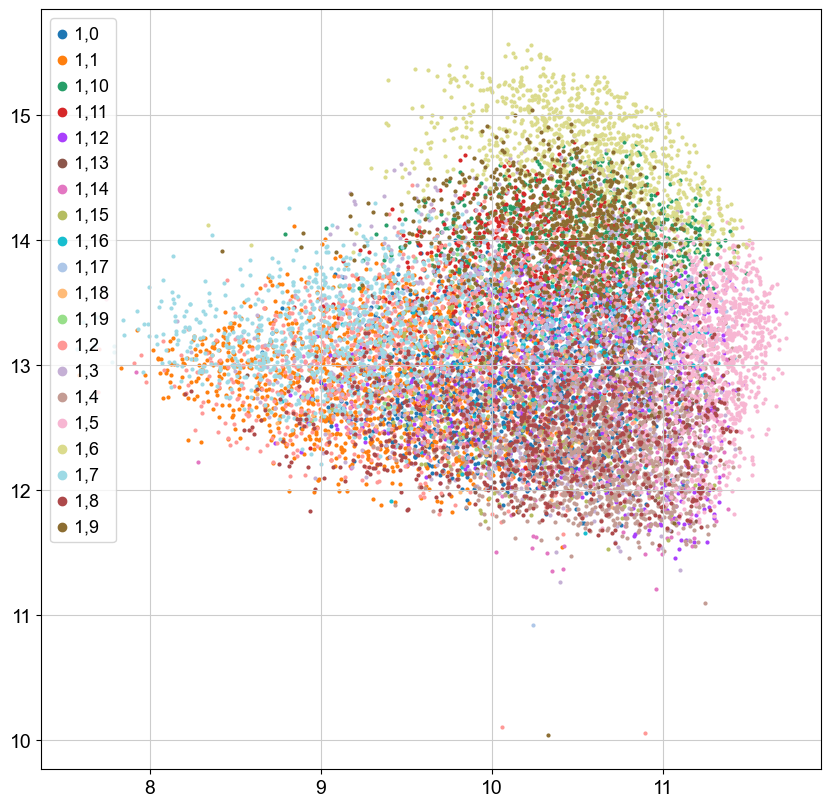

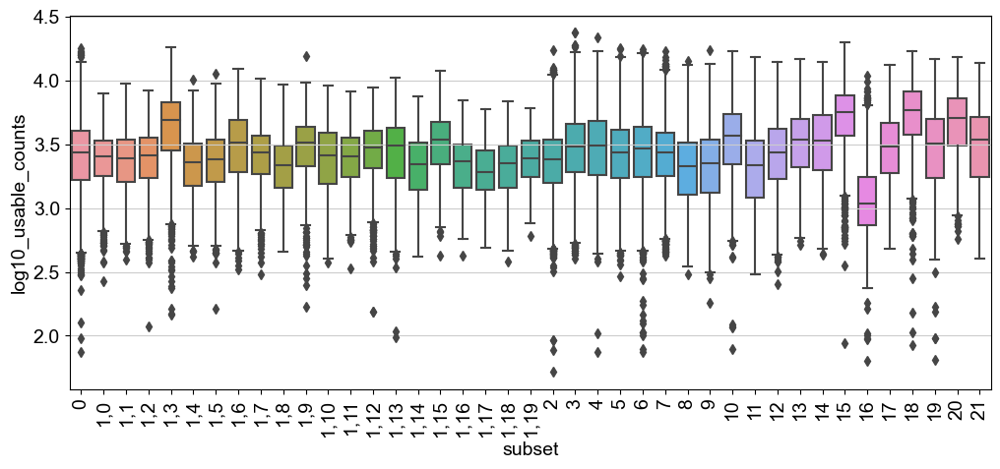

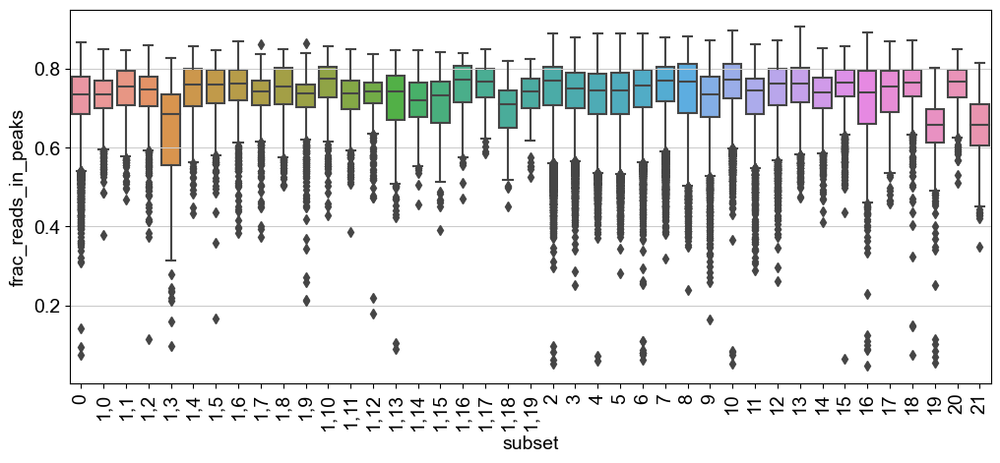

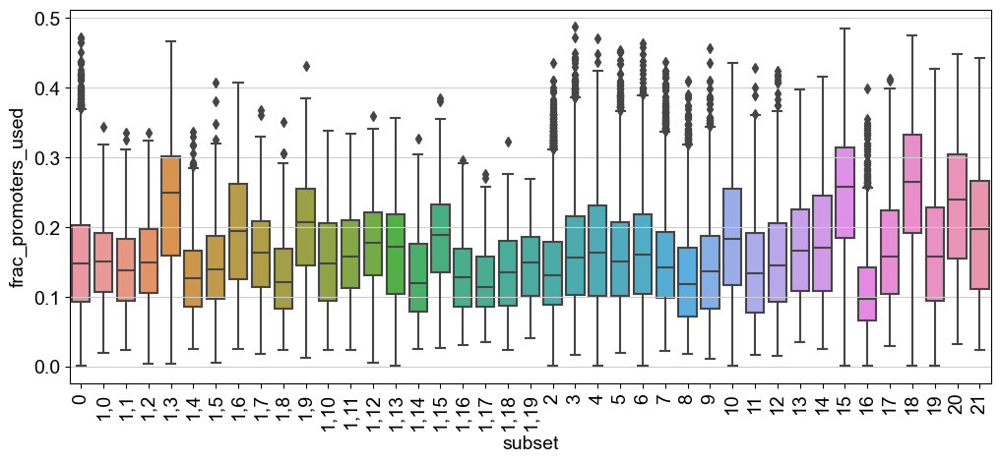

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 40 clusters and added
    'subset', the cluster labels (adata.obs, categorical) (0:00:05)


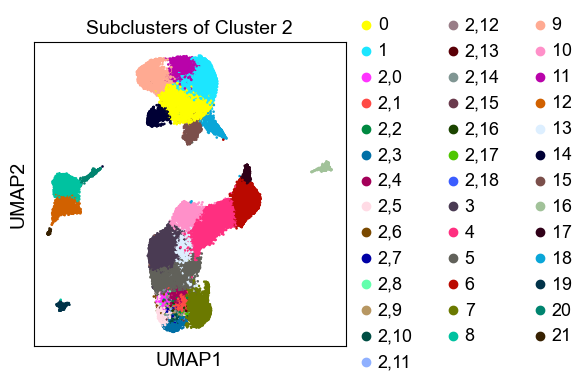

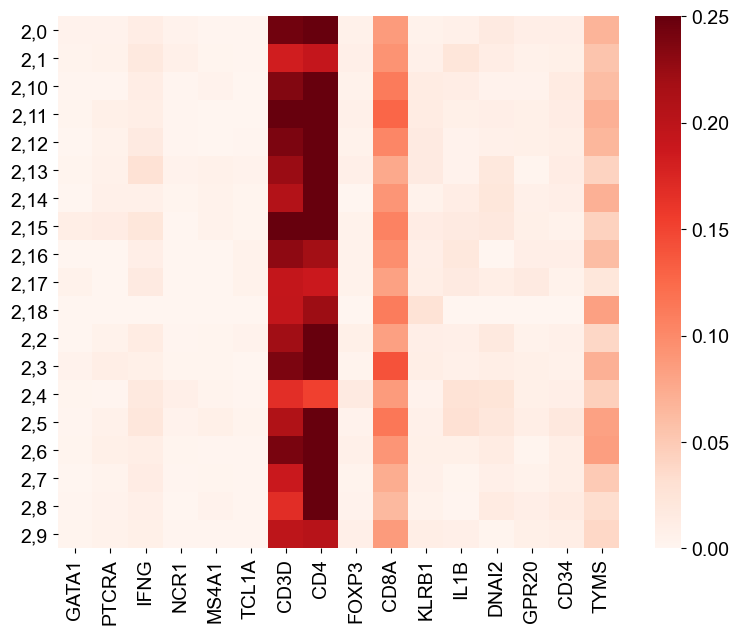

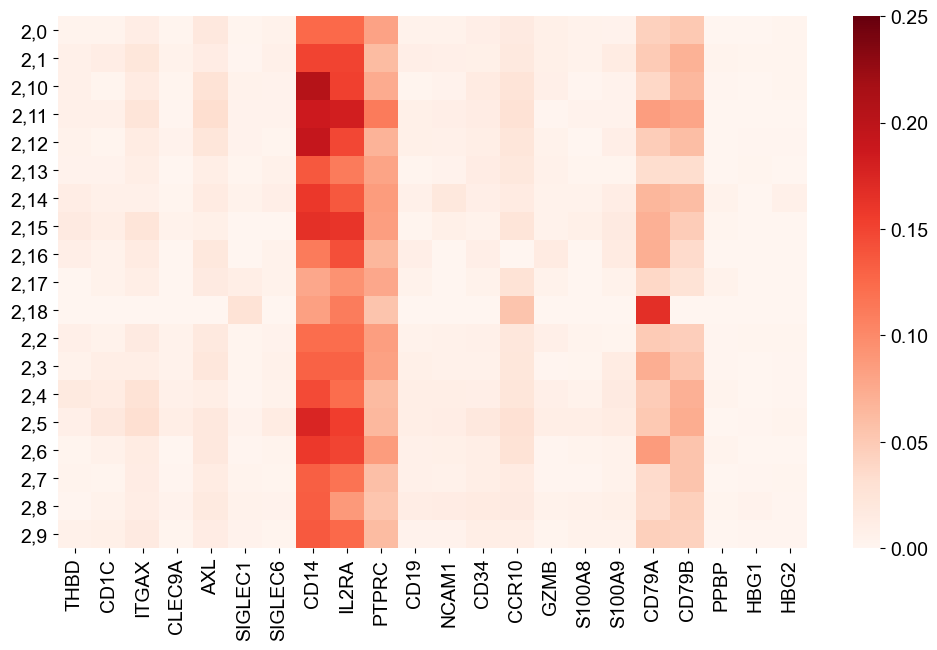

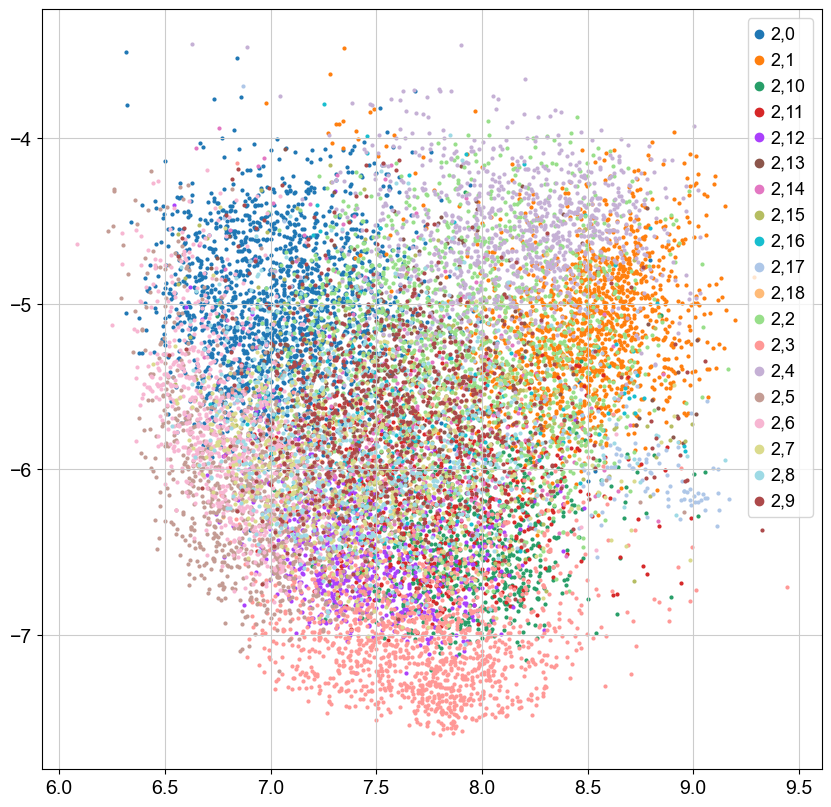

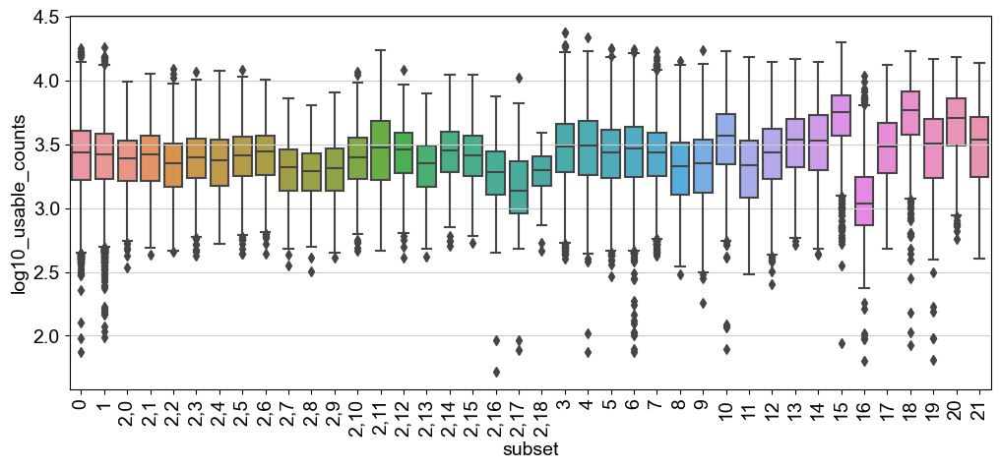

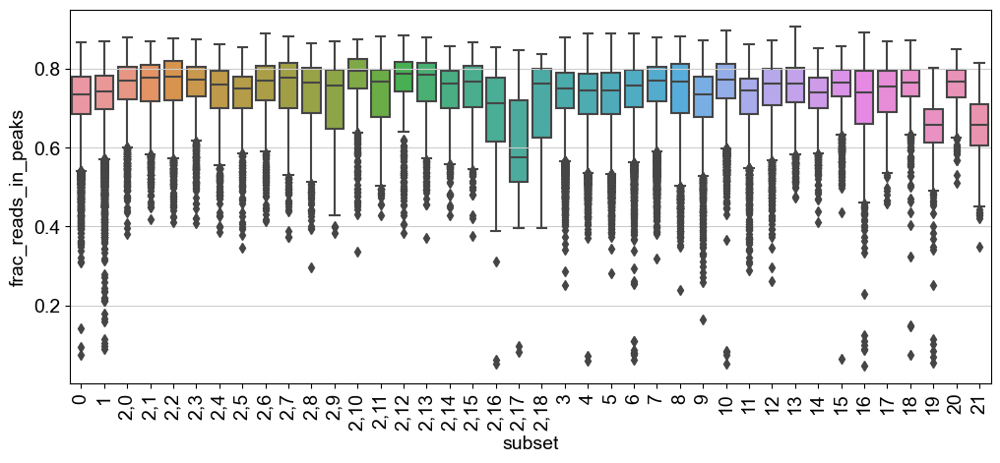

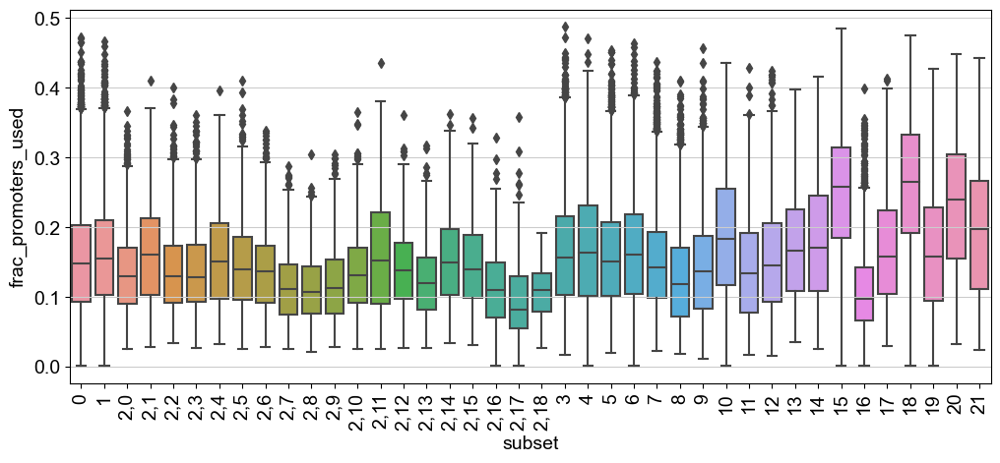

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 40 clusters and added
    'subset', the cluster labels (adata.obs, categorical) (0:00:02)


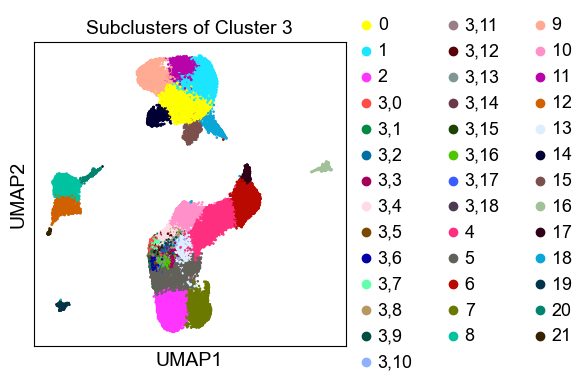

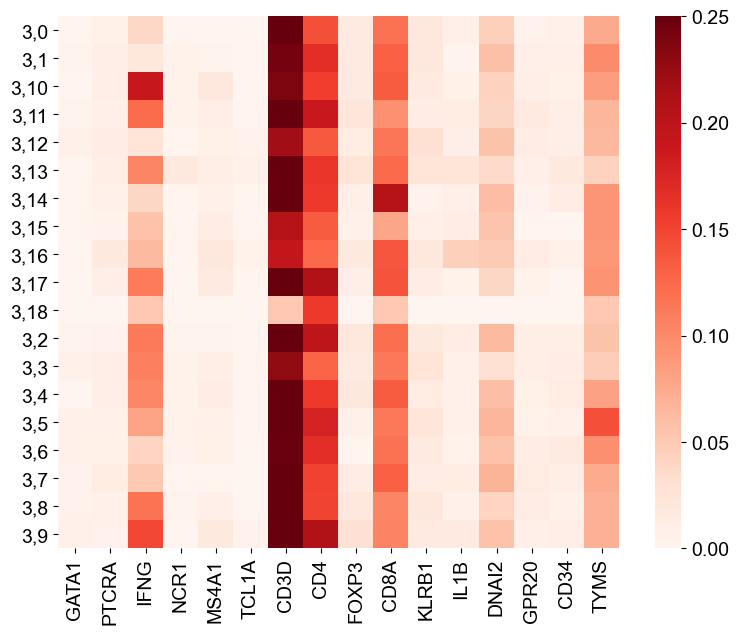

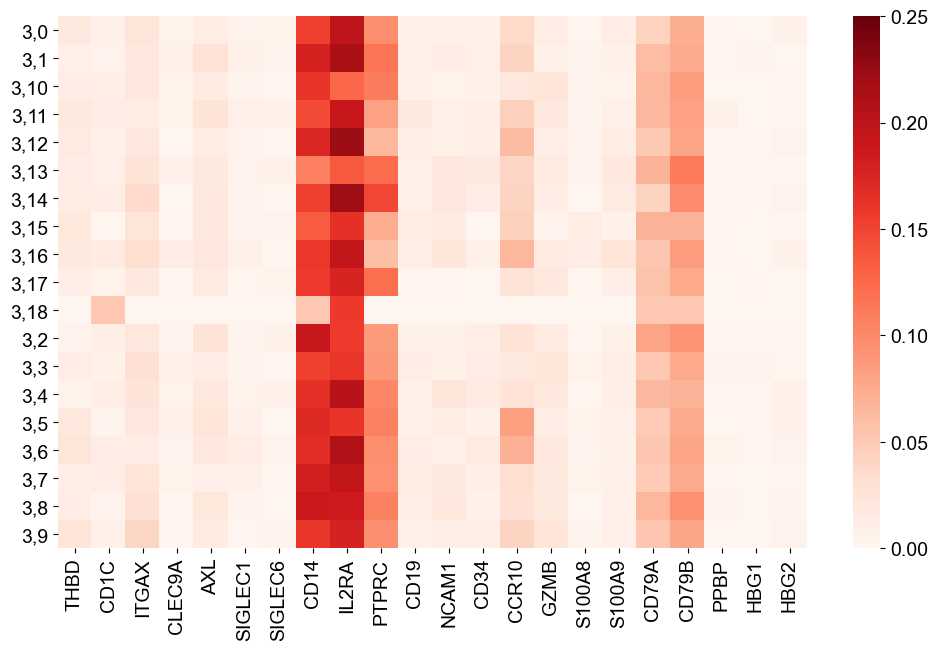

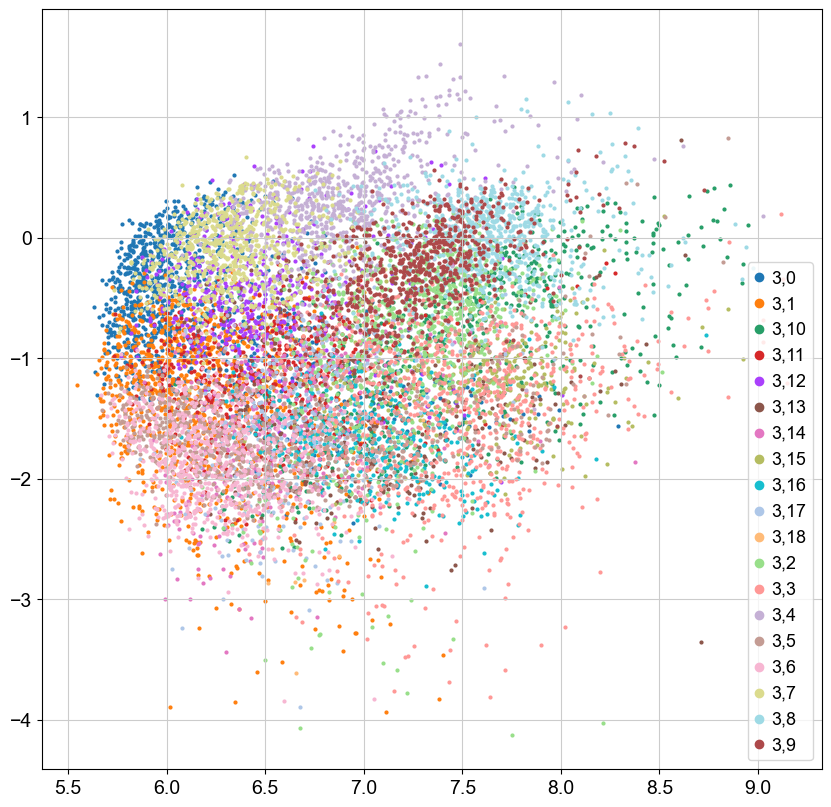

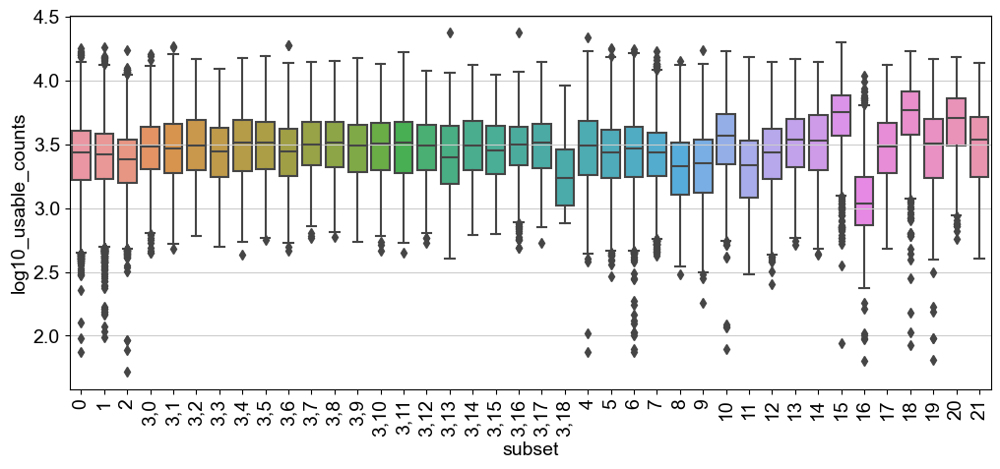

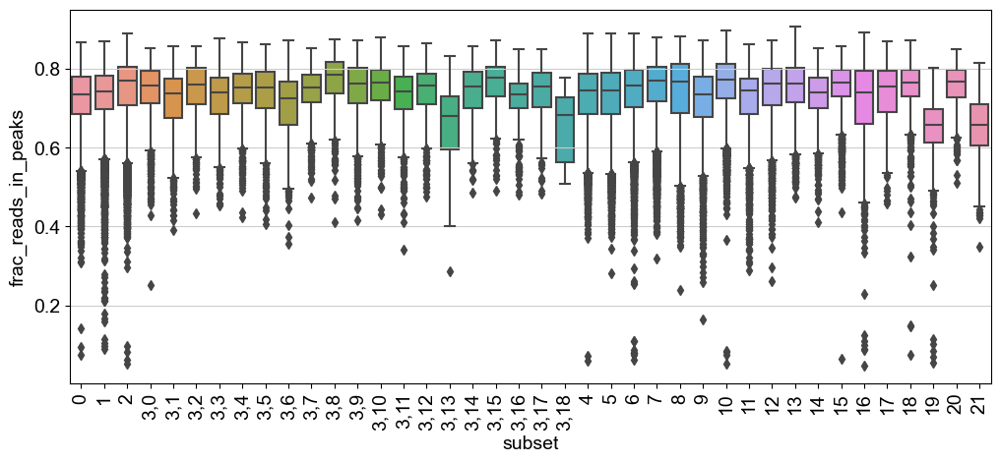

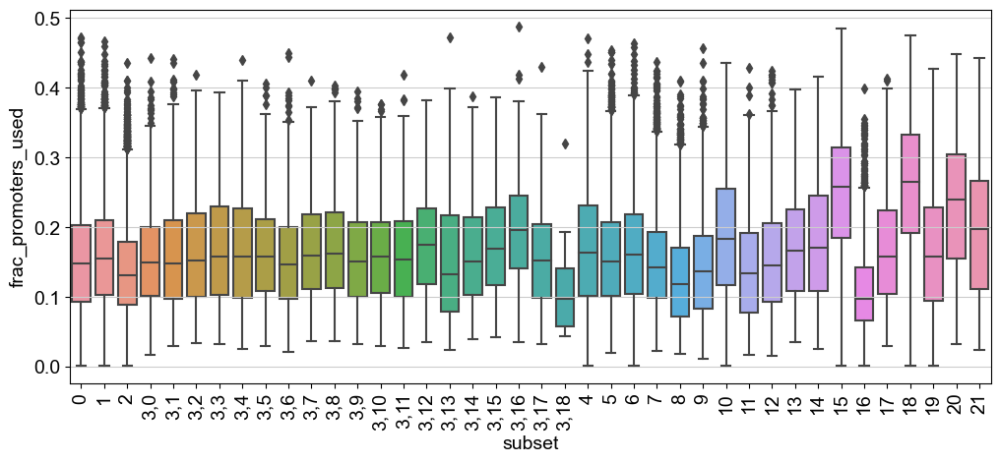

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 36 clusters and added
    'subset', the cluster labels (adata.obs, categorical) (0:00:03)


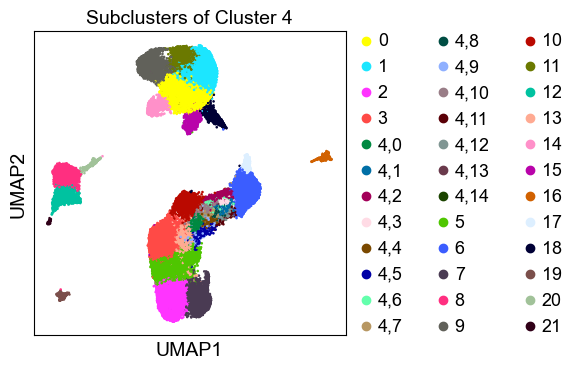

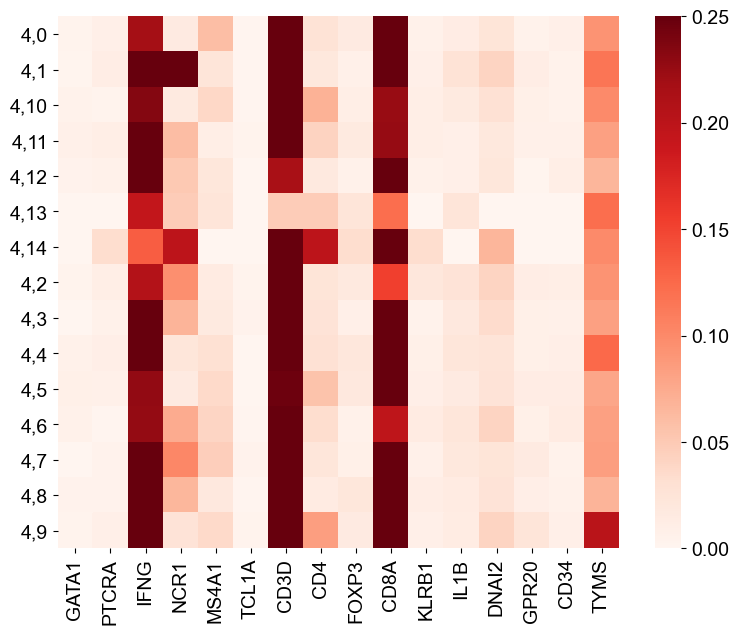

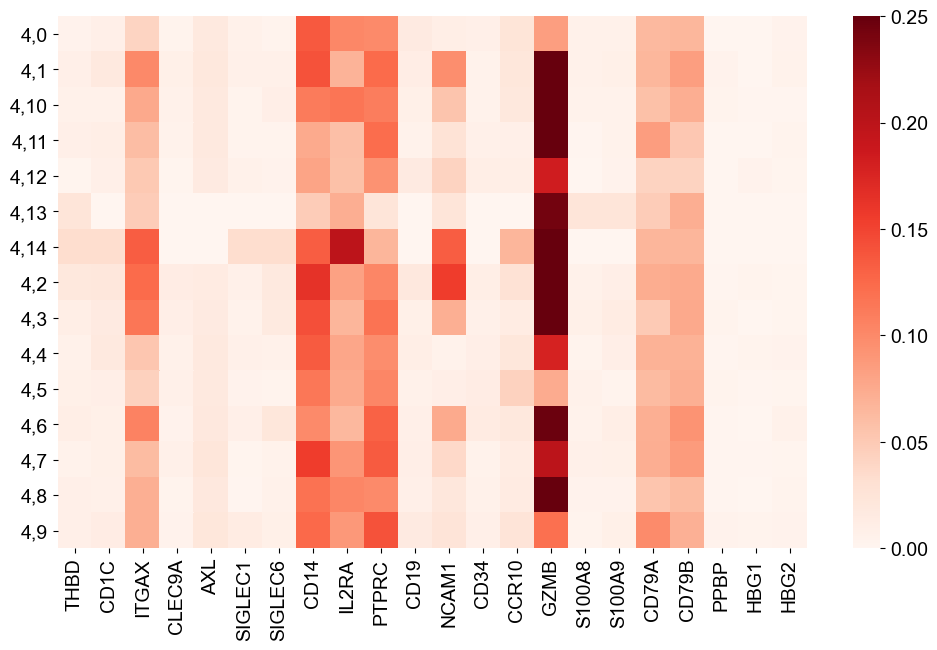

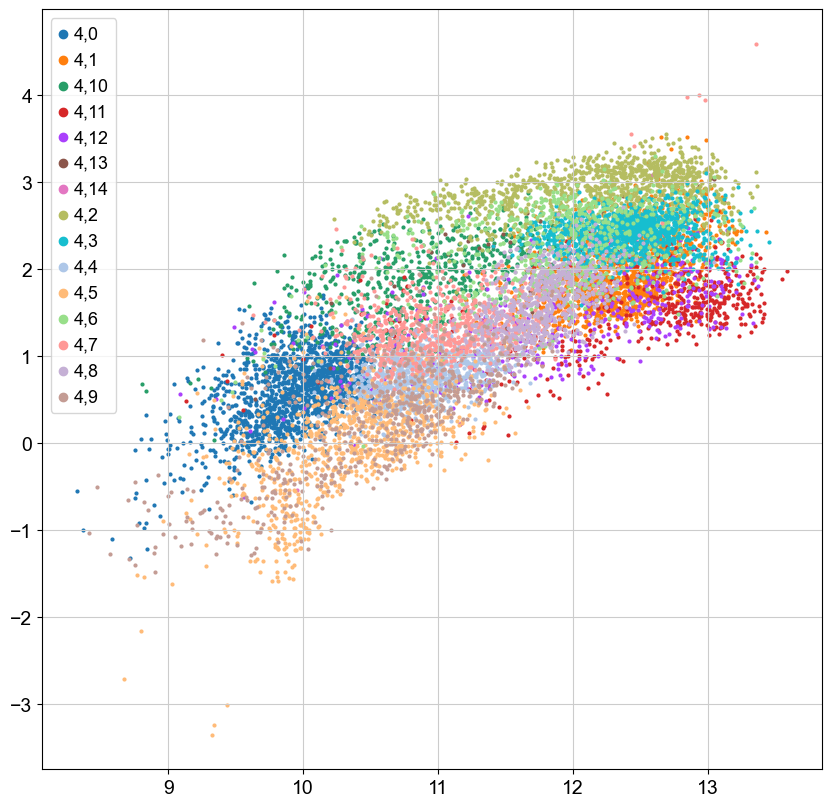

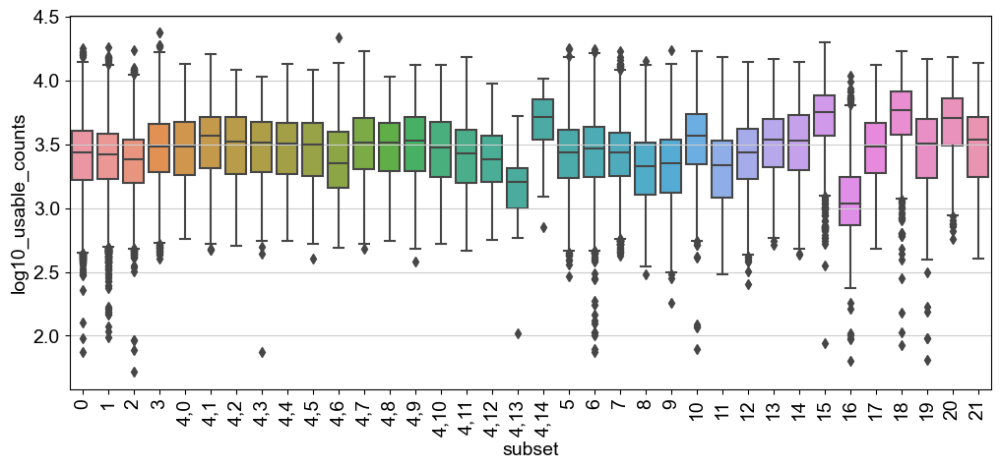

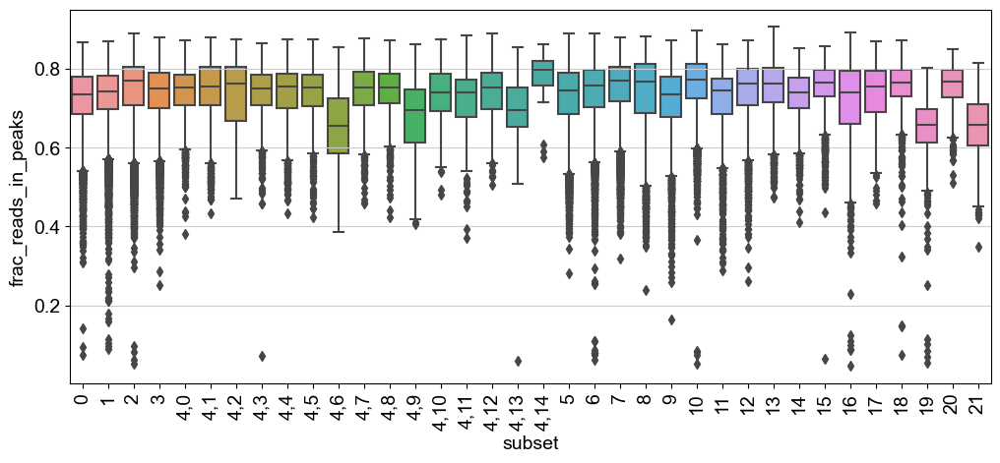

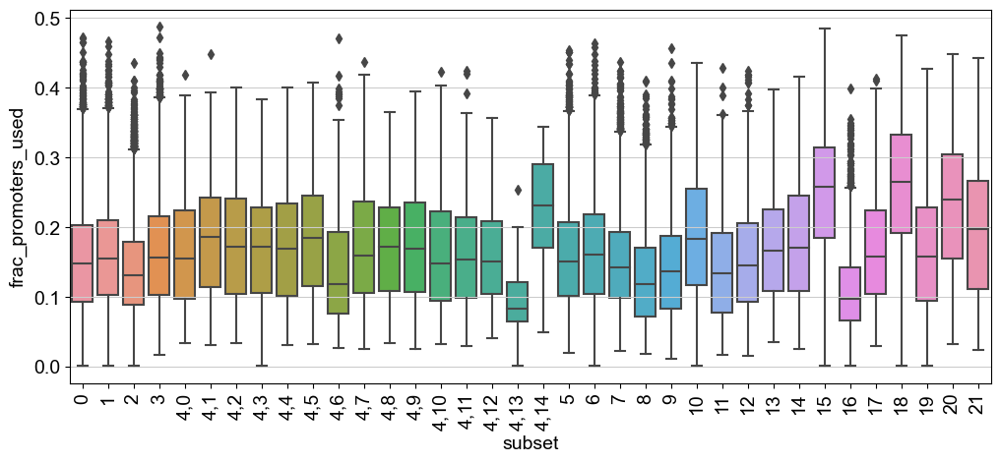

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 37 clusters and added
    'subset', the cluster labels (adata.obs, categorical) (0:00:03)


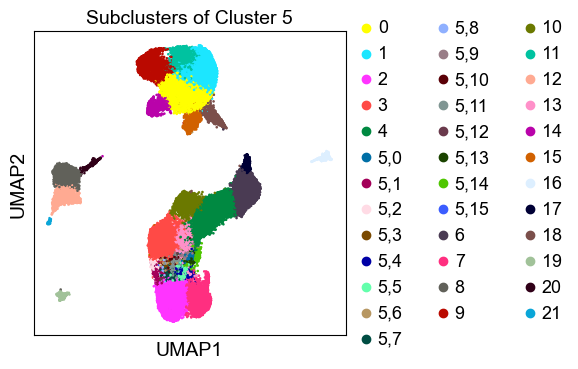

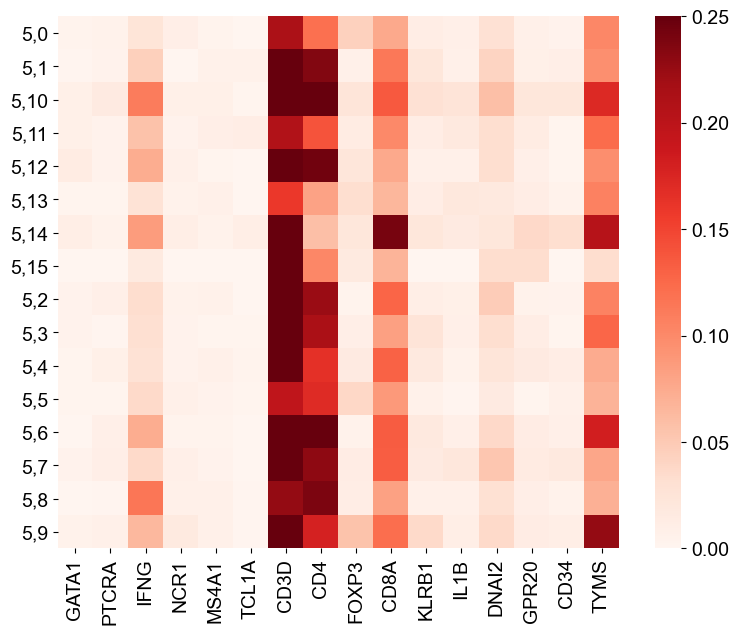

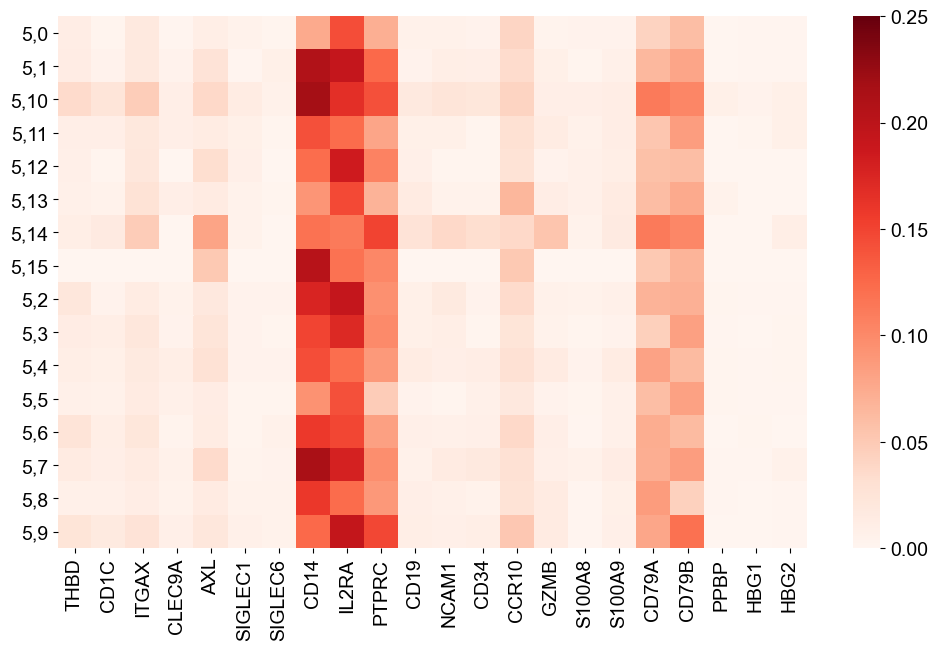

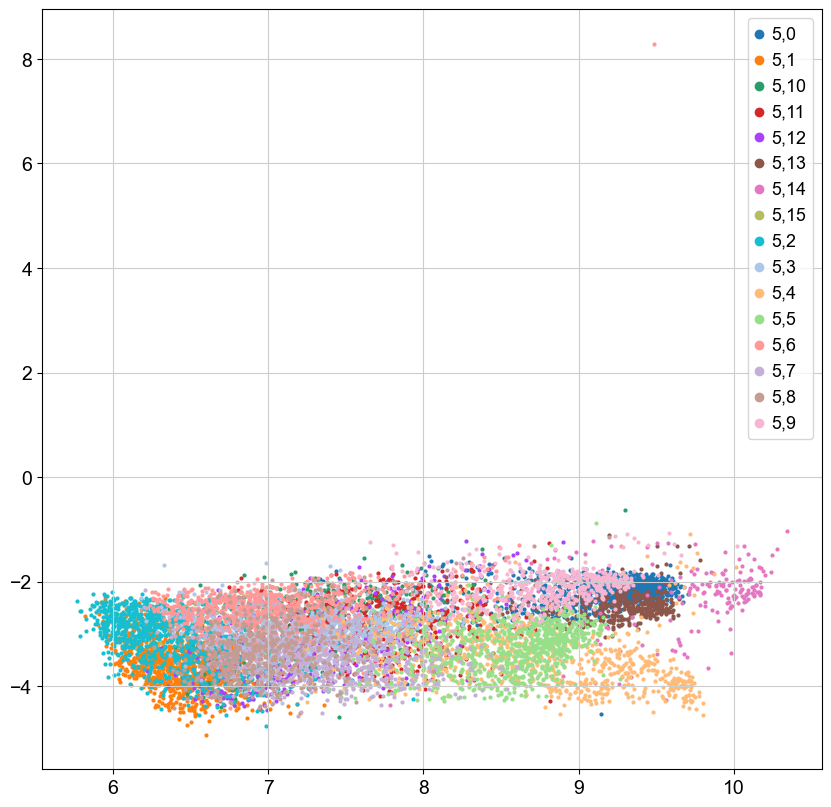

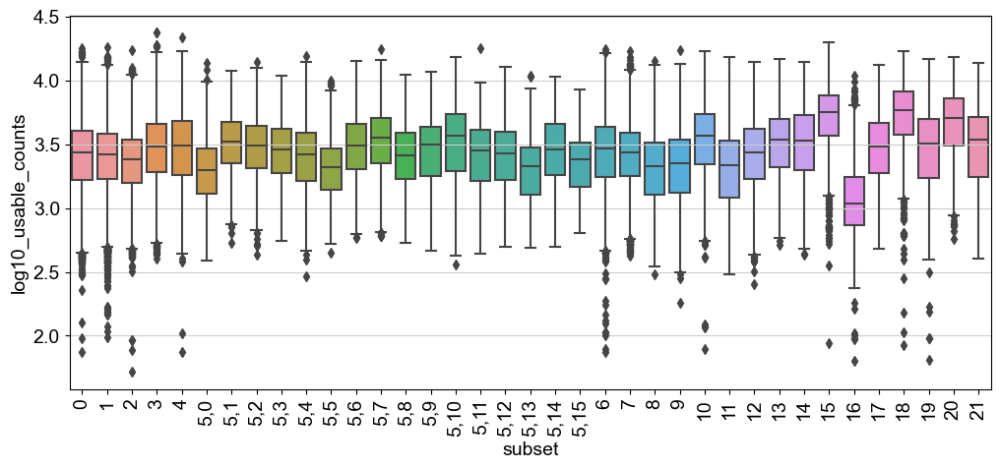

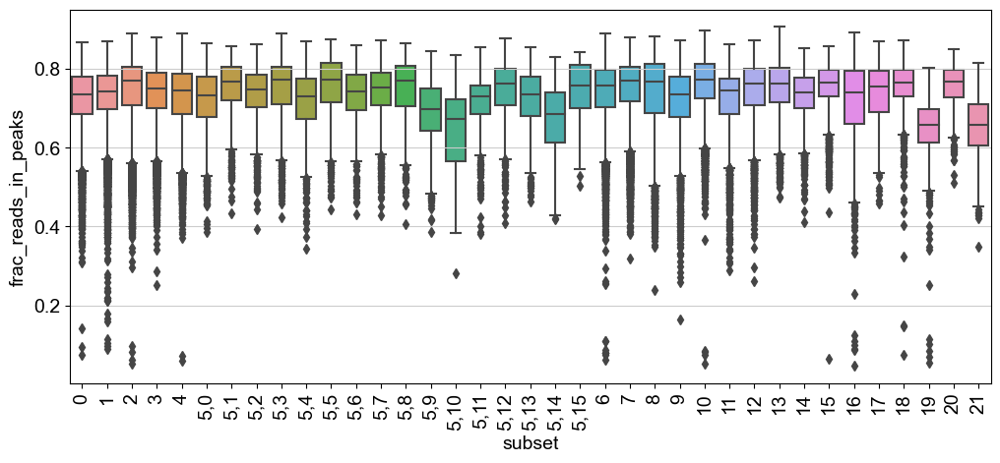

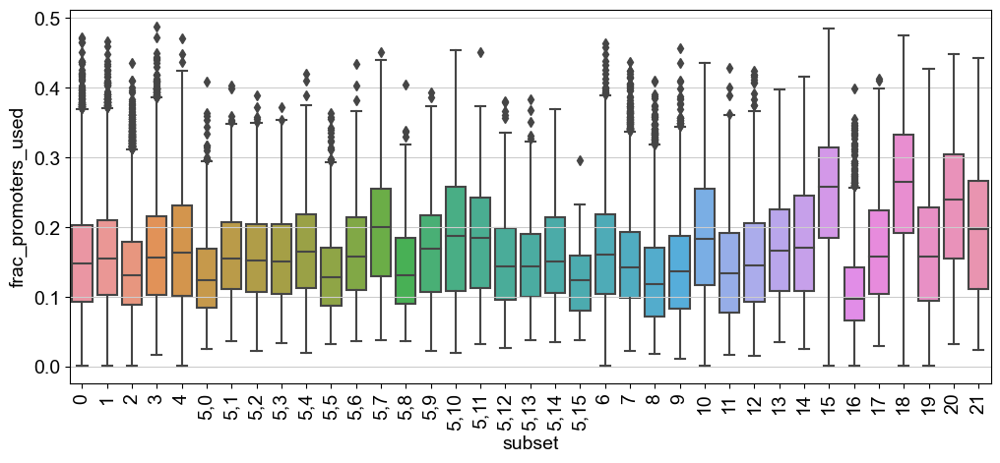

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 39 clusters and added
    'subset', the cluster labels (adata.obs, categorical) (0:00:02)


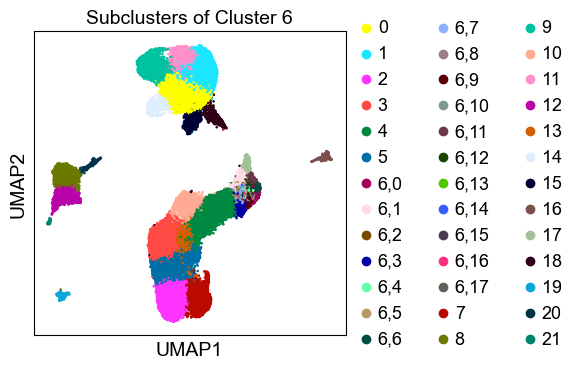

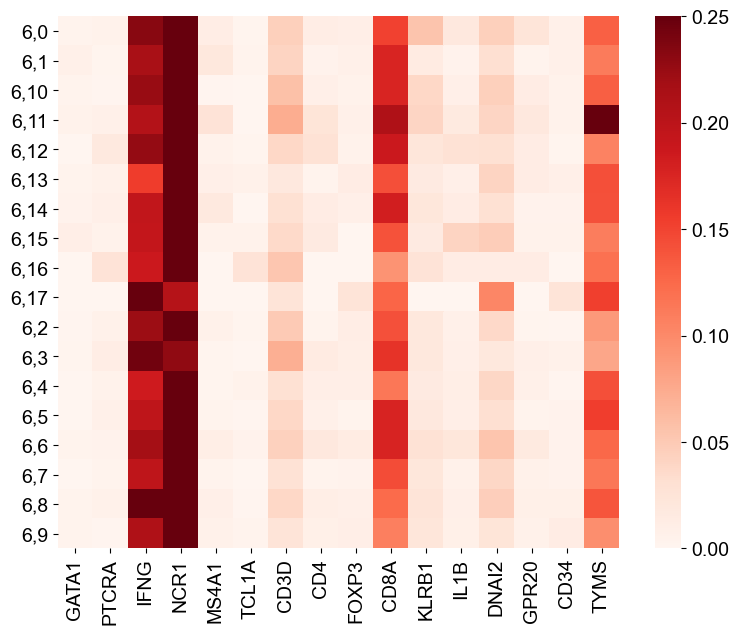

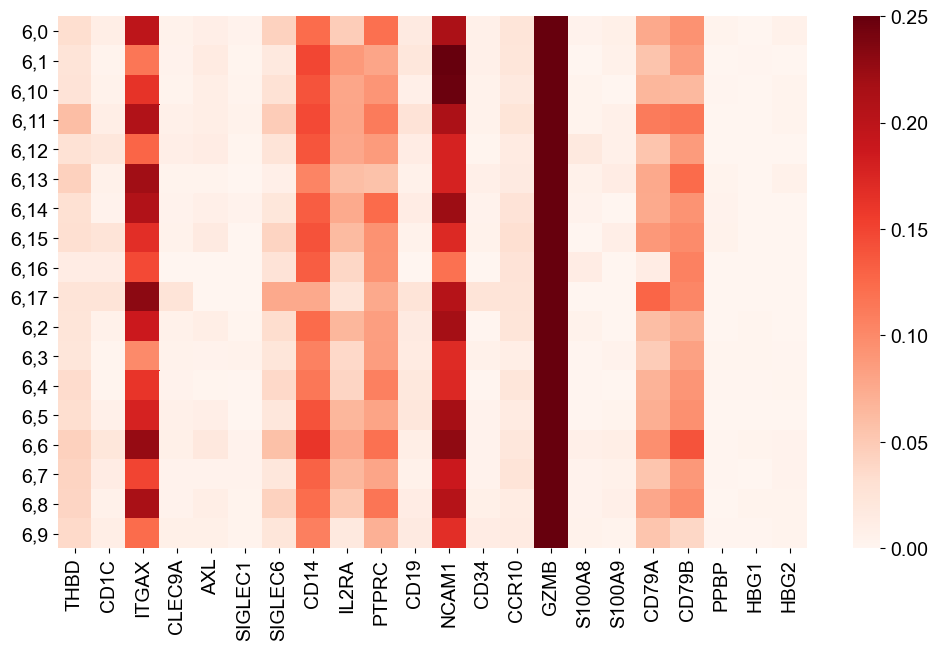

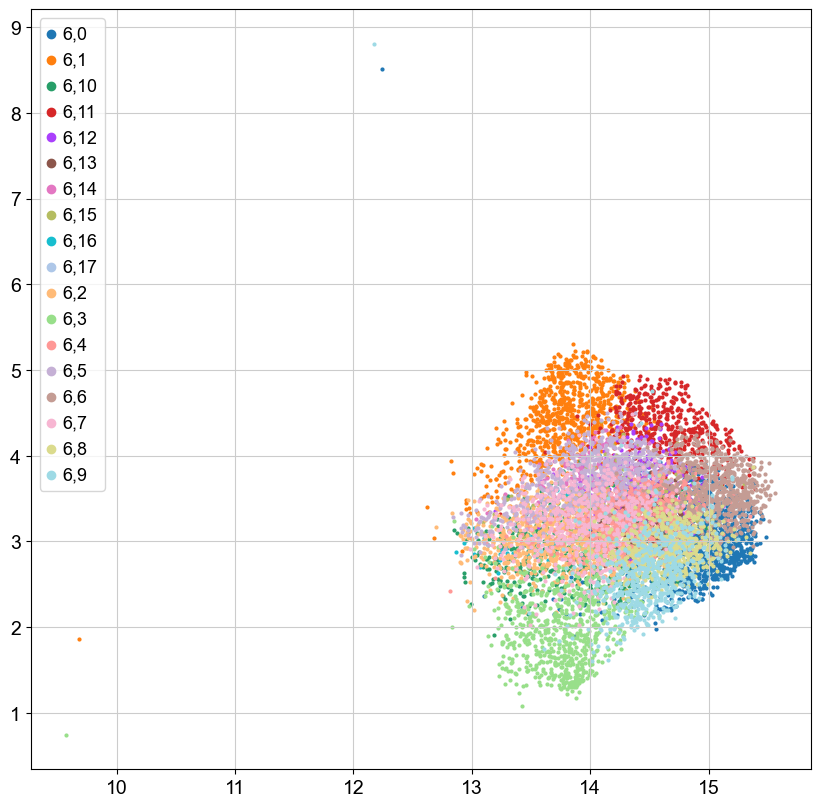

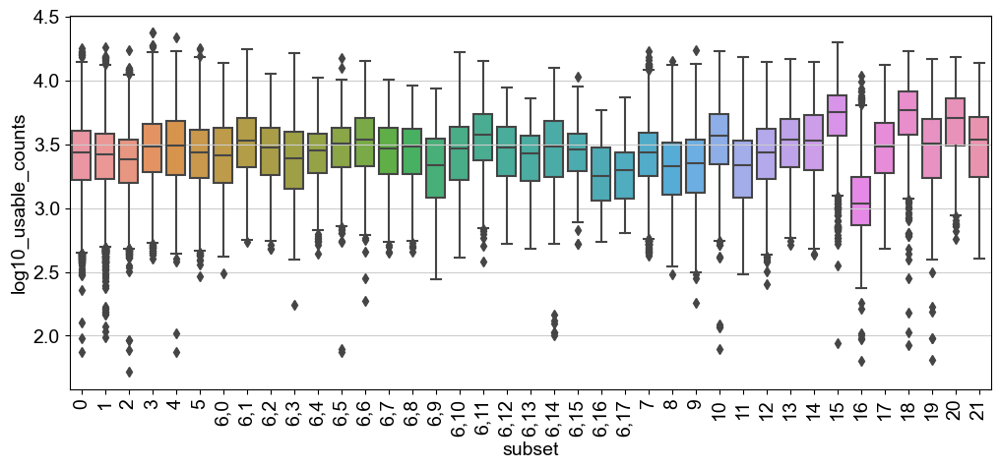

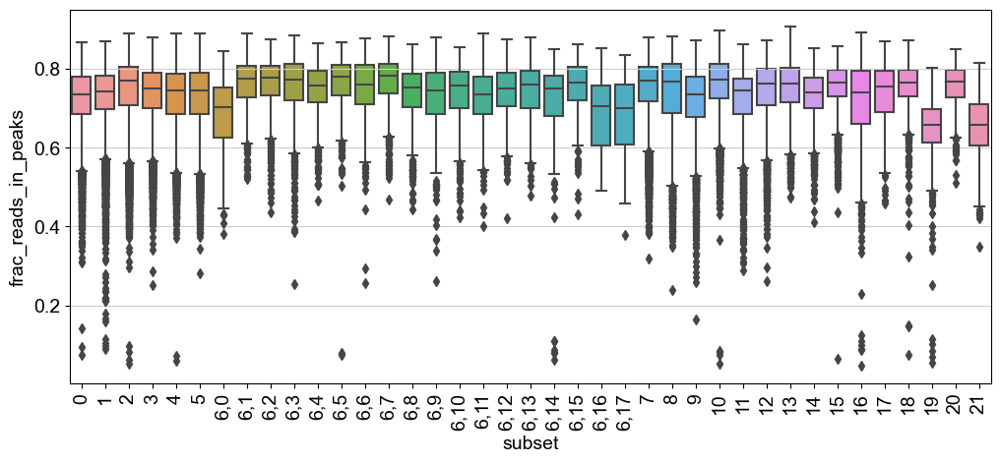

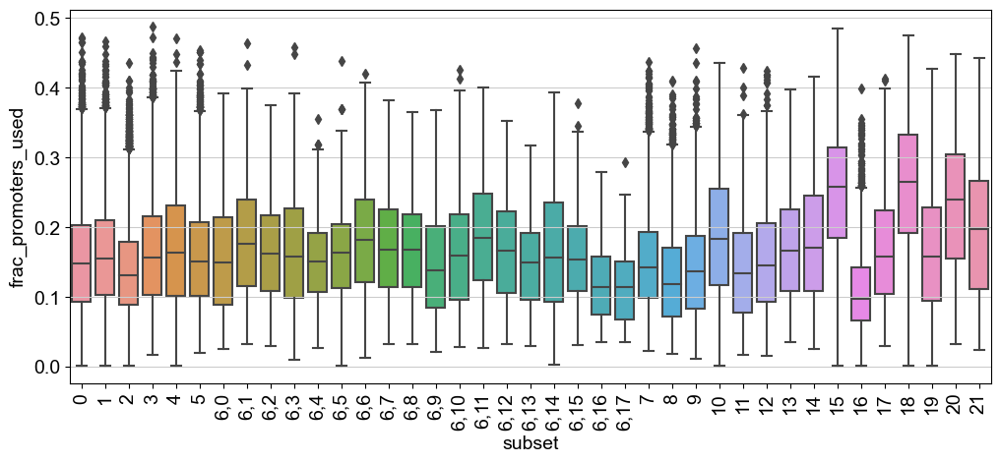

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 44 clusters and added
    'subset', the cluster labels (adata.obs, categorical) (0:00:02)


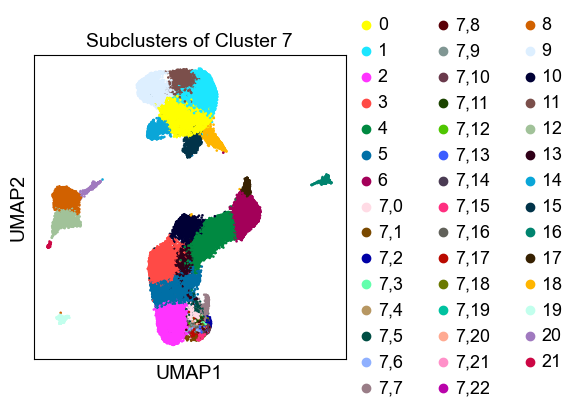

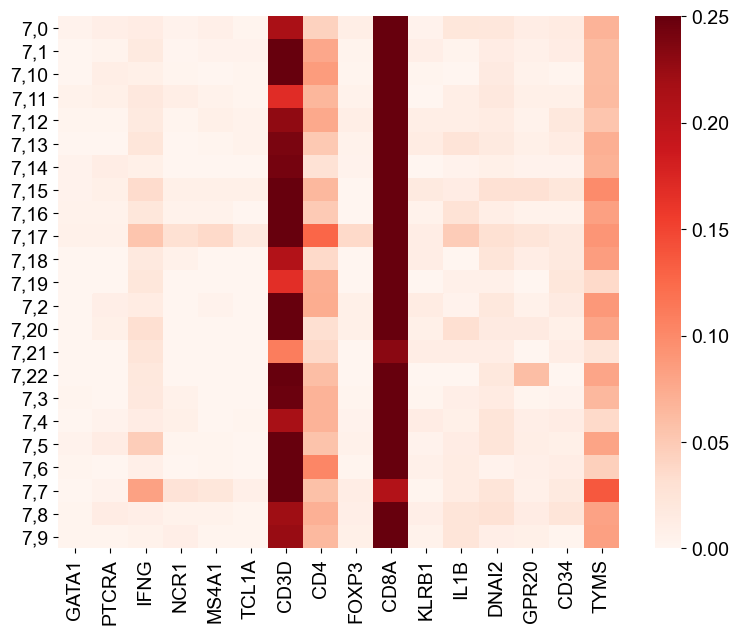

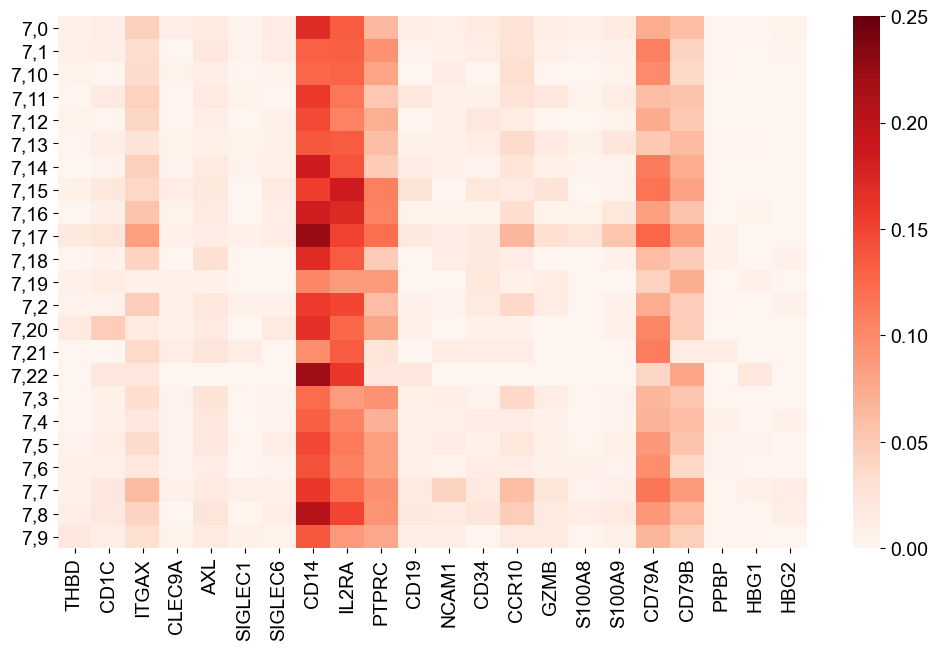

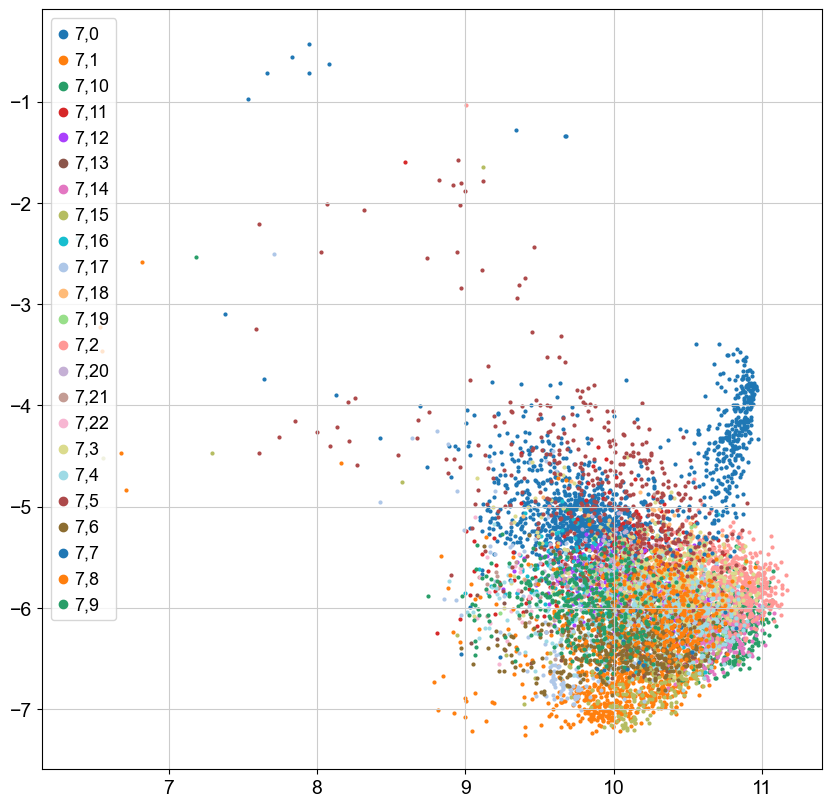

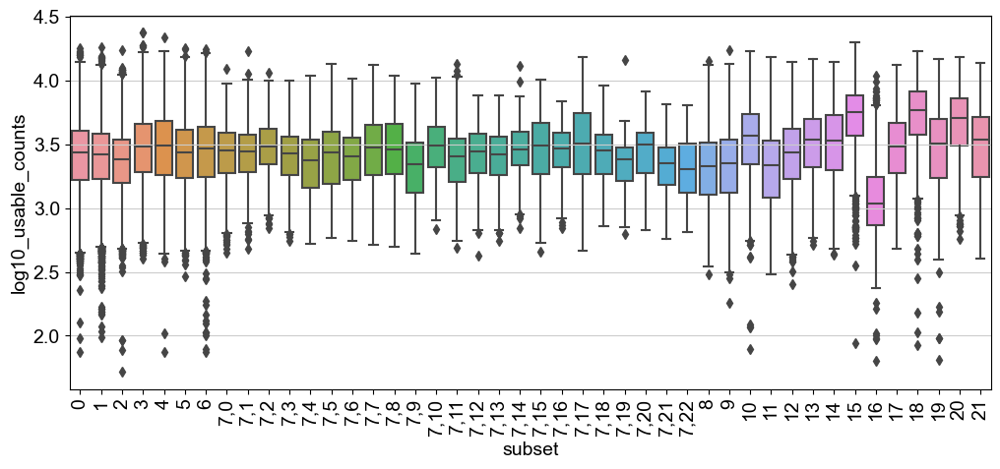

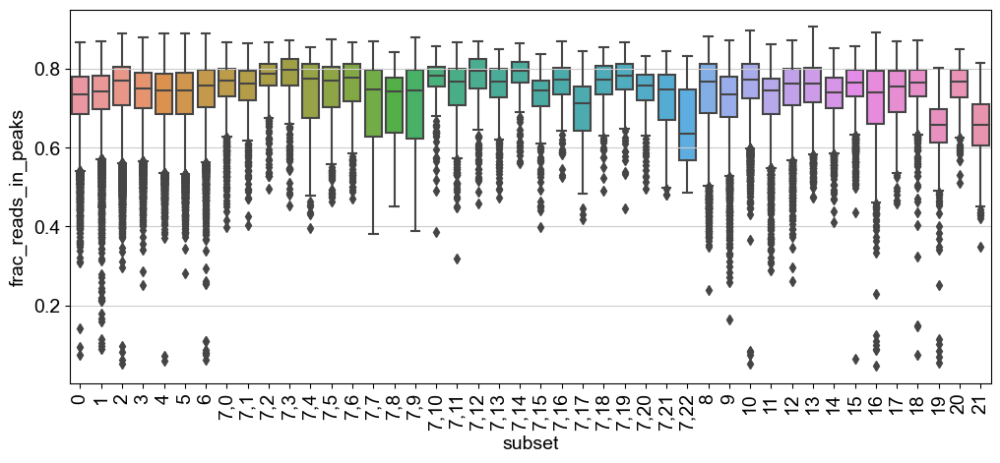

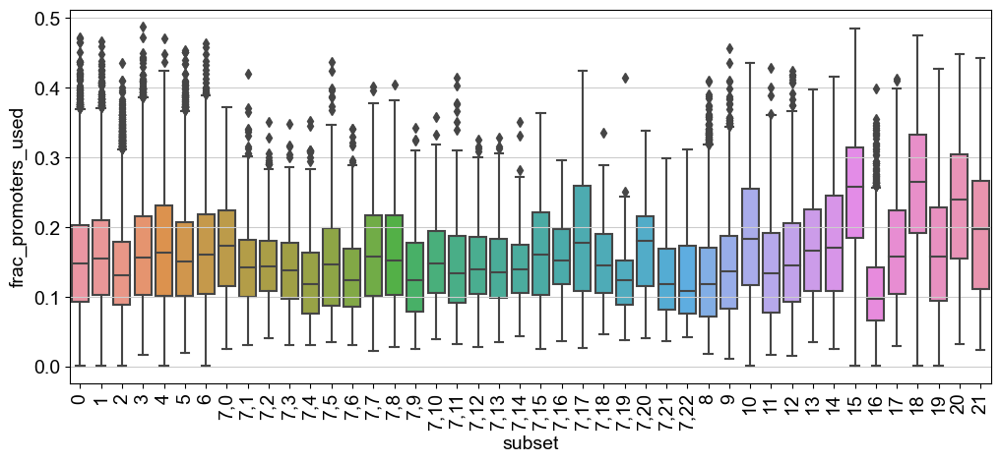

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 39 clusters and added
    'subset', the cluster labels (adata.obs, categorical) (0:00:01)


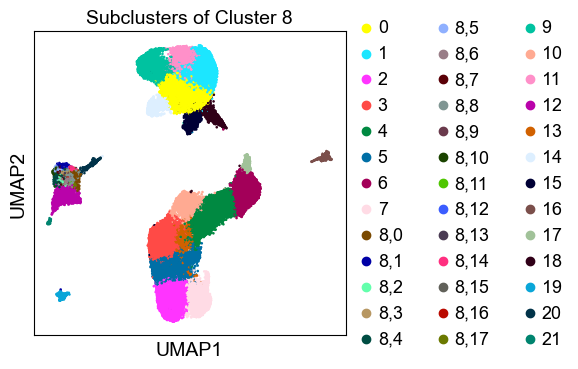

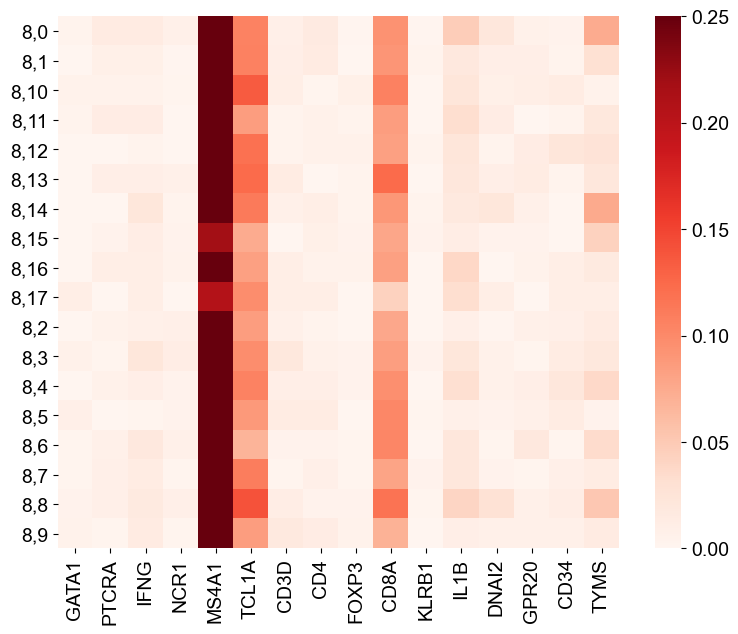

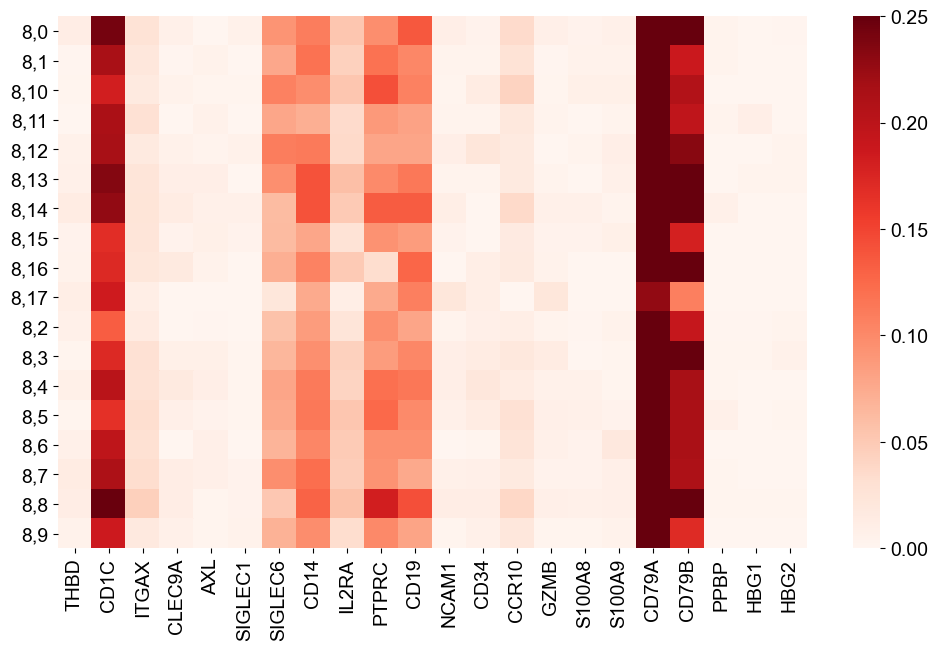

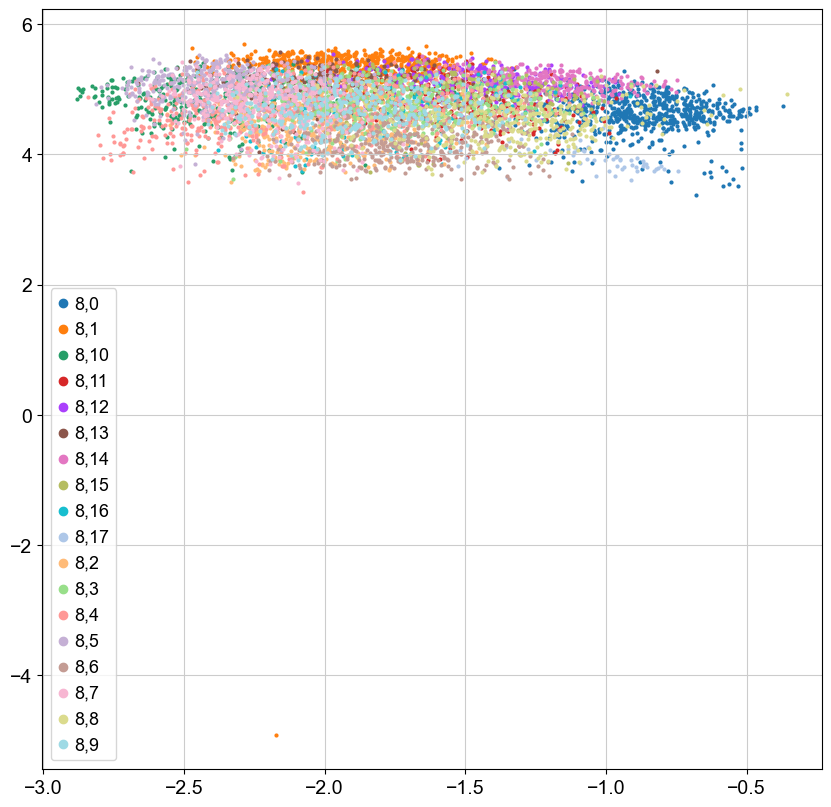

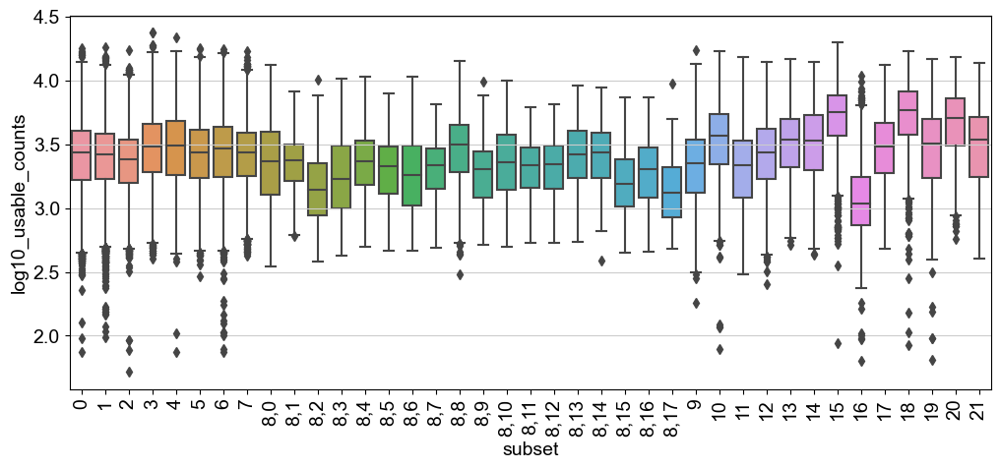

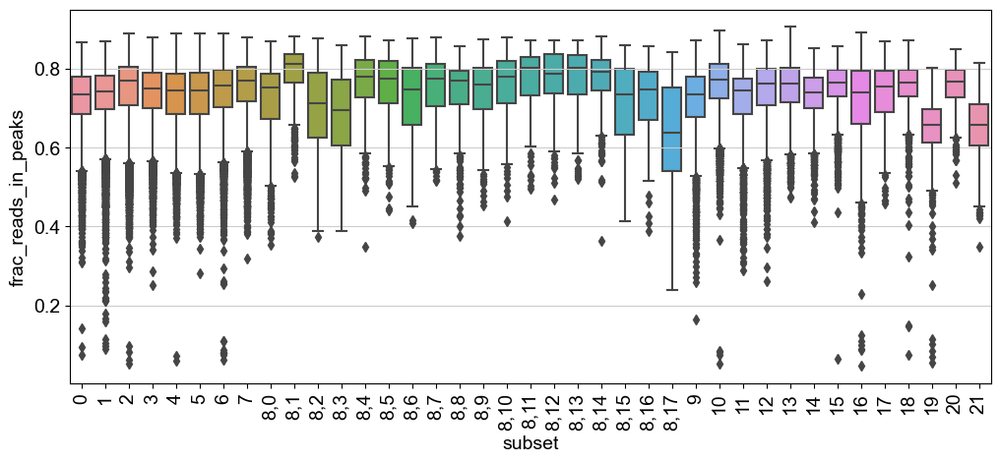

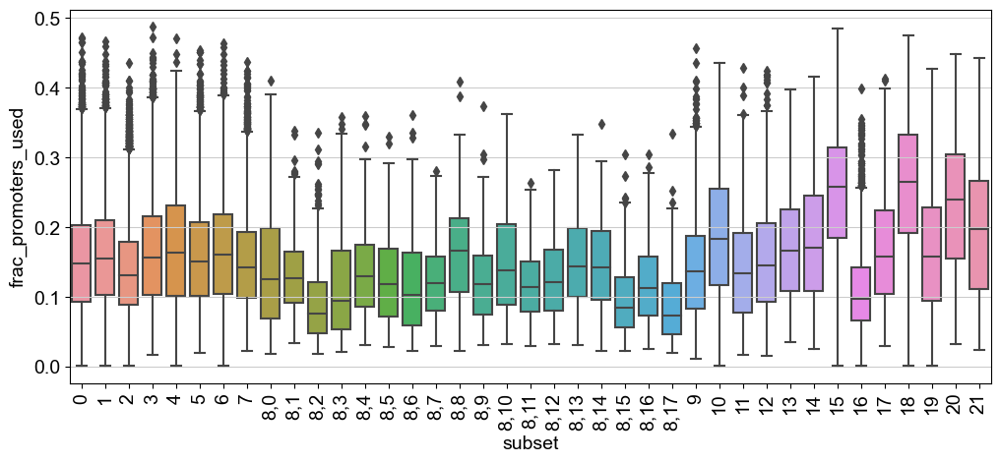

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 43 clusters and added
    'subset', the cluster labels (adata.obs, categorical) (0:00:01)


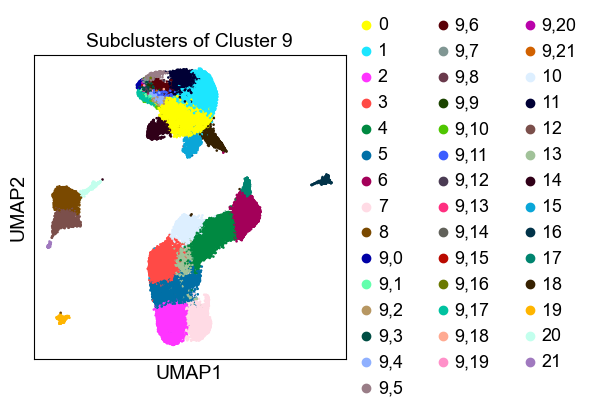

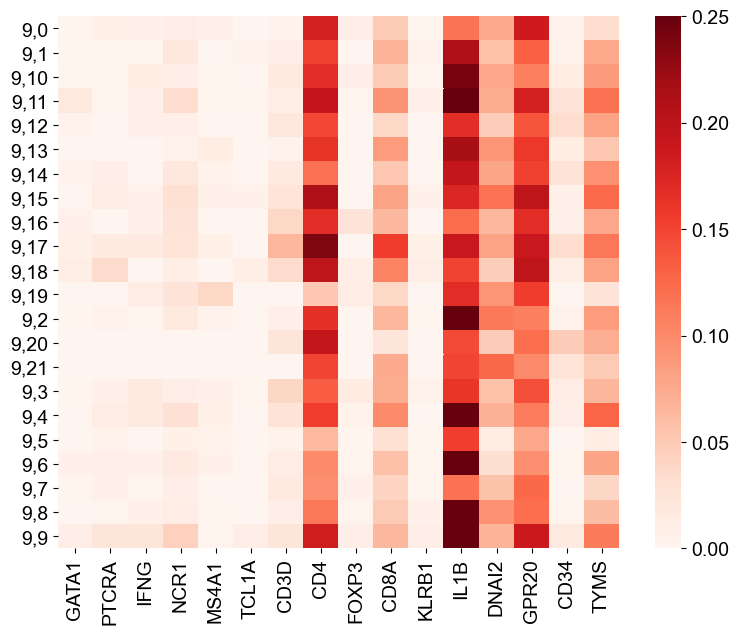

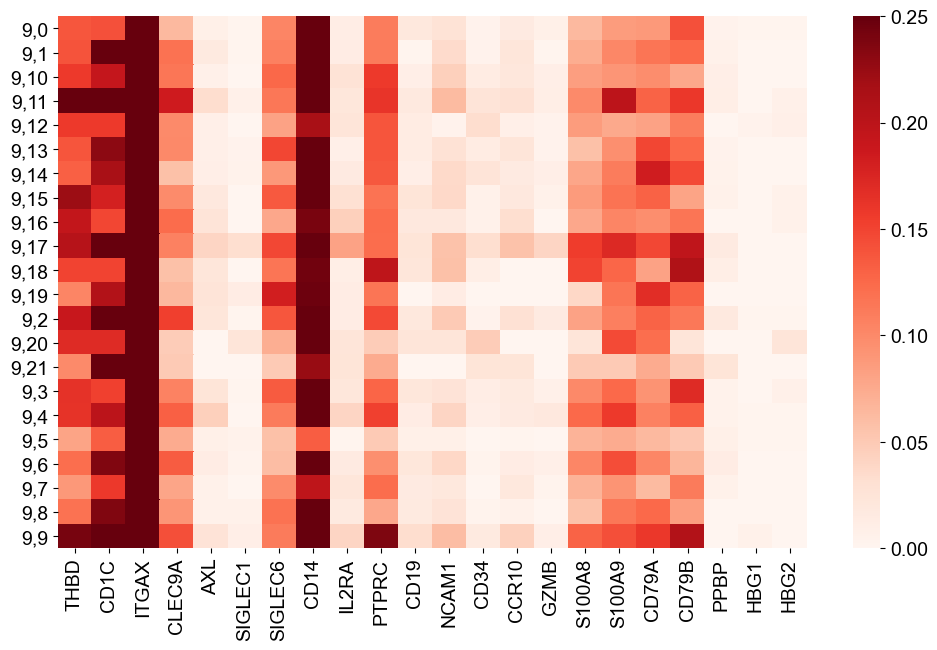

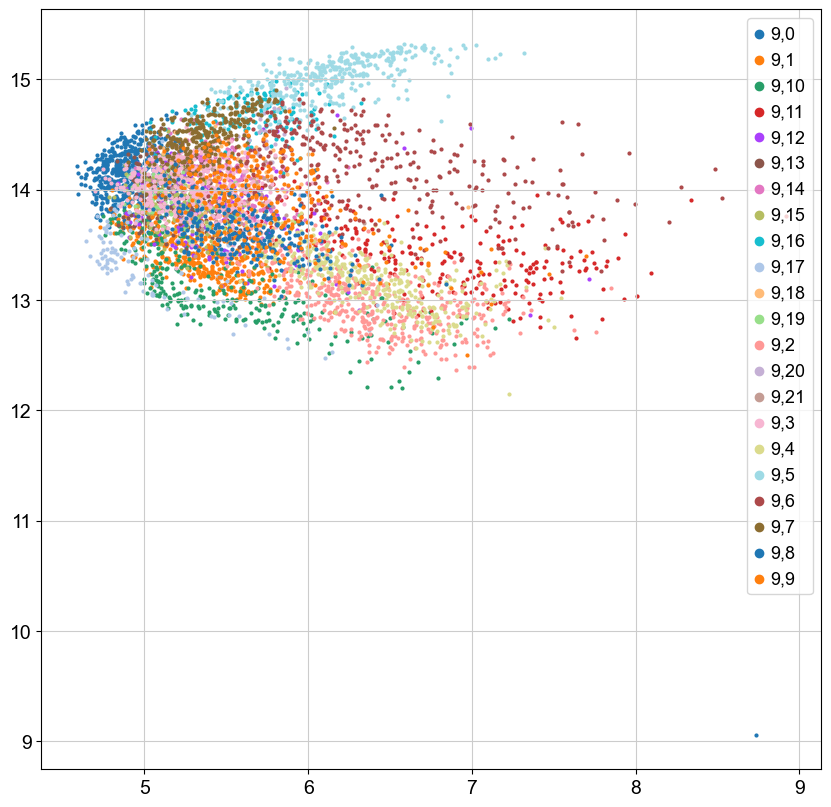

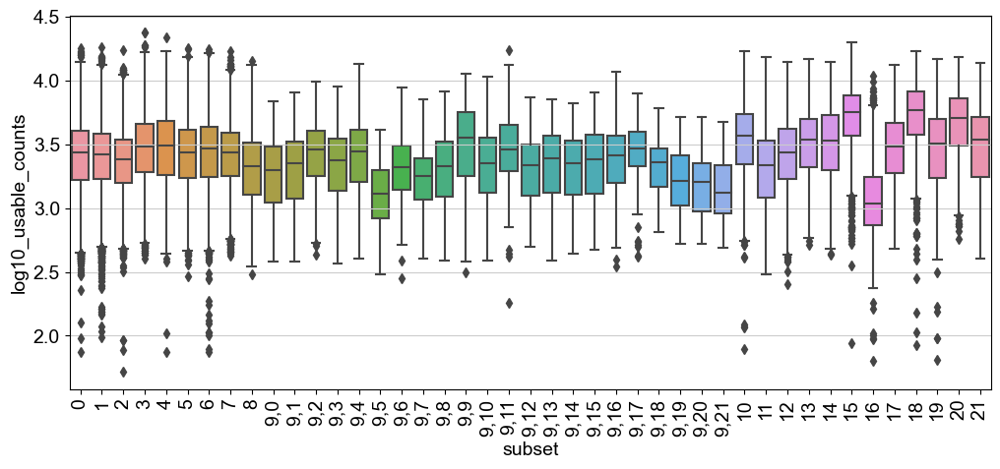

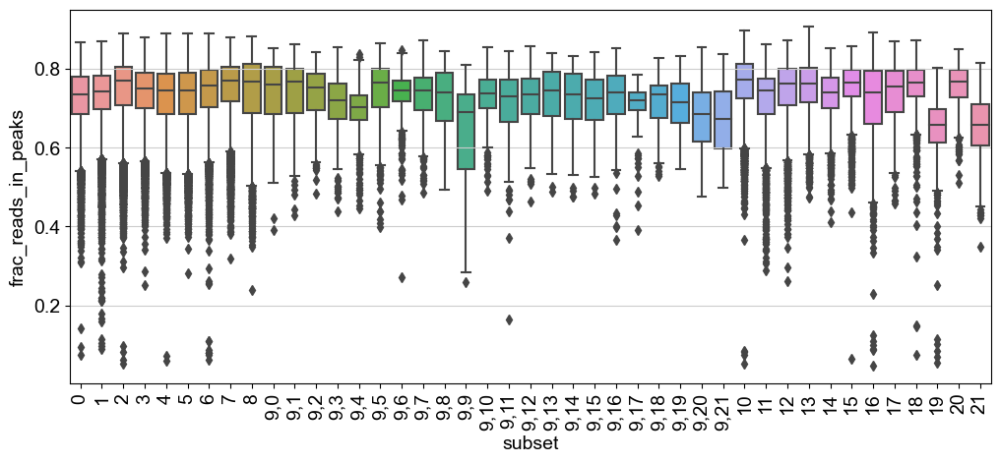

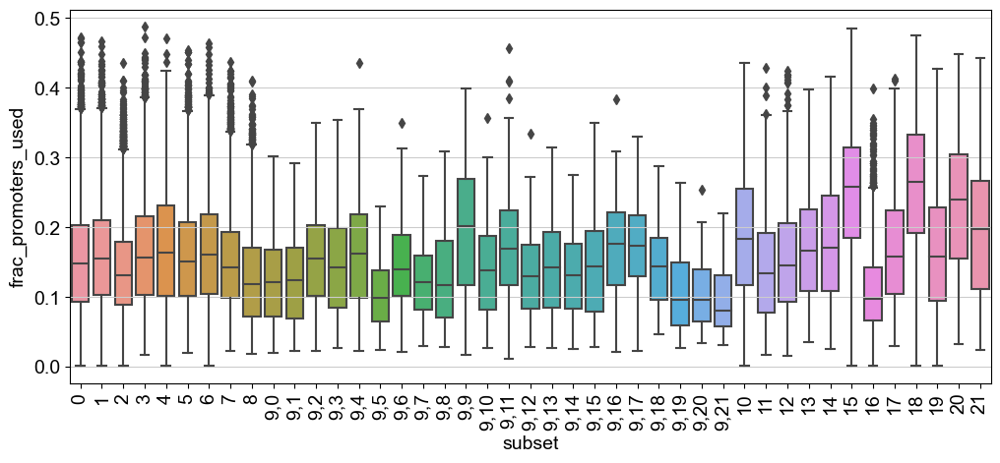

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 37 clusters and added
    'subset', the cluster labels (adata.obs, categorical) (0:00:00)


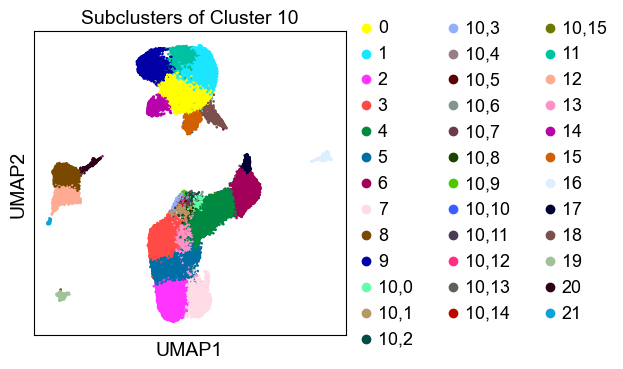

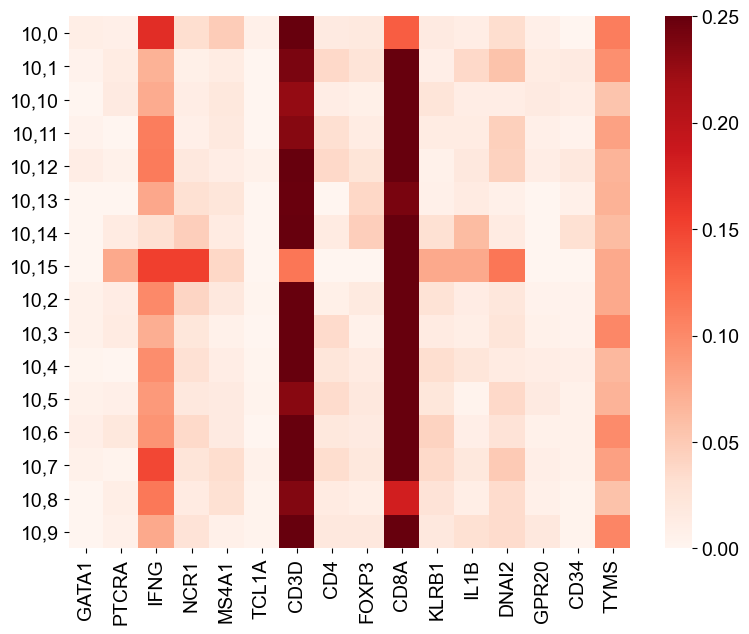

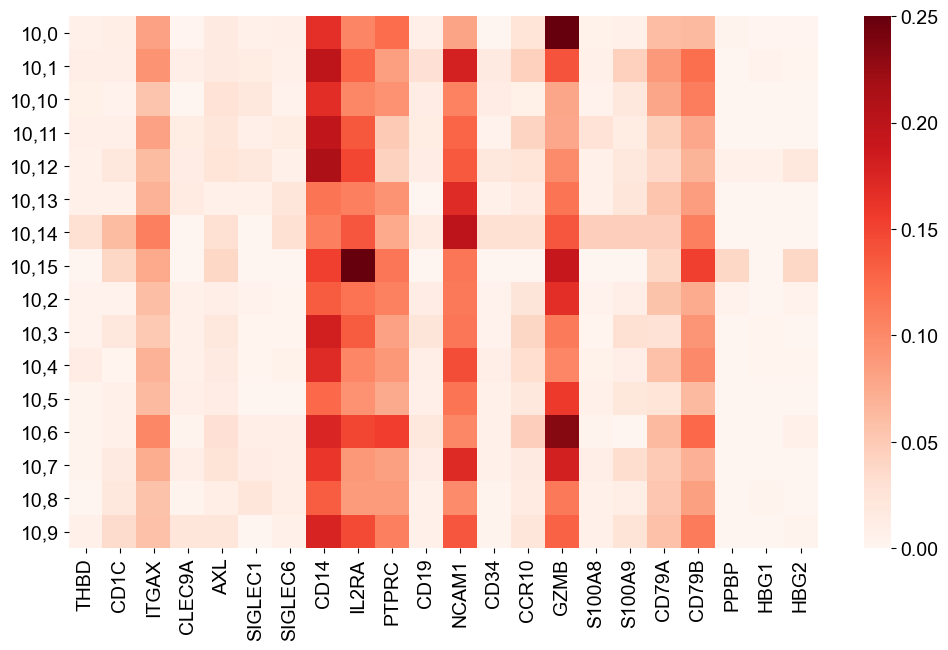

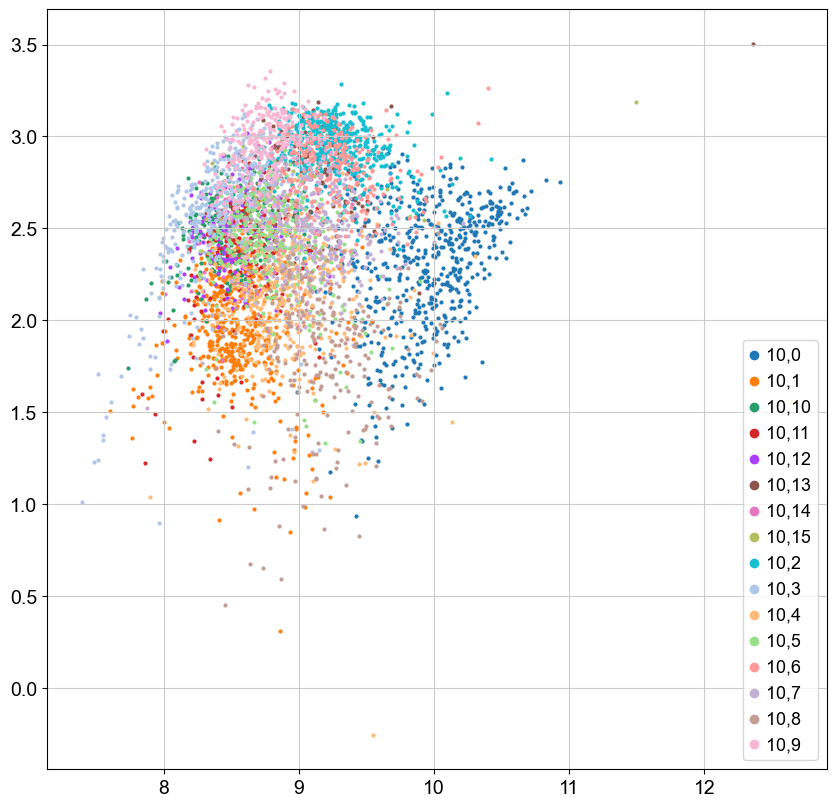

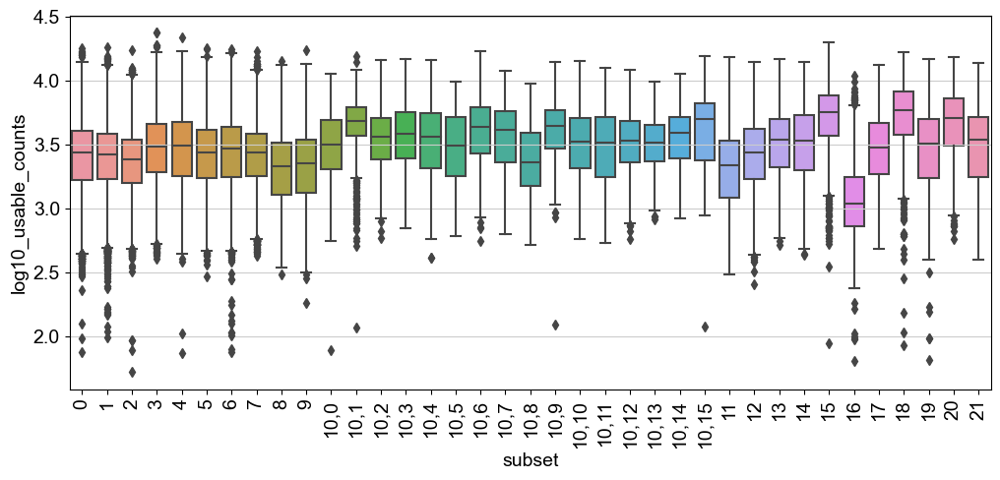

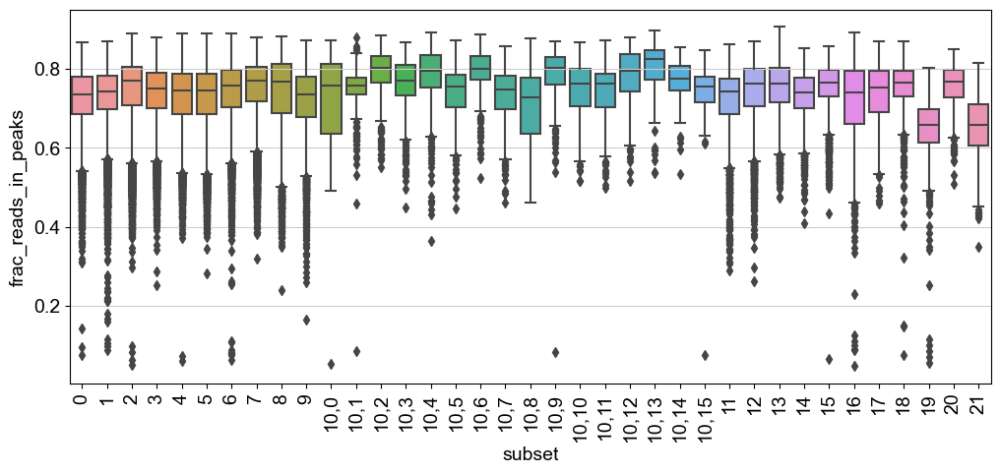

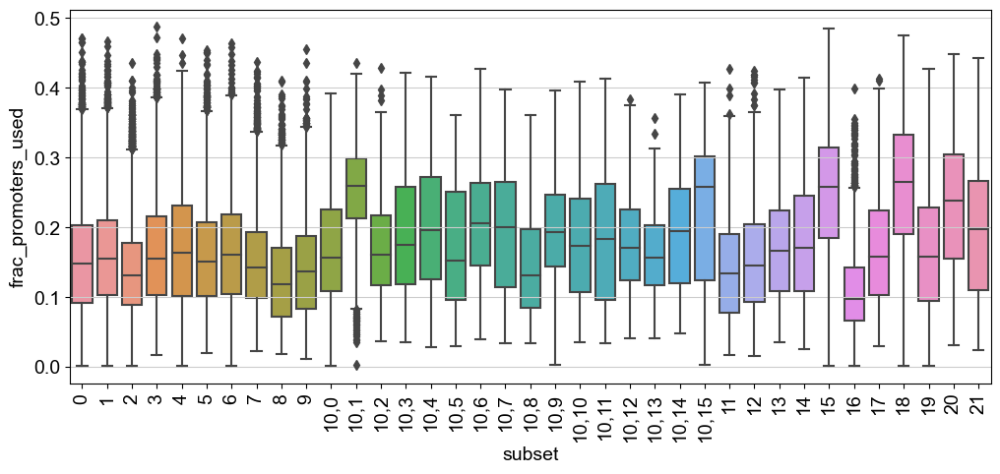

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 39 clusters and added
    'subset', the cluster labels (adata.obs, categorical) (0:00:00)


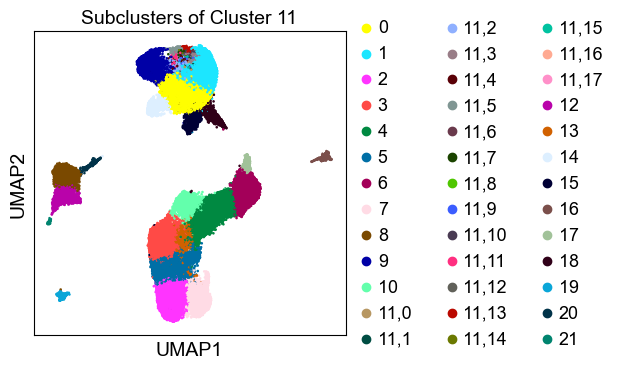

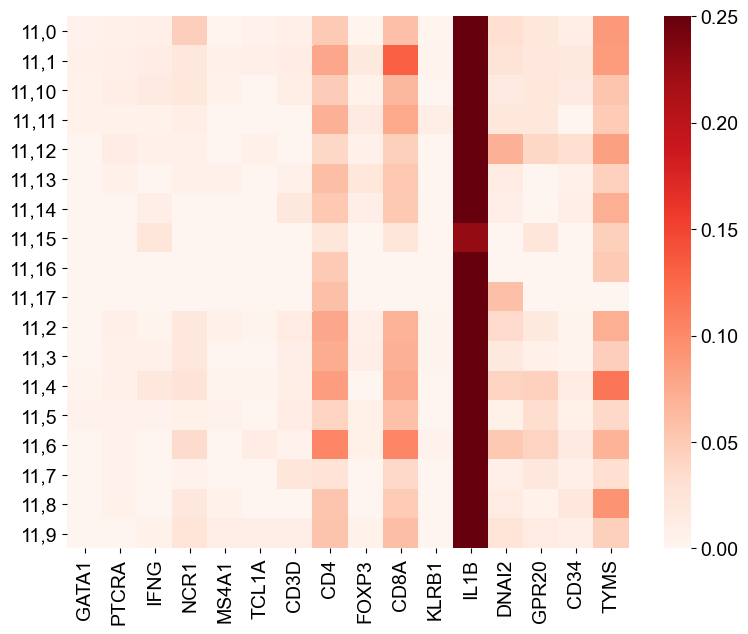

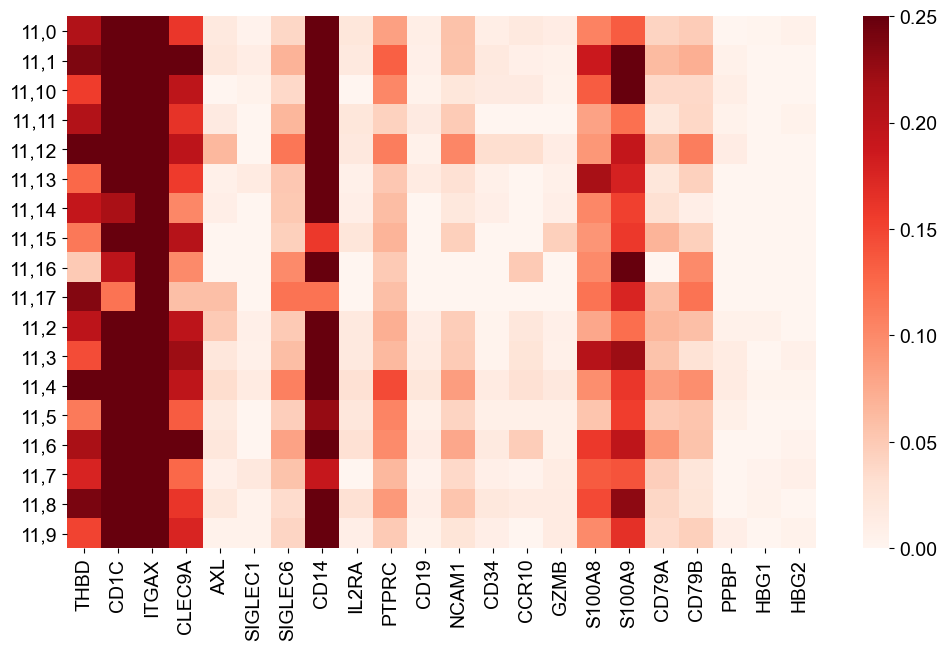

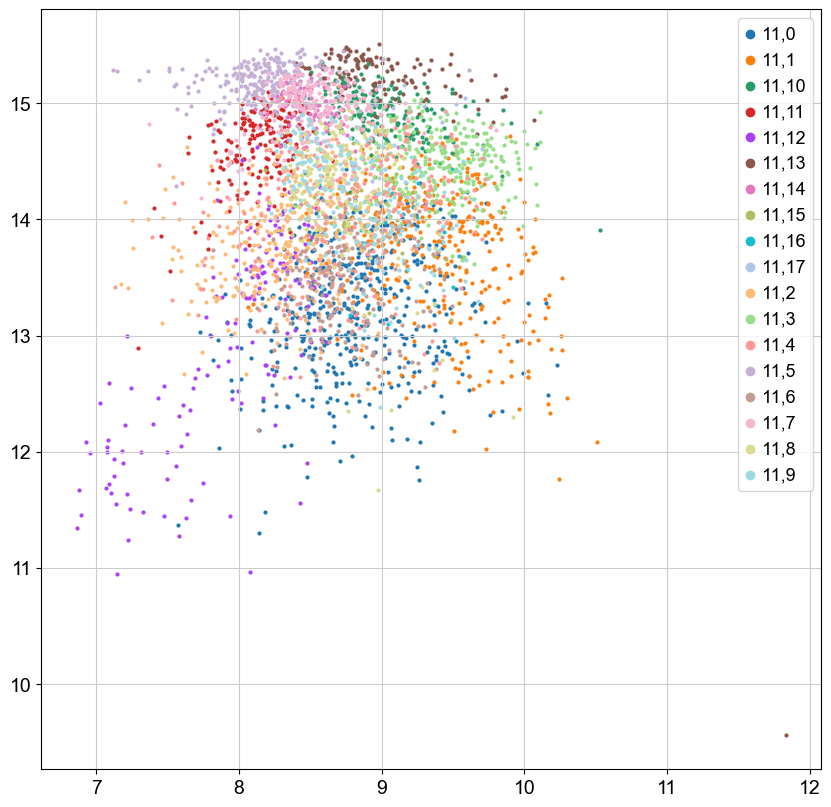

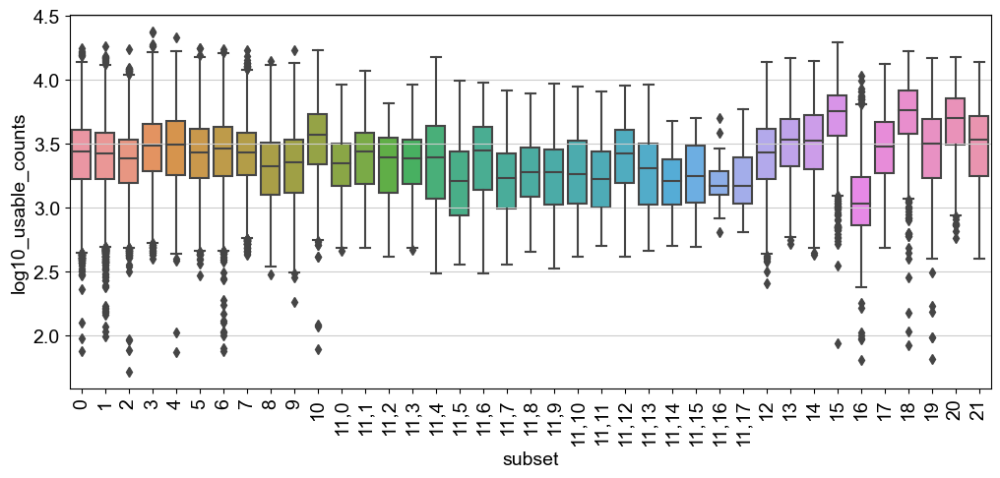

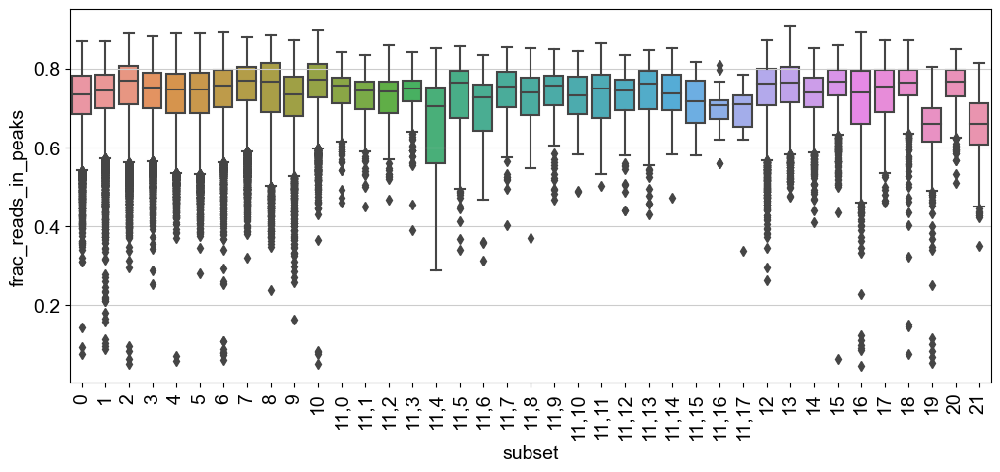

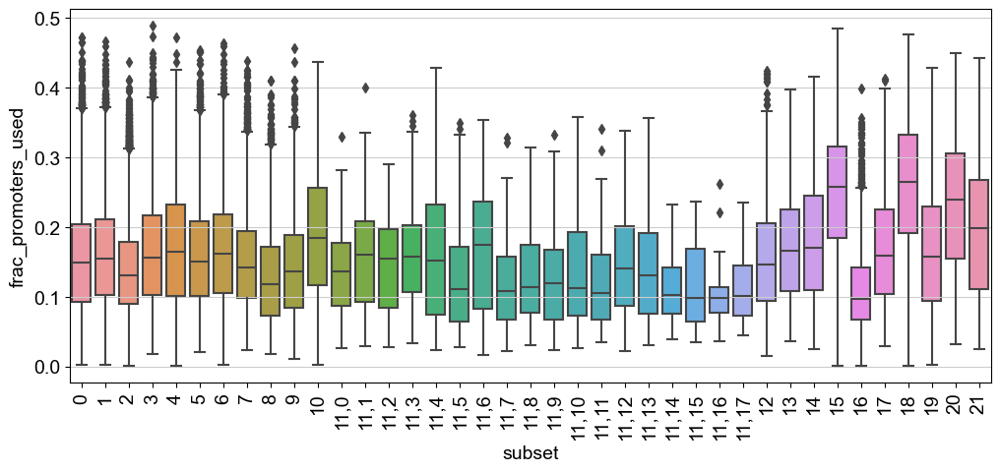

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 33 clusters and added
    'subset', the cluster labels (adata.obs, categorical) (0:00:00)


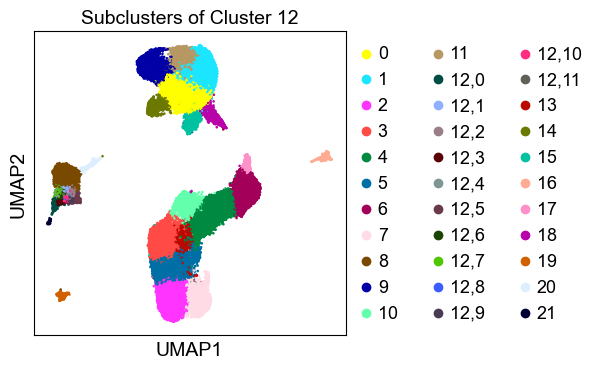

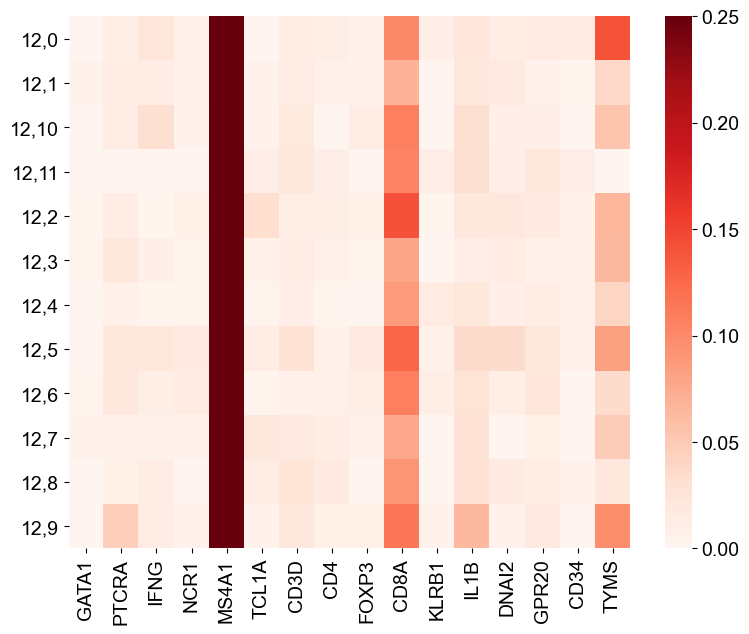

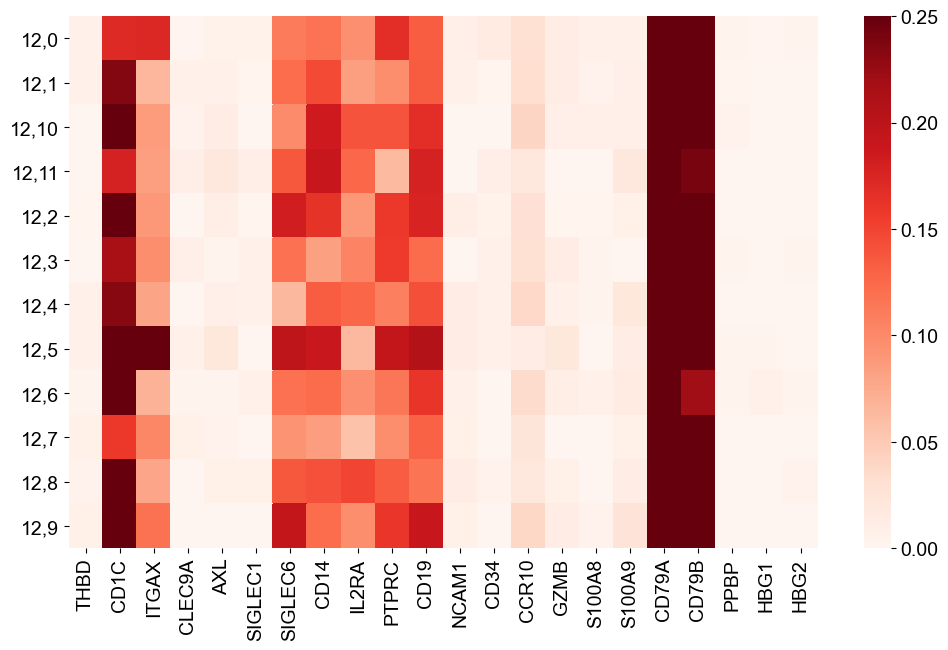

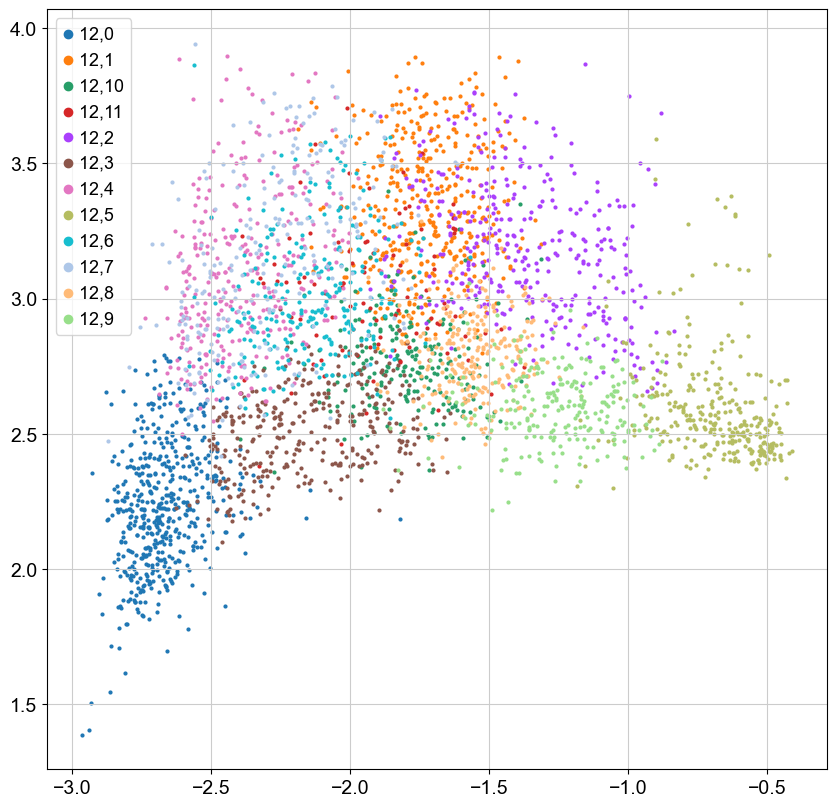

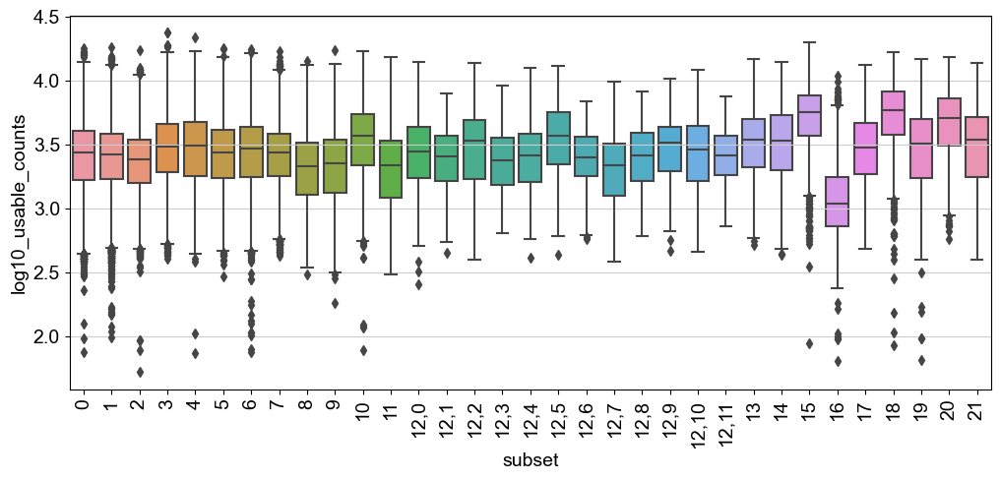

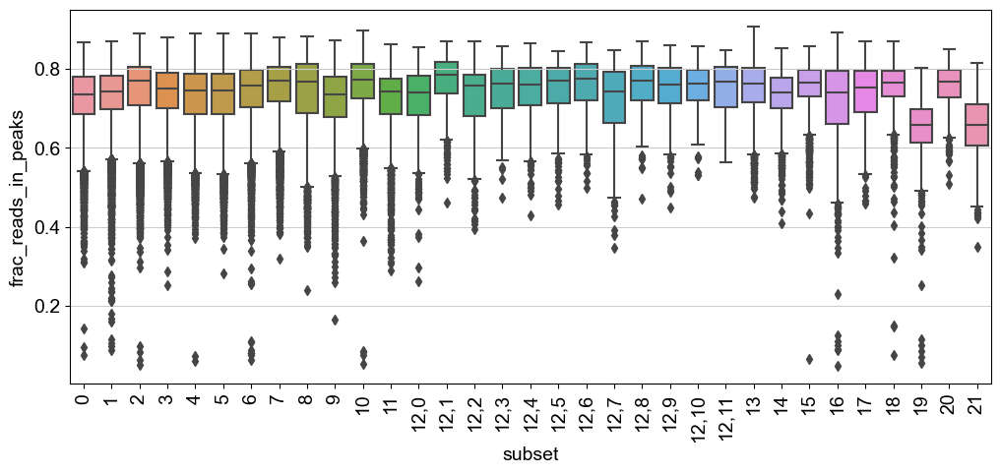

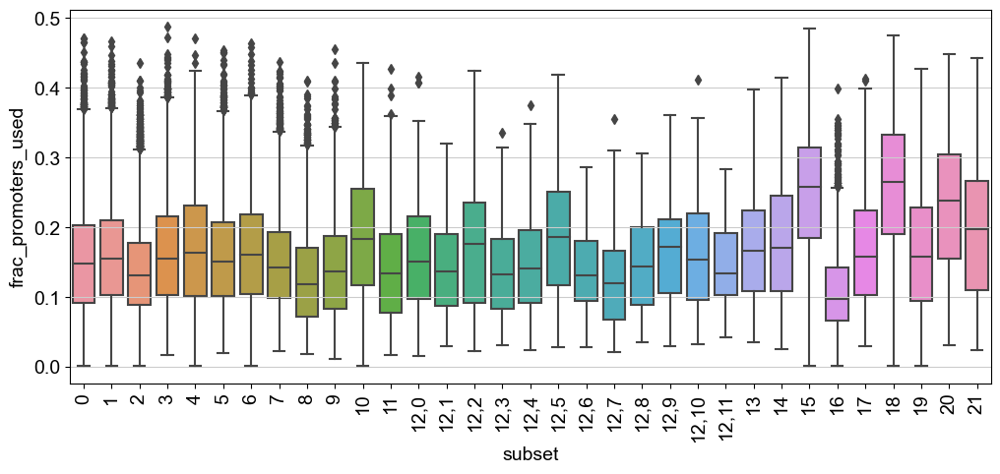

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 39 clusters and added
    'subset', the cluster labels (adata.obs, categorical) (0:00:00)


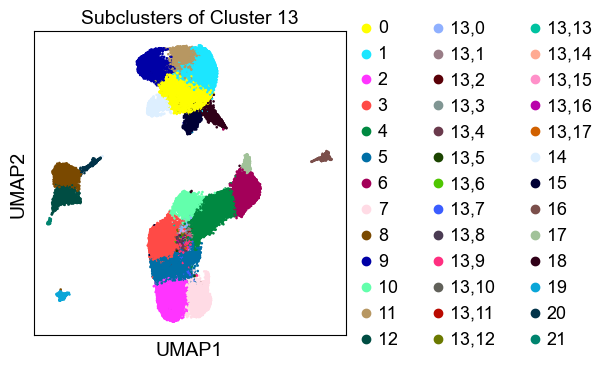

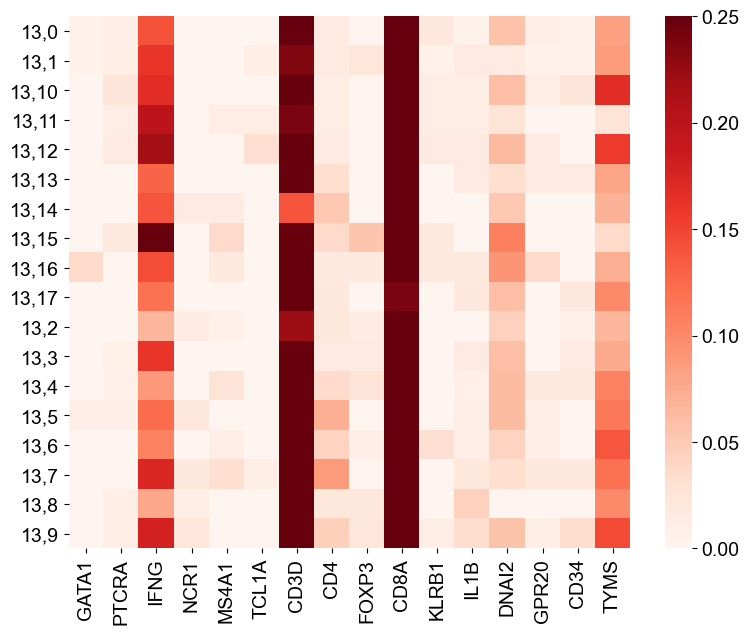

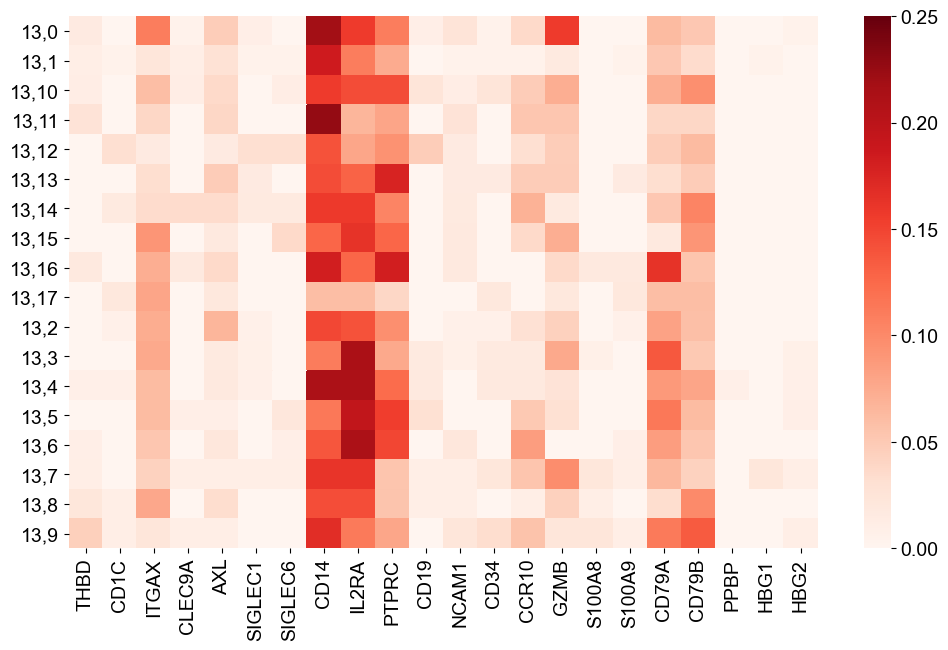

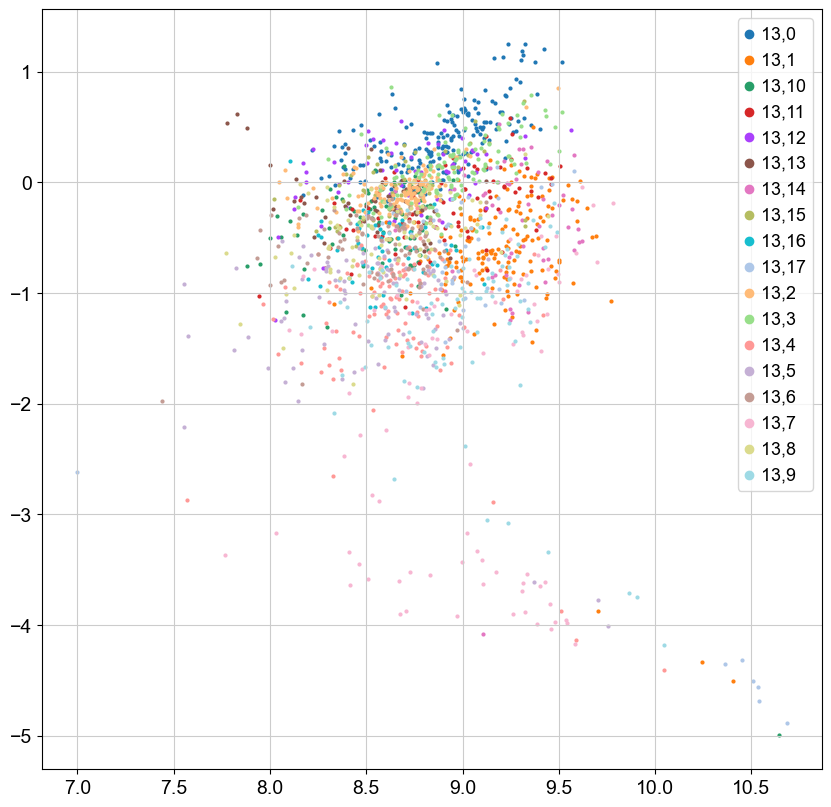

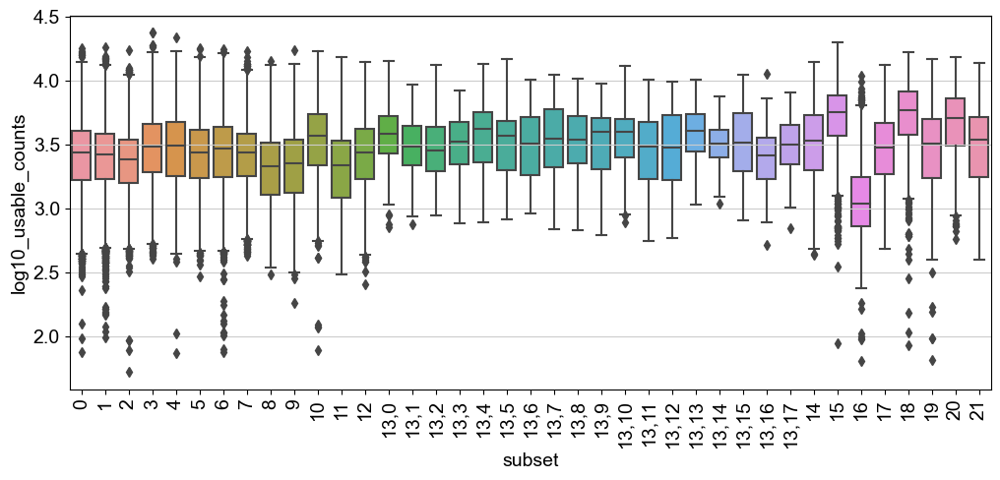

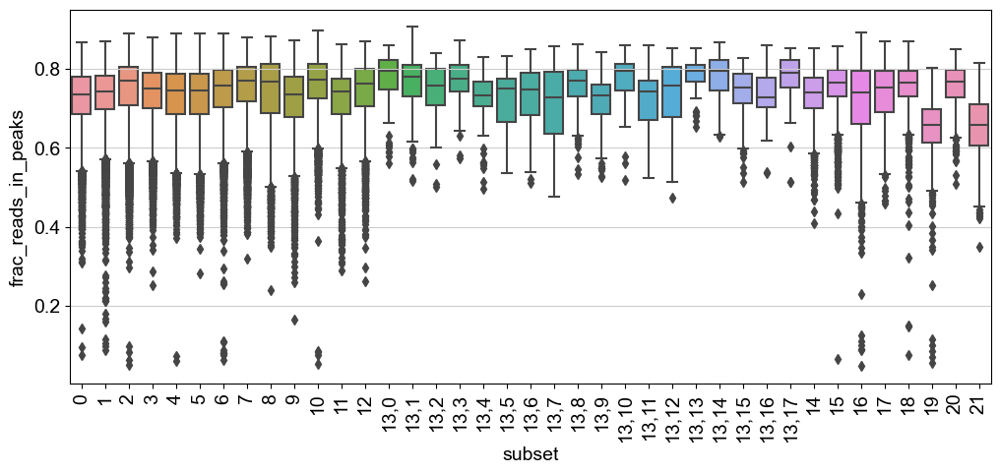

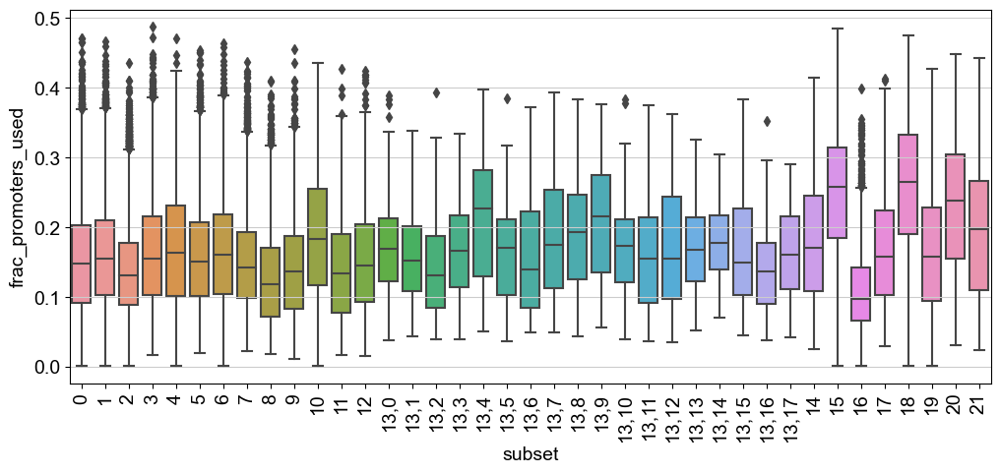

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 34 clusters and added
    'subset', the cluster labels (adata.obs, categorical) (0:00:00)


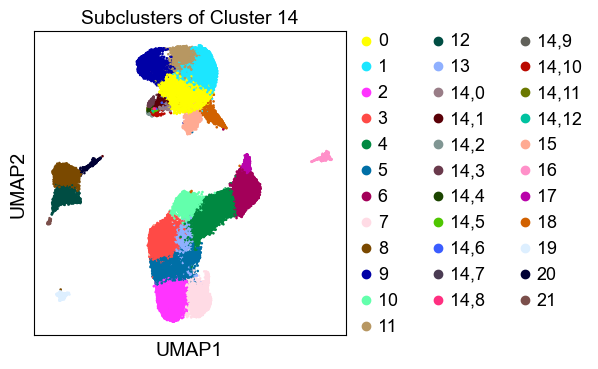

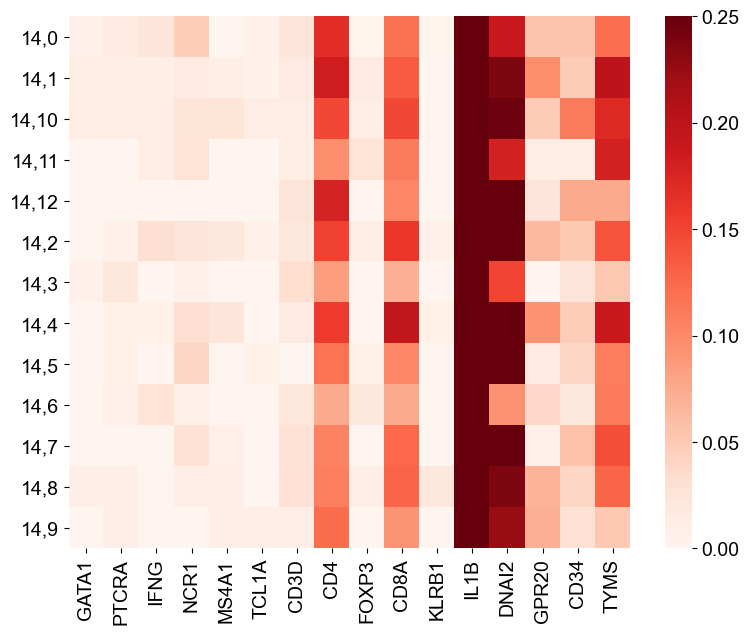

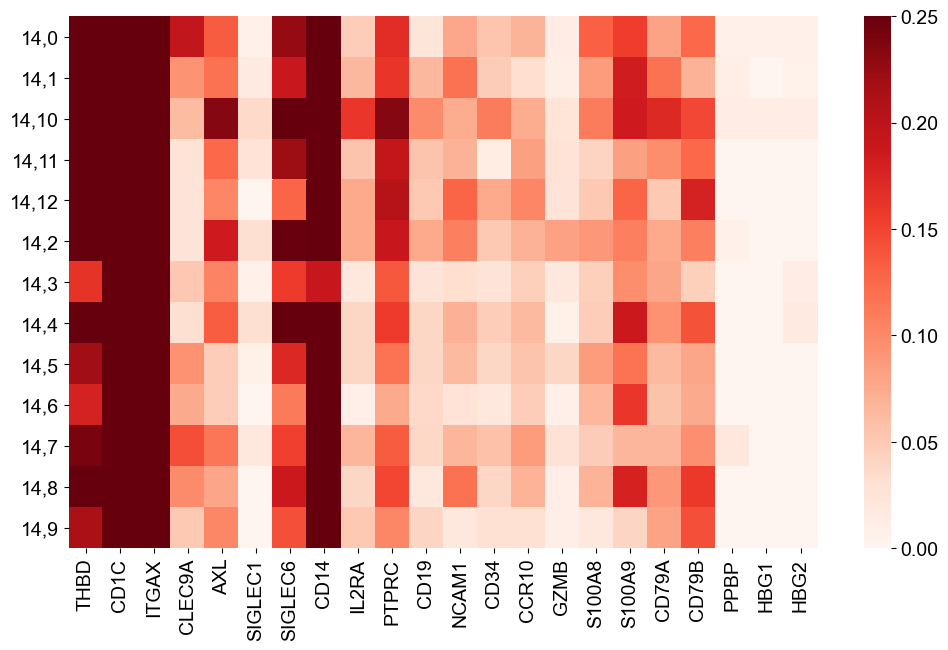

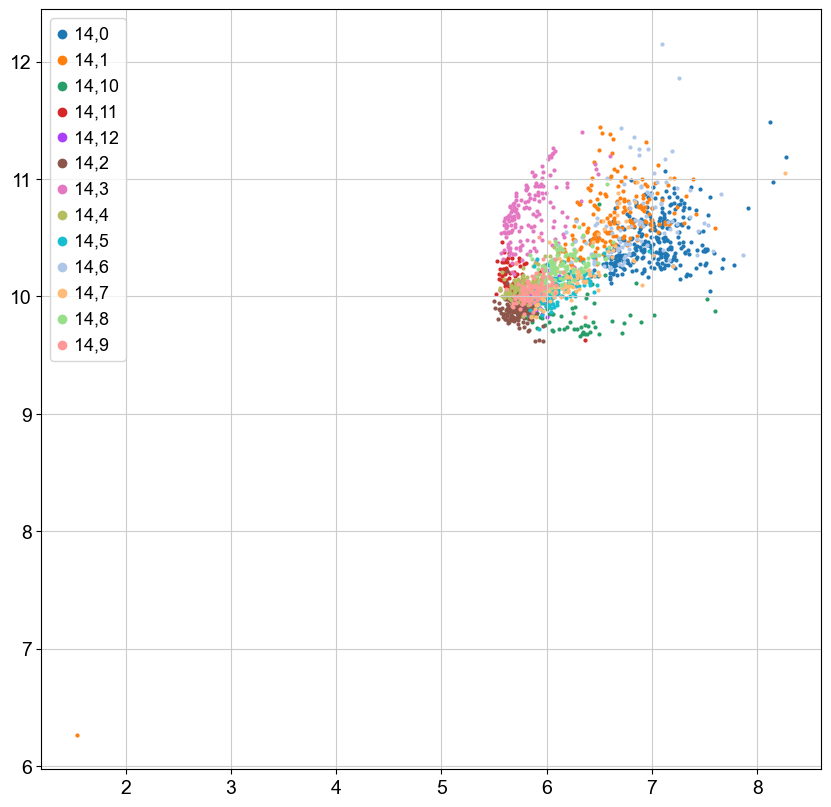

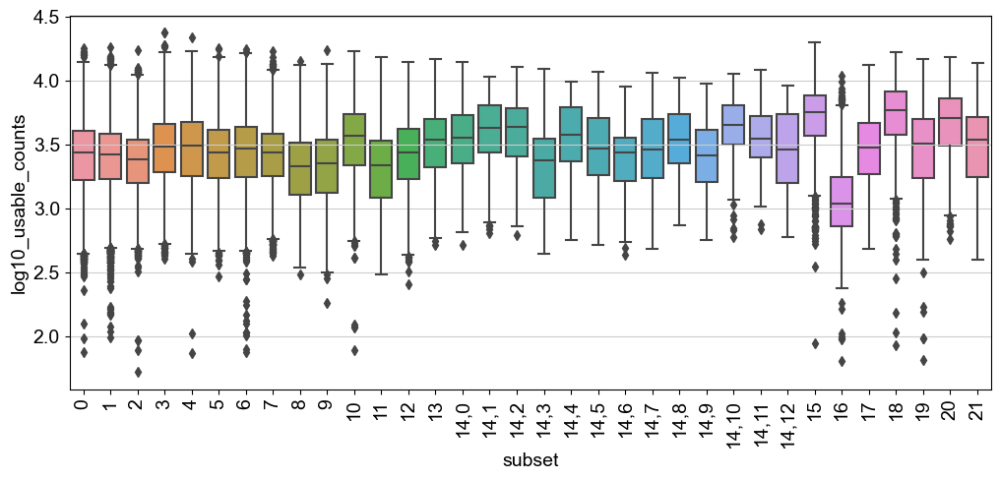

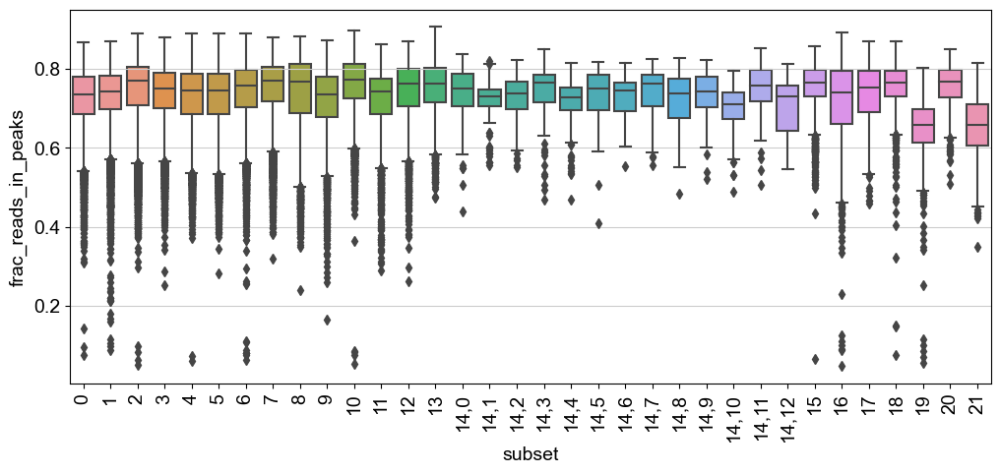

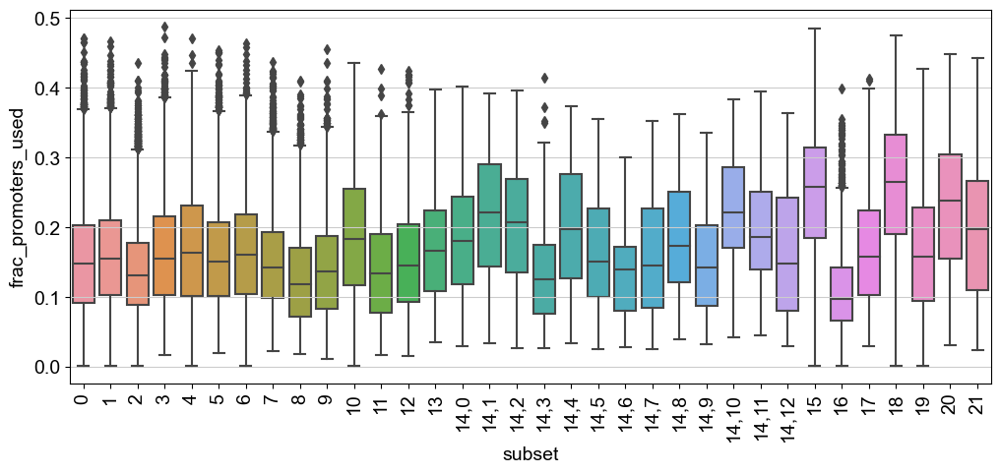

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 33 clusters and added
    'subset', the cluster labels (adata.obs, categorical) (0:00:00)


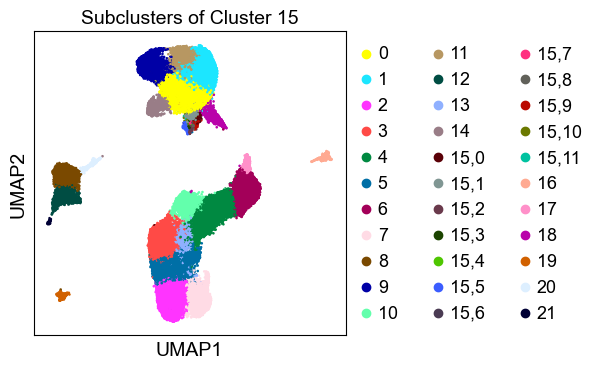

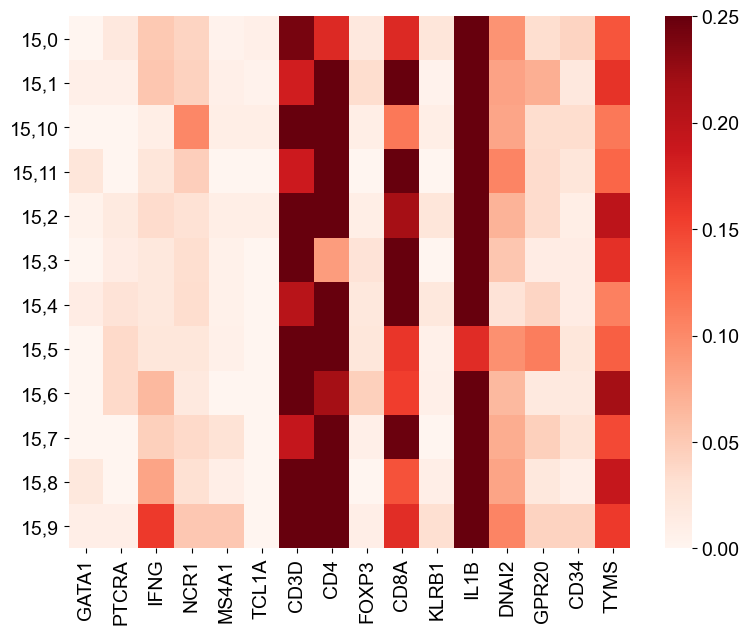

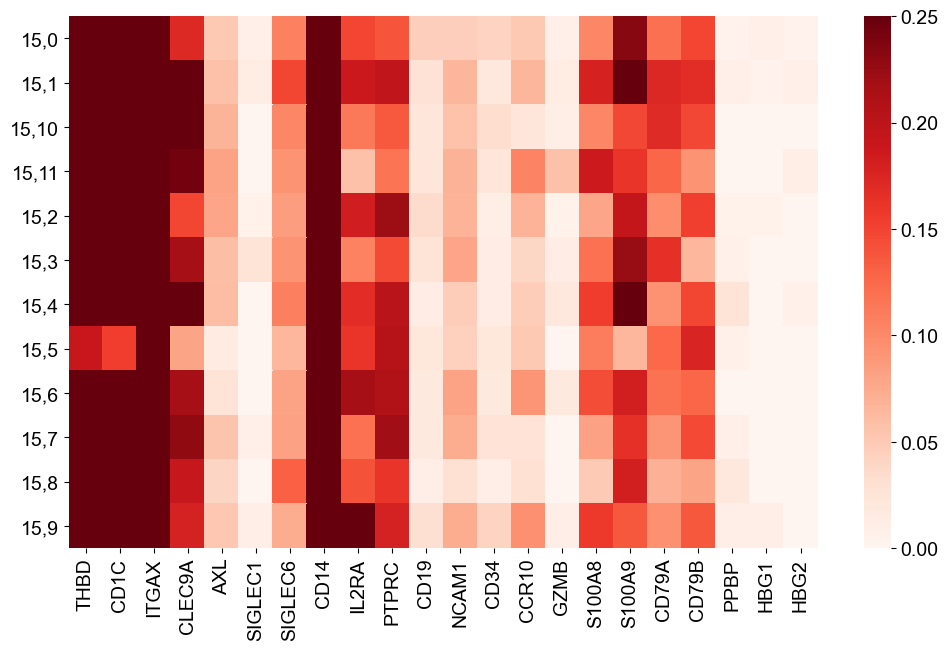

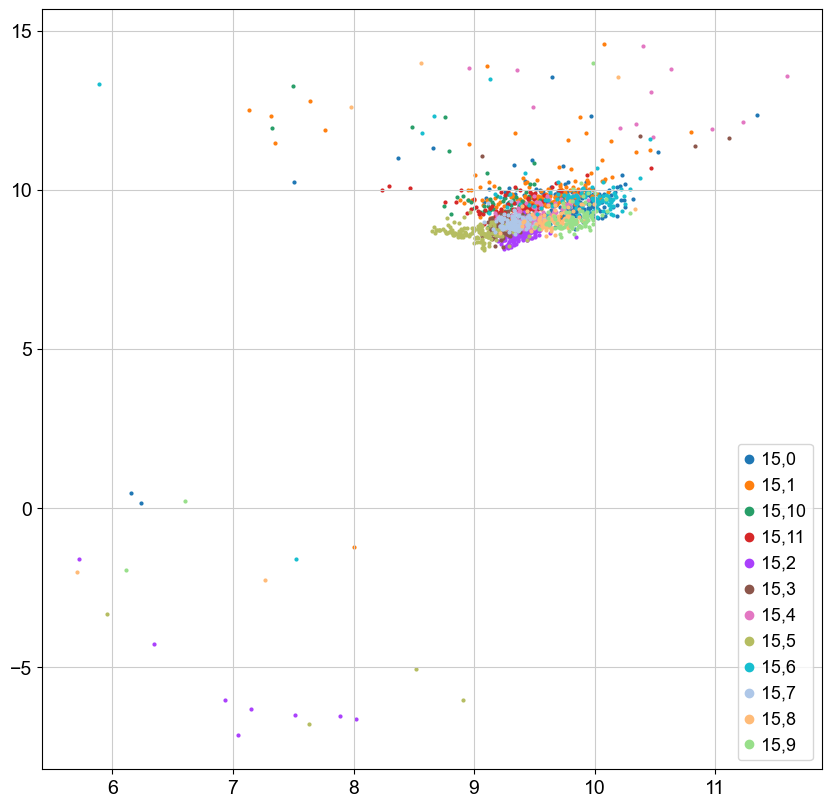

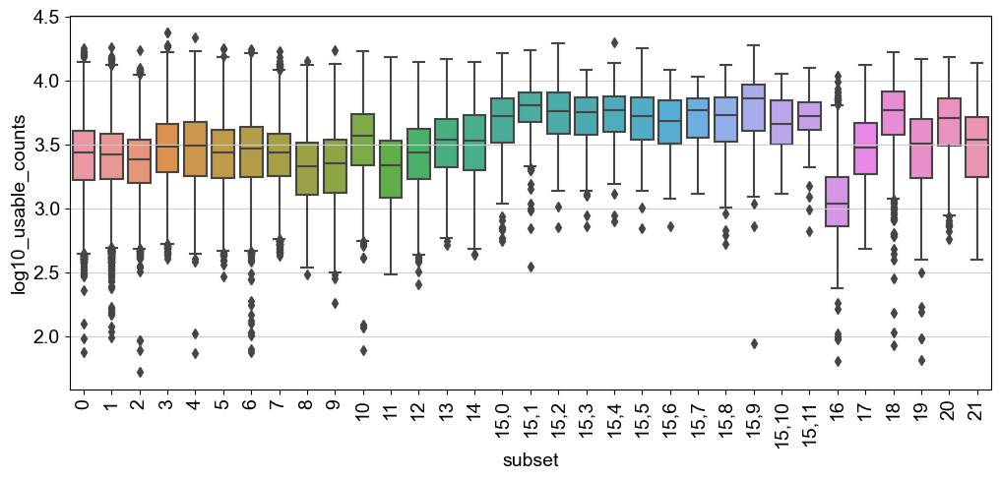

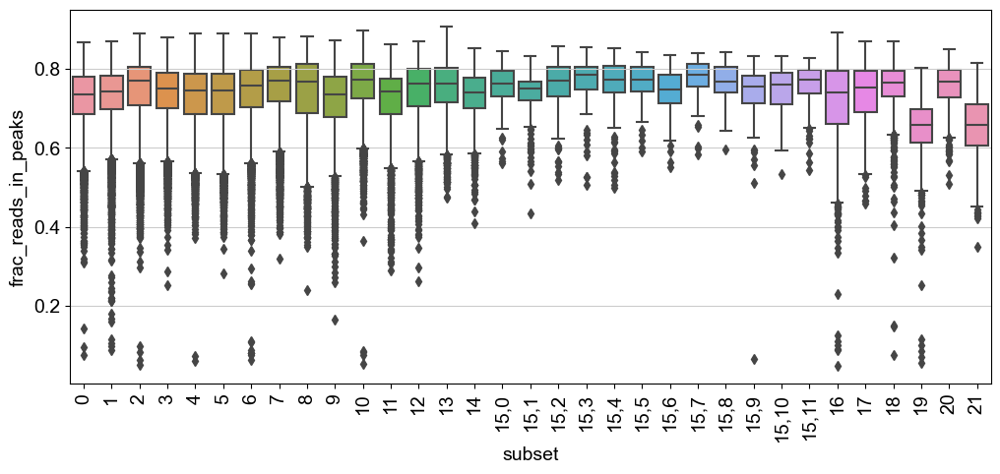

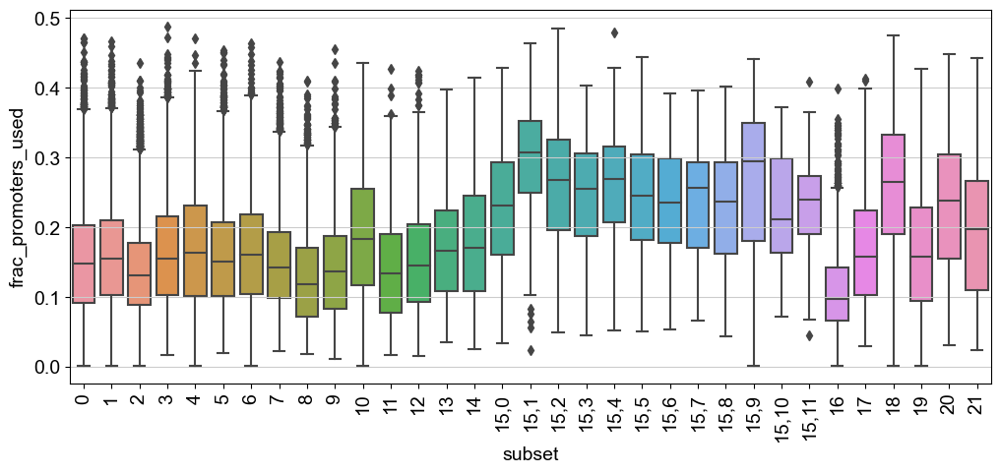

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 41 clusters and added
    'subset', the cluster labels (adata.obs, categorical) (0:00:00)


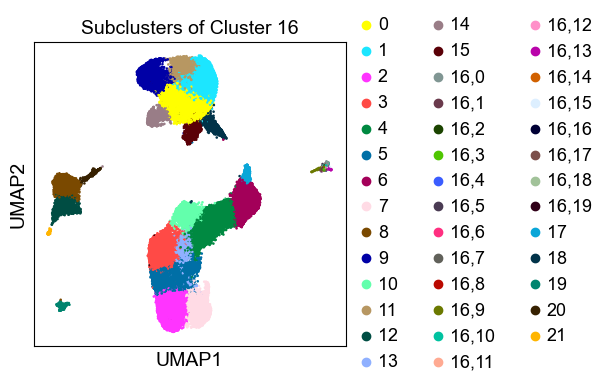

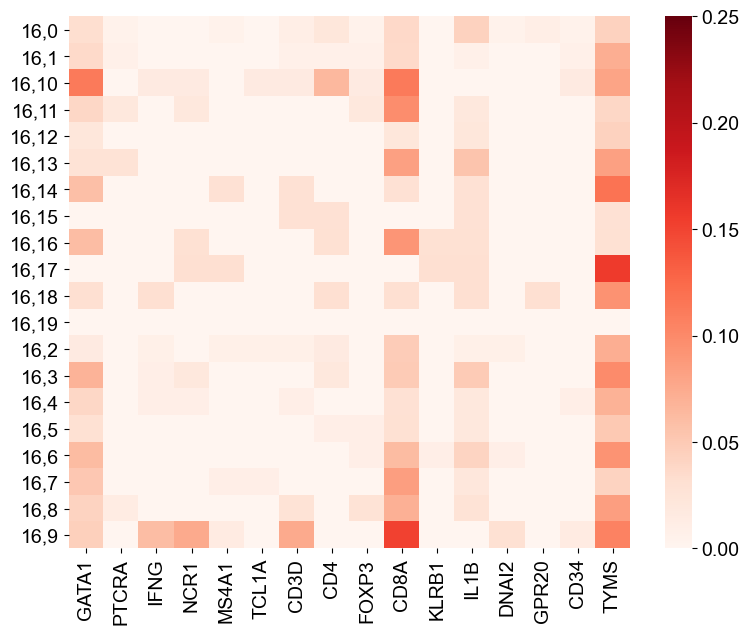

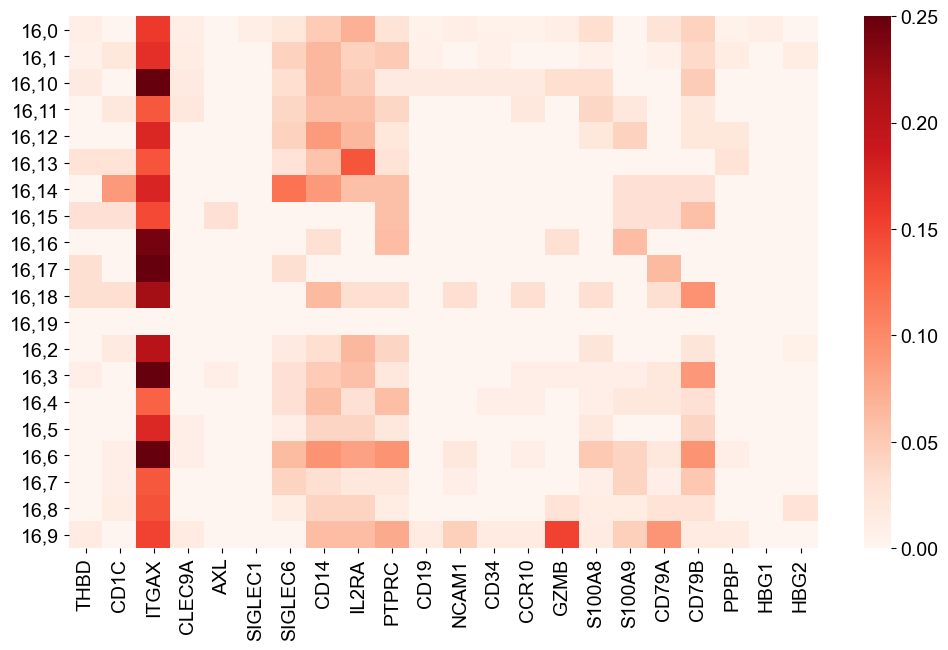

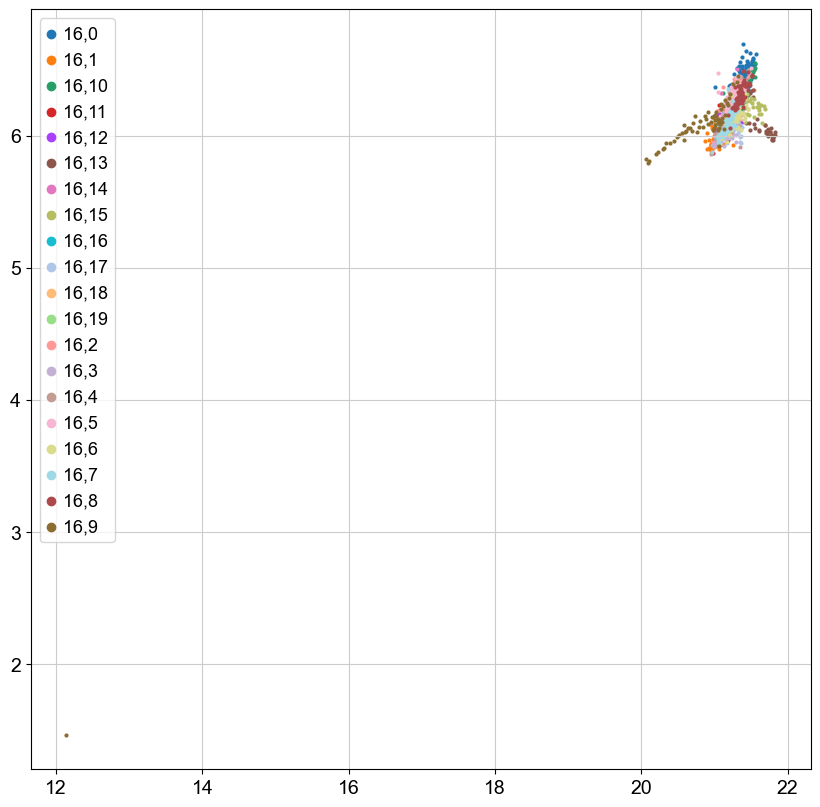

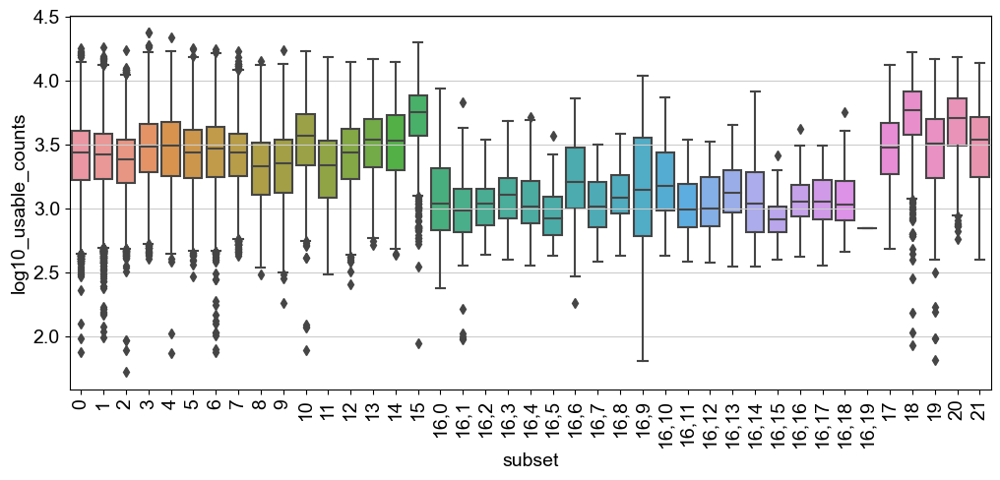

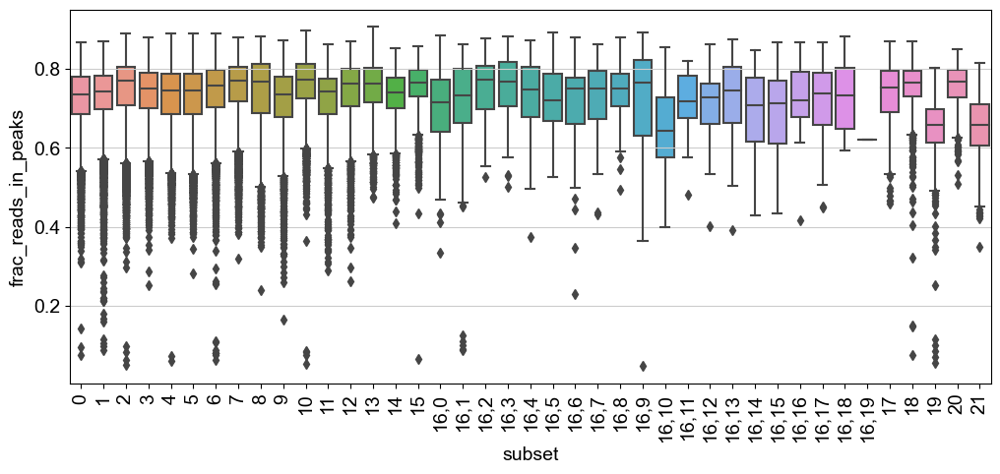

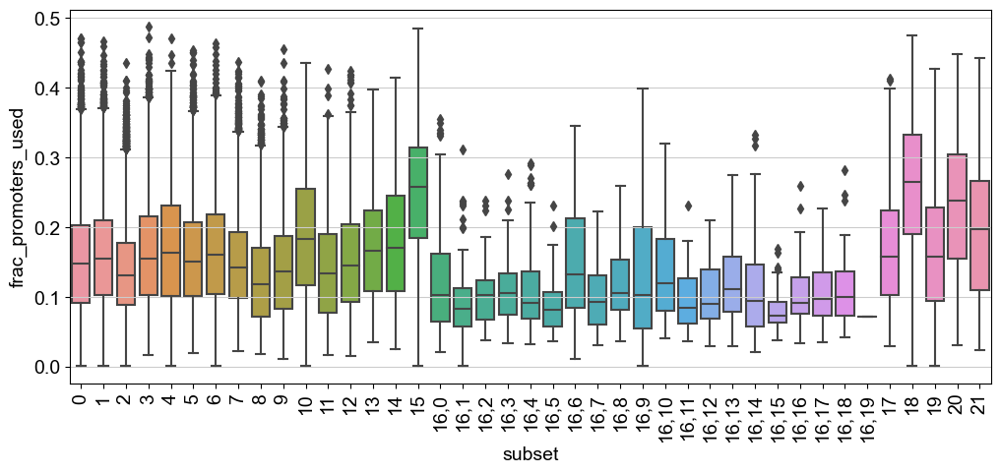

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 39 clusters and added
    'subset', the cluster labels (adata.obs, categorical) (0:00:00)


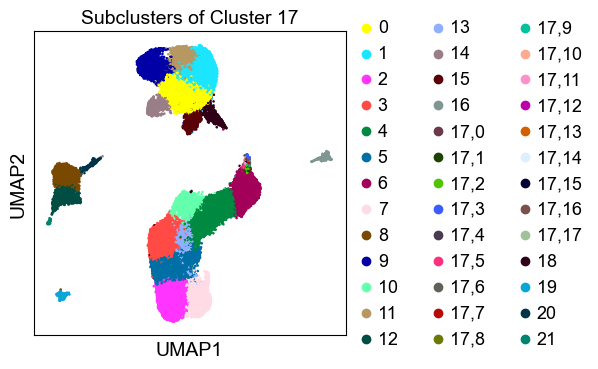

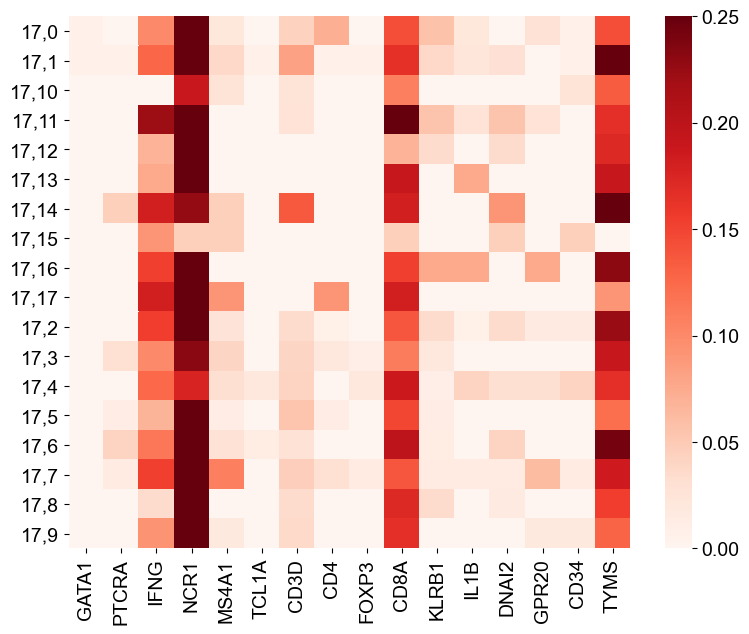

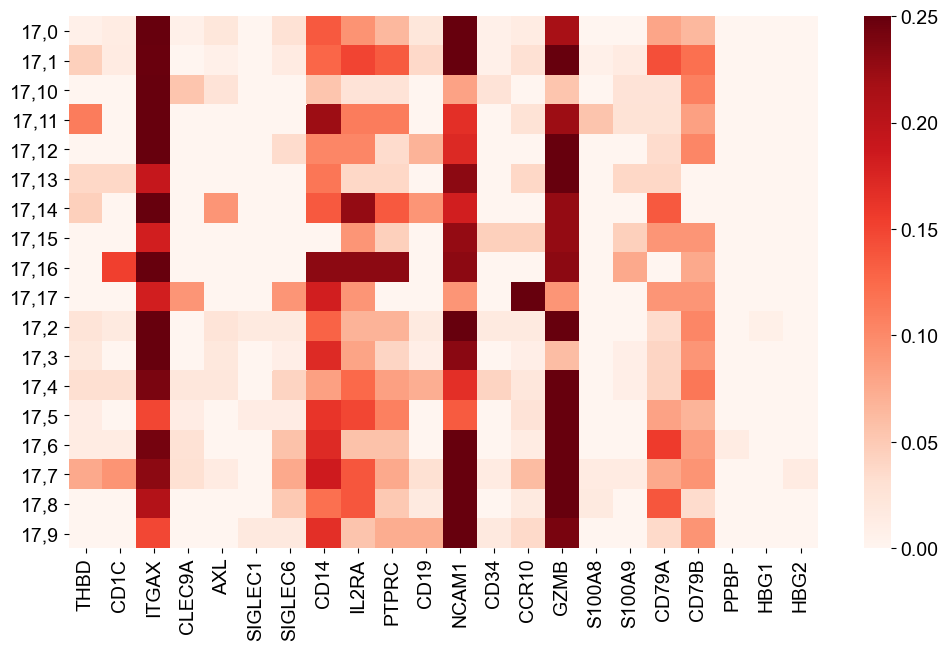

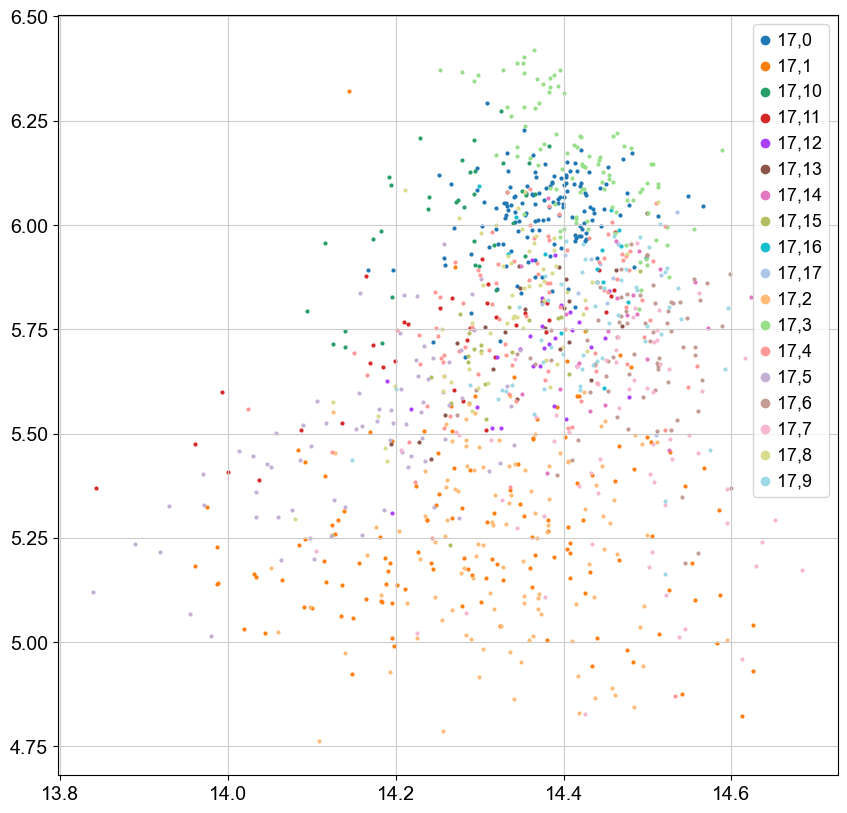

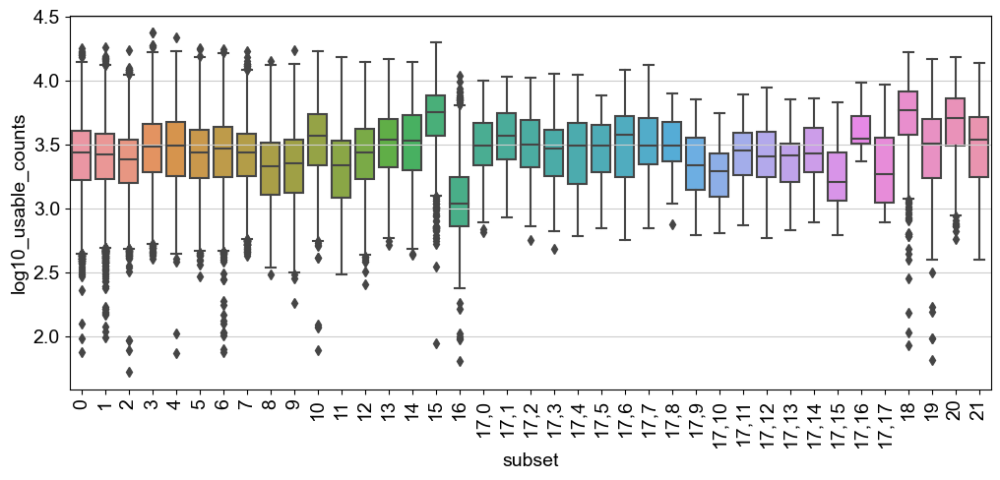

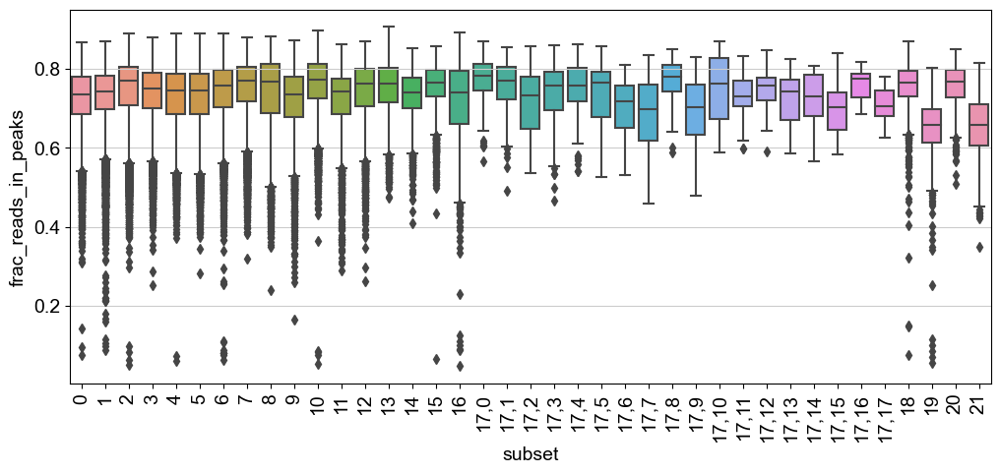

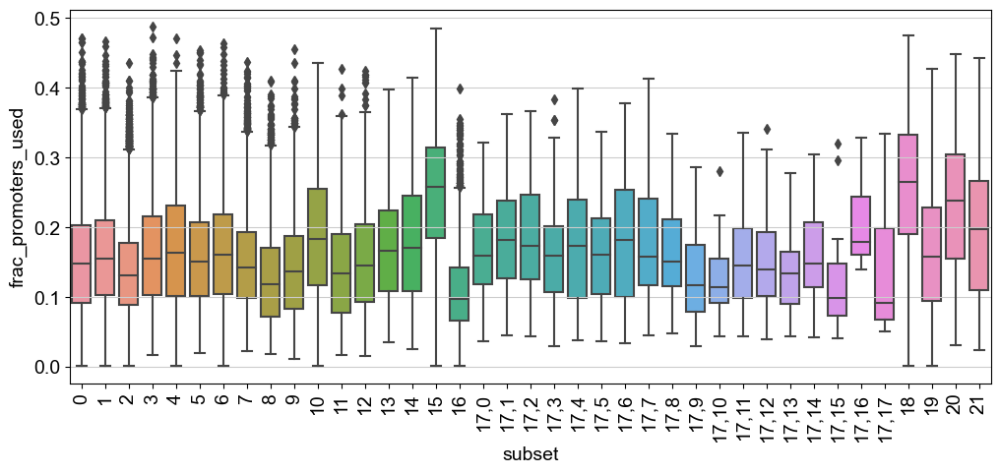

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 33 clusters and added
    'subset', the cluster labels (adata.obs, categorical) (0:00:00)


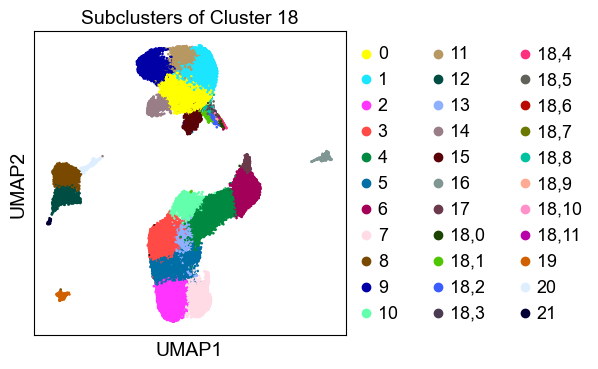

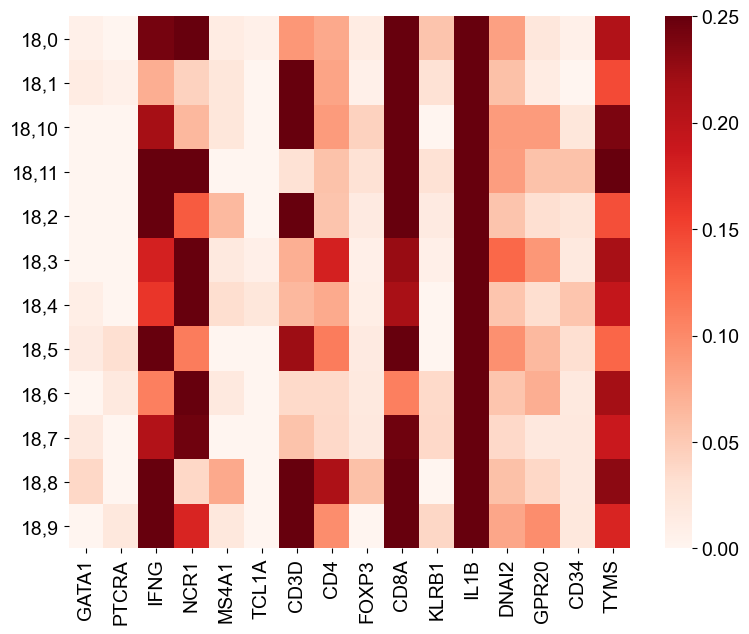

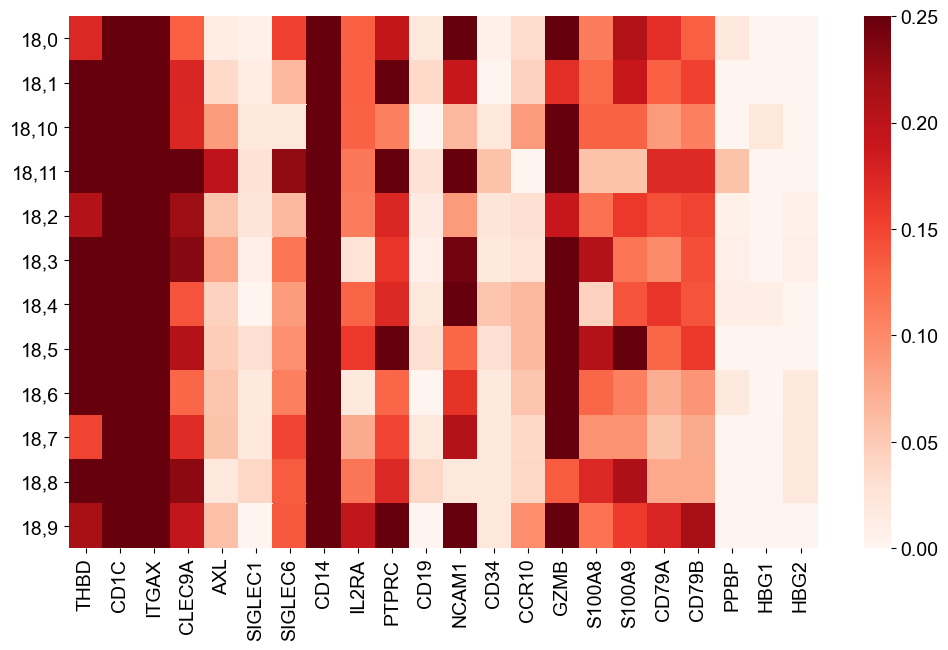

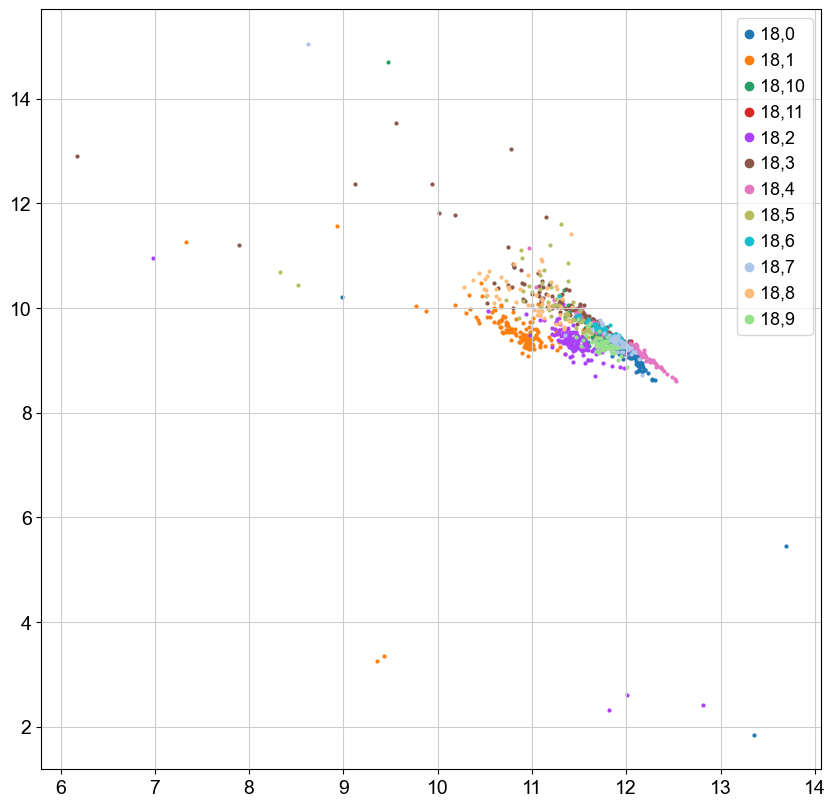

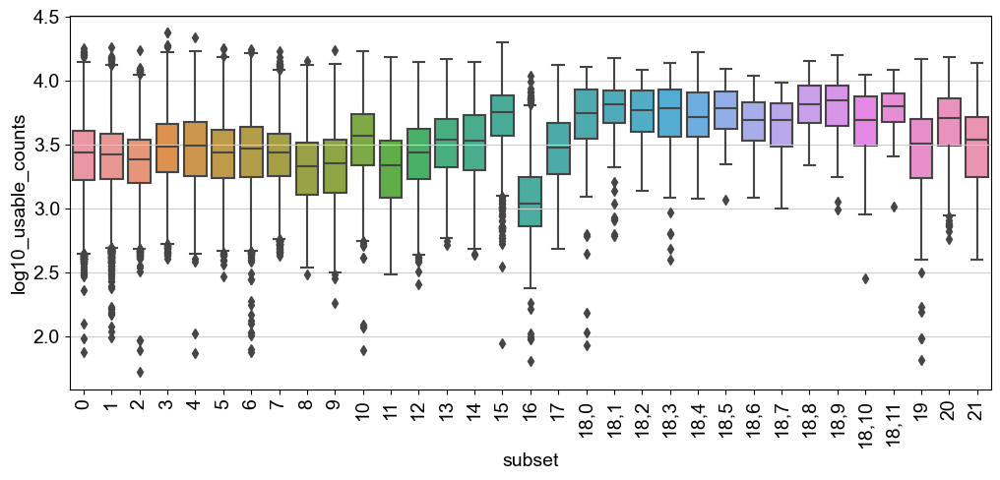

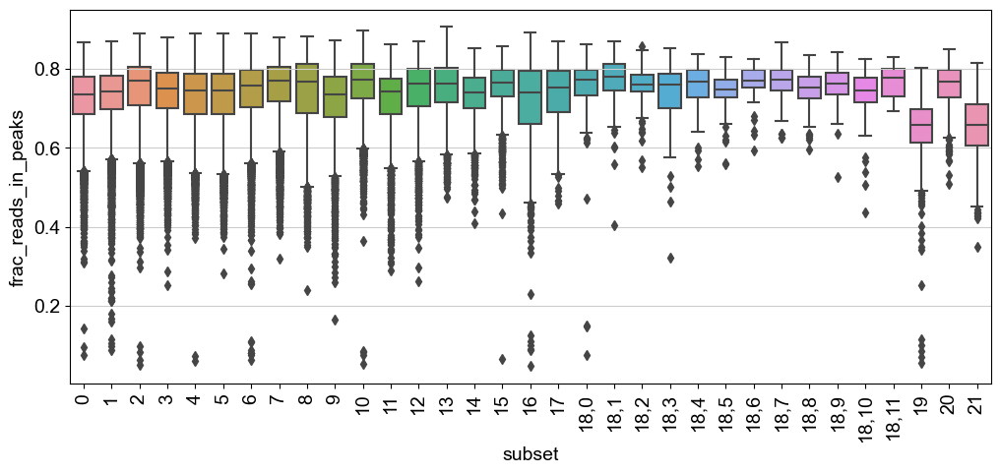

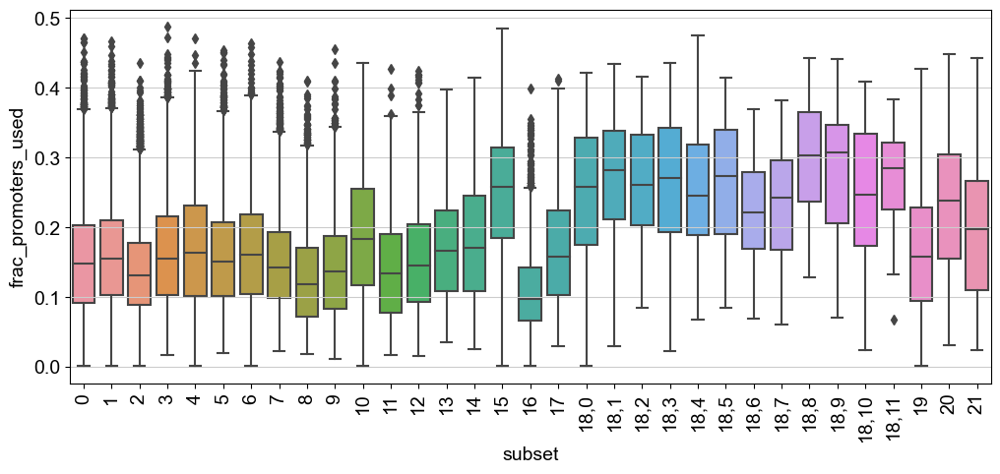

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 39 clusters and added
    'subset', the cluster labels (adata.obs, categorical) (0:00:00)


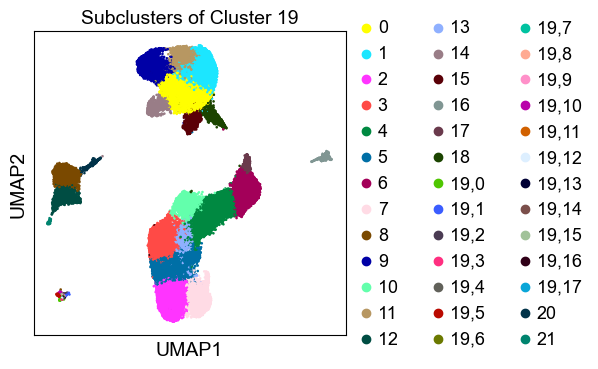

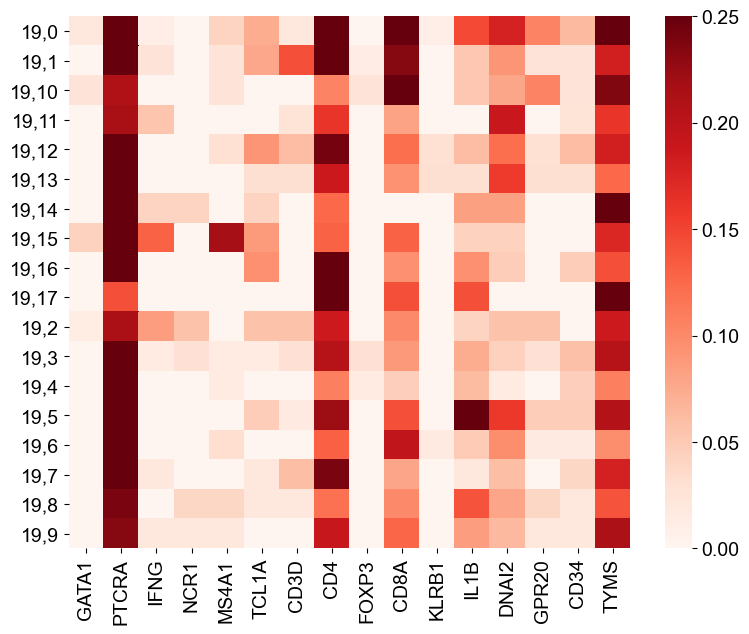

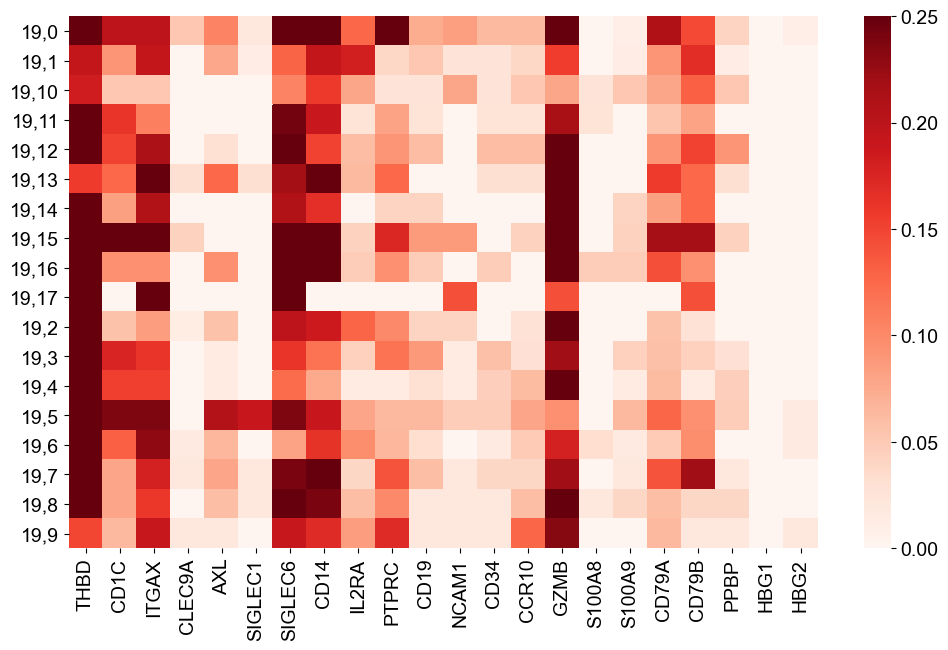

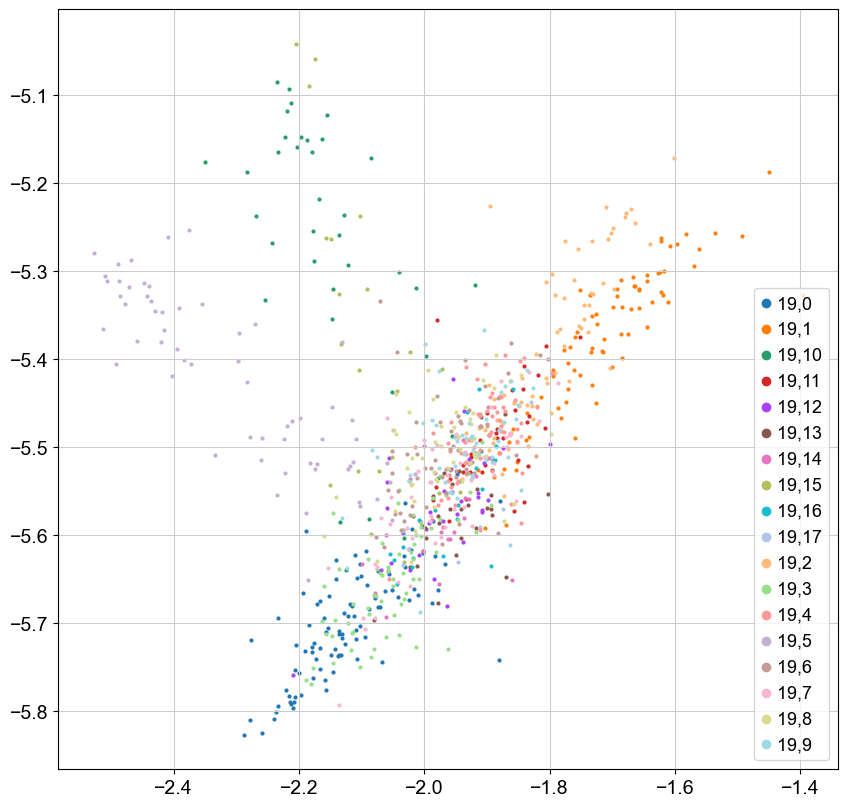

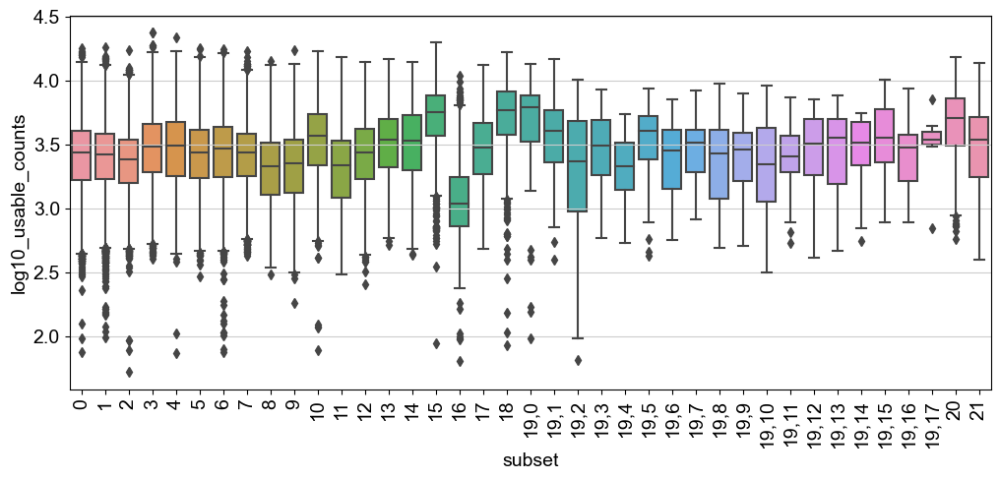

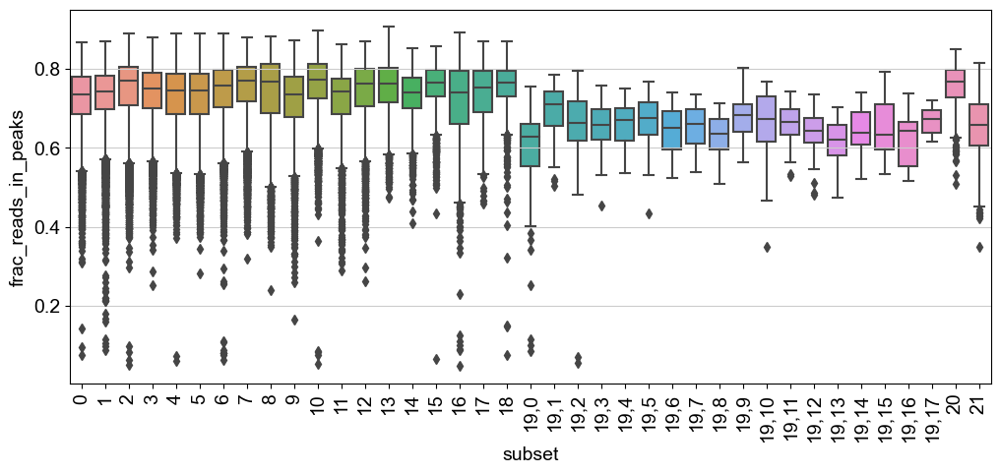

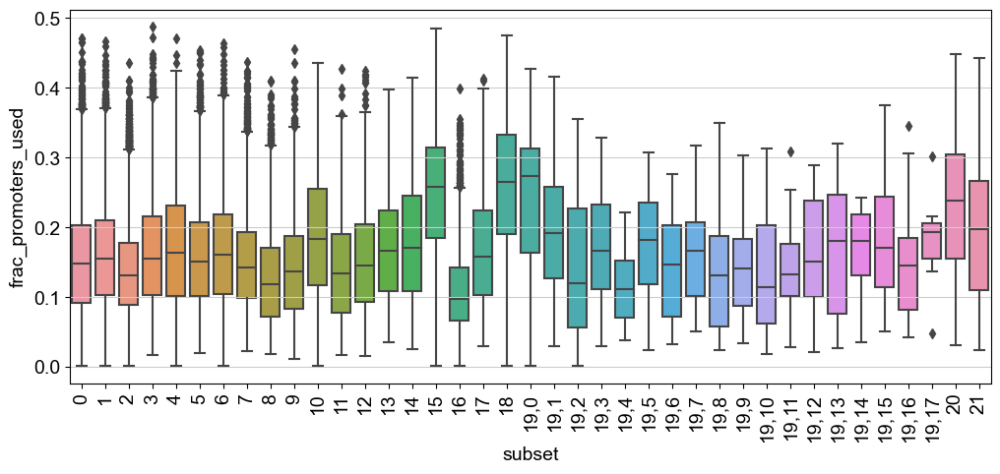

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 31 clusters and added
    'subset', the cluster labels (adata.obs, categorical) (0:00:00)


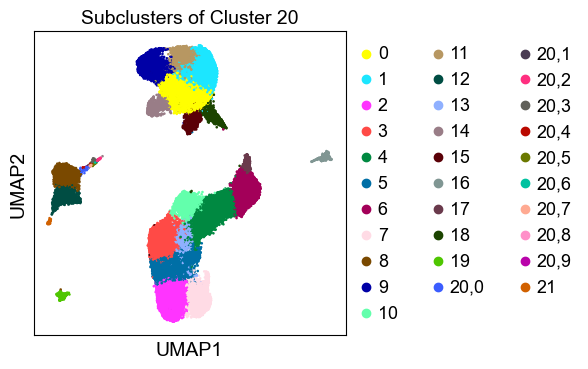

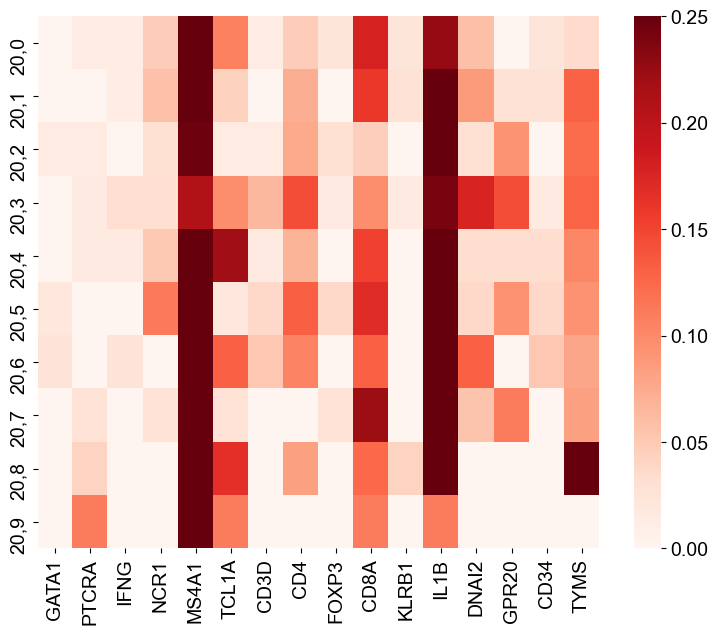

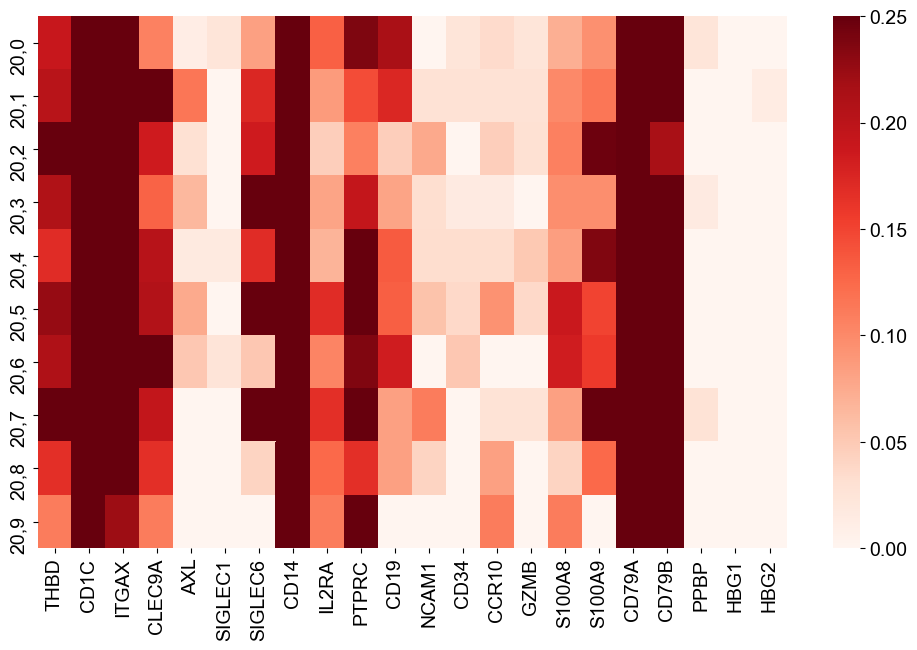

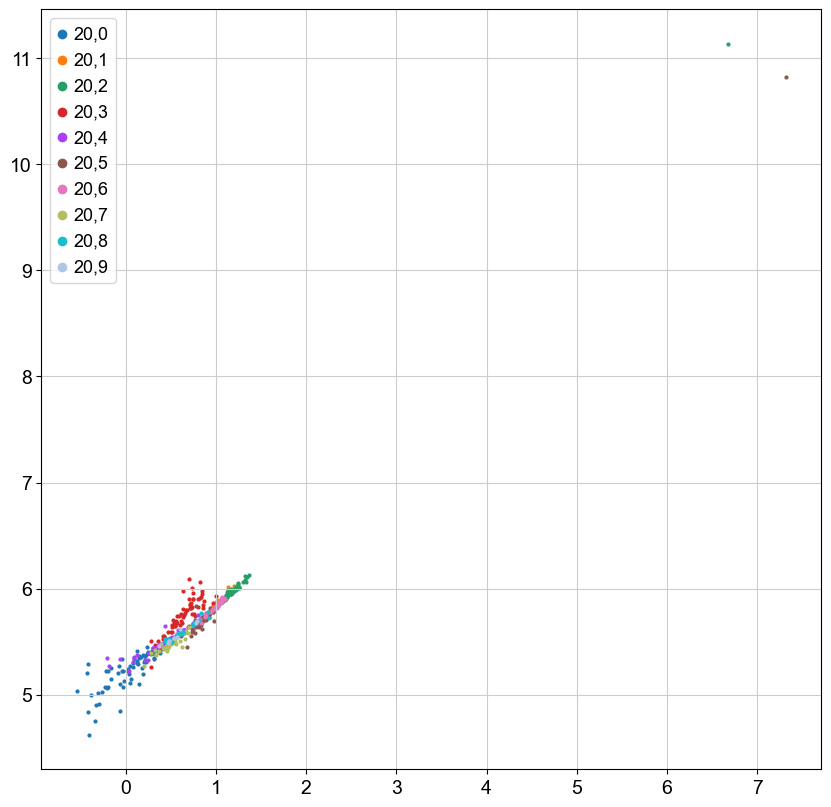

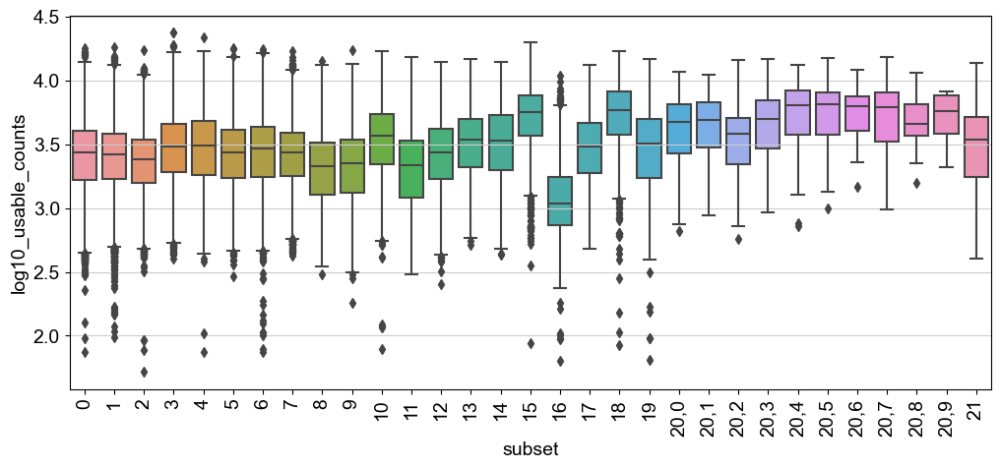

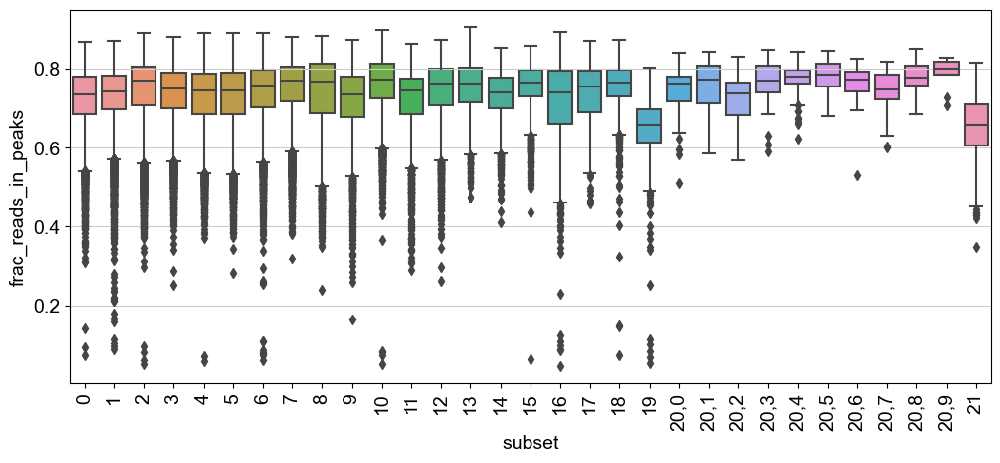

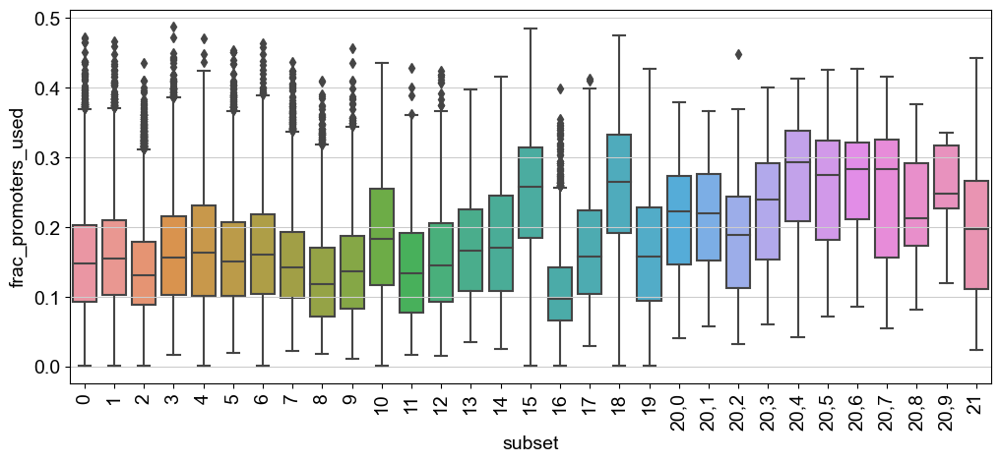

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 39 clusters and added
    'subset', the cluster labels (adata.obs, categorical) (0:00:00)


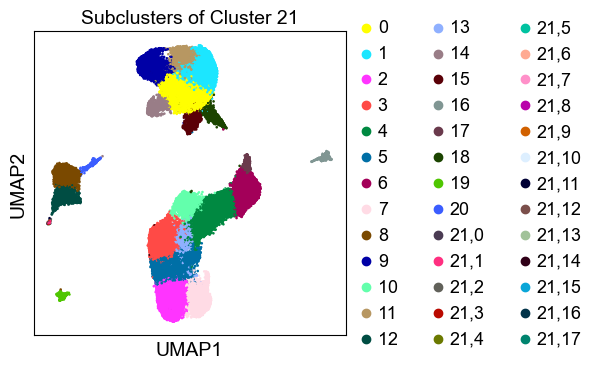

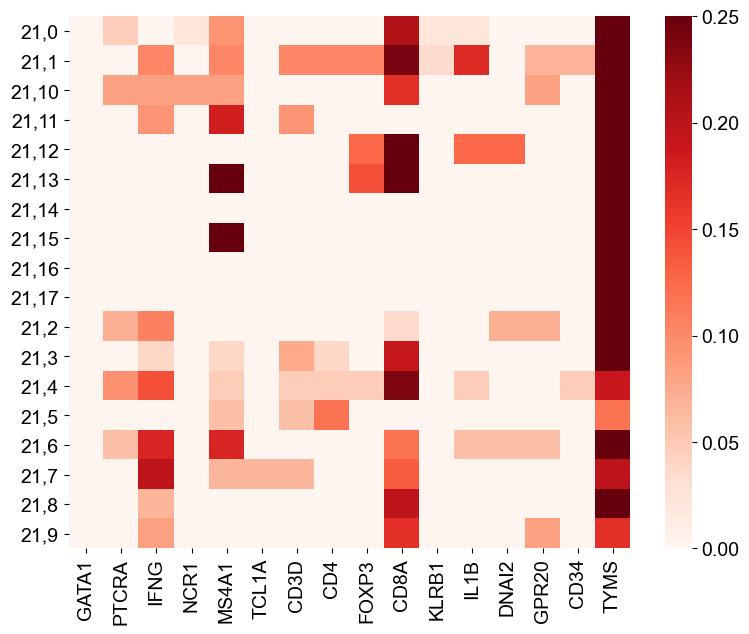

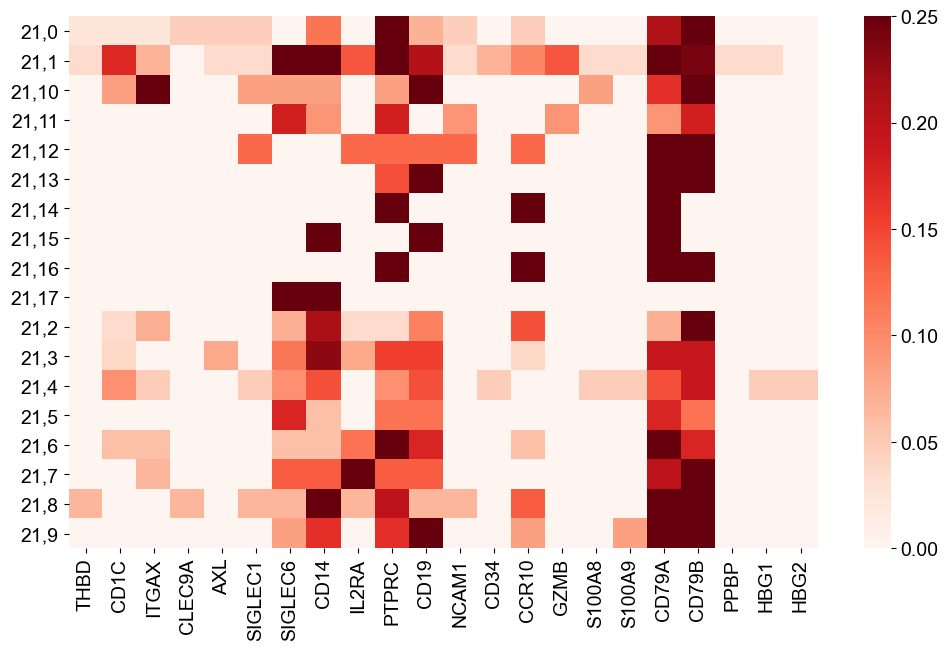

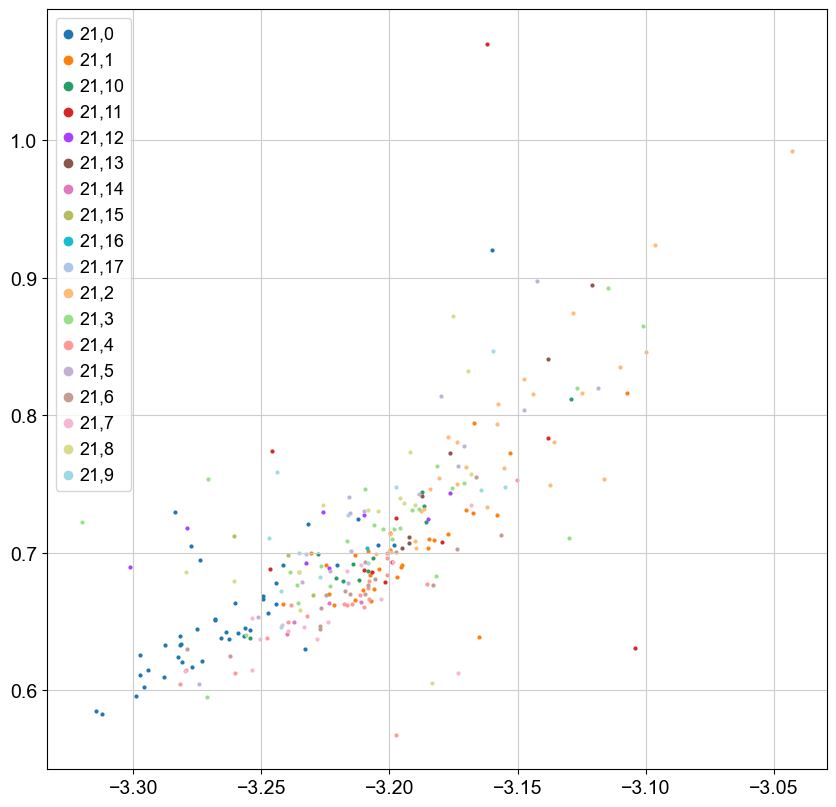

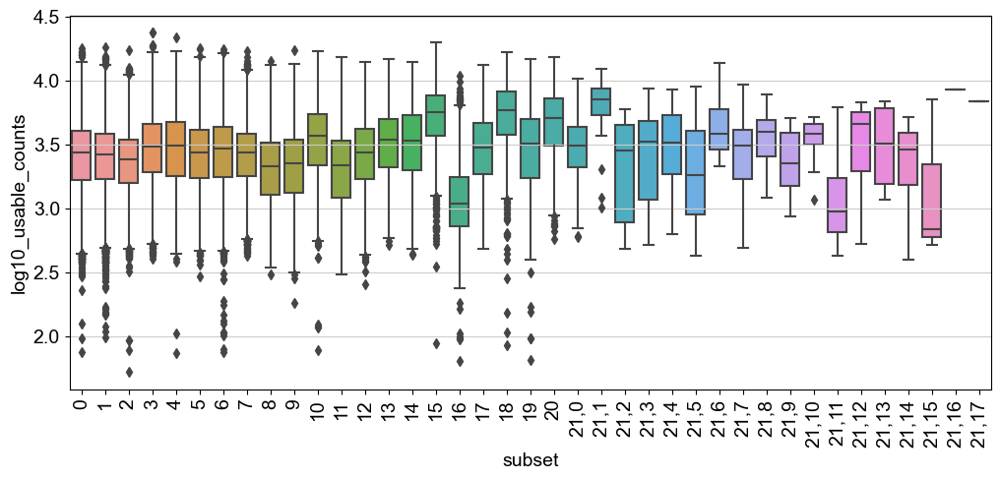

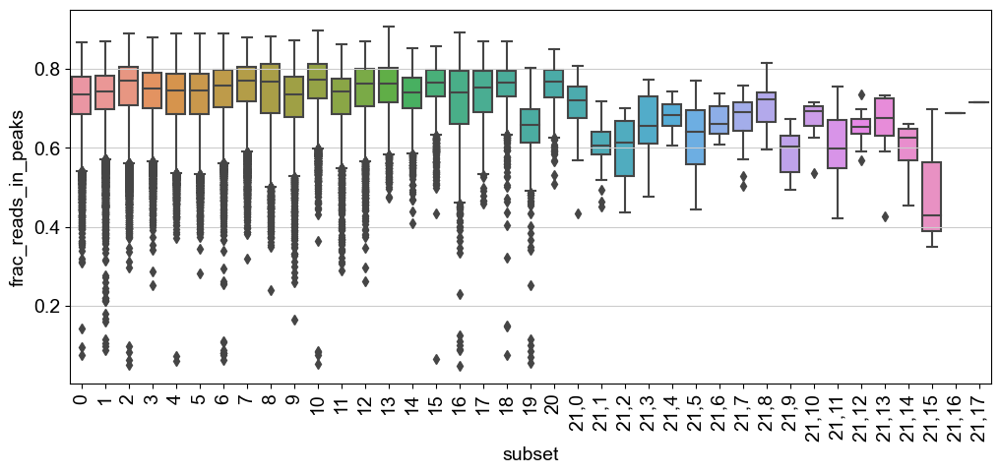

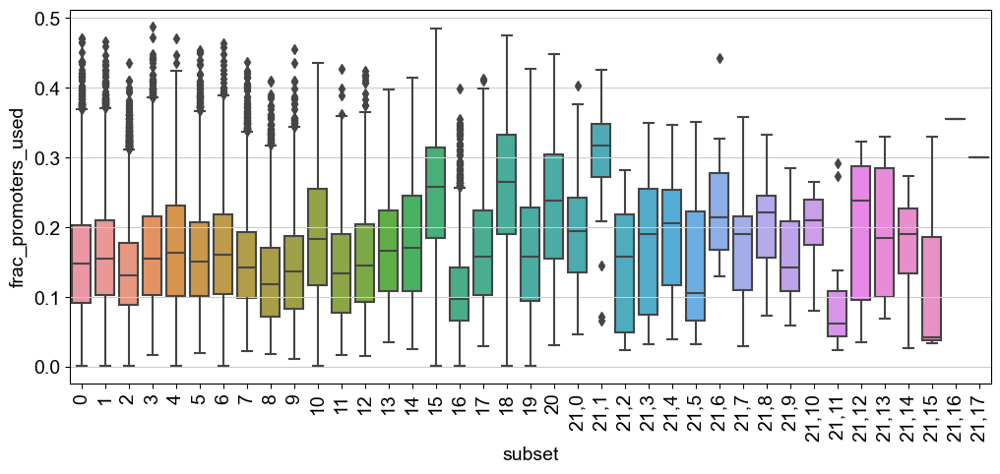

In [21]:
subClusterDict = dict()
adataObsTemp, subClusterDict = createAllSubClusters (adata_norm, subClusterDict, geneList, experimentalGeneList, figureOutputDir, subClusterStep, False, geneList)

In [22]:
adata_normTemp = adata_norm.copy()


adata_normTemp.obs['subcluster'] = adata_norm.obs['leiden']
keys1 = subClusterDict.keys()
adata_normTemp.obs['subcluster'] = adata_normTemp.obs.subcluster.astype(str)

In [23]:
barList = adata_normTemp.obs.index.tolist()
subClusterReverseDict = dict()
for bar in subClusterReverseDict:
    subClusterReverseDict[bar] = ''
for k in keys1:
    list1 = subClusterDict[k]
    for l in list1:
        subClusterReverseDict[l] = k
adata_normTemp.obs['subcluster'] = adata_norm.obs.index.map(subClusterReverseDict)

In [24]:
adata_normTemp.obs

,donor,sample,batchGroup,tech,unique_usable_reads,total_sequenced_reads,duplicated_reads,unique_mito_reads,reads_in_peaks,reads_in_promoters,...,frac_mito_reads,frac_duplicated_reads,log10_unique_usable_reads,n_counts,LowFRIP_Removal,leiden,log10_usable_counts,norm,subset,subcluster
pbmc1_AAACGAAAGAAAGGGT,pbmc1,pbmc1,old_PBMC,10x_NextGEM_v1.1,18920,27626,8419,146,13178,7862,...,0.007658,0.304749,4.276944,19042.0,Not_Filtered,6,3.450249,0,6,"6,16"
pbmc1_AAACGAAAGAGCCTGA,pbmc1,pbmc1,old_PBMC,10x_NextGEM_v1.1,15153,21446,6004,206,11537,7113,...,0.013412,0.279959,4.180527,15395.0,Not_Filtered,6,3.407391,0,6,"6,6"
pbmc1_AAACGAAAGCGAGAAA,pbmc1,pbmc1,old_PBMC,10x_NextGEM_v1.1,10532,15859,5106,148,7224,3565,...,0.013858,0.321962,4.022552,10602.0,Not_Filtered,9,3.149527,0,9,"9,19"
pbmc1_AAACGAAAGCTCCGGT,pbmc1,pbmc1,old_PBMC,10x_NextGEM_v1.1,9238,13882,4608,4,6766,4275,...,0.000433,0.331941,3.965625,9260.0,Not_Filtered,4,3.247236,0,4,"4,0"
pbmc1_AAACGAAAGTACTCTG,pbmc1,pbmc1,old_PBMC,10x_NextGEM_v1.1,12723,18557,5423,304,8009,3869,...,0.023336,0.292235,4.104624,12626.0,Not_Filtered,0,3.172603,0,0,"0,10"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
tenX_atac_pbmc_500_v1_TTTGGTTCAGGCACAA,10x_Kit_v1.0_donor,tenX_atac_pbmc_500_v1,10x_Kit_v1.0_donor,10x_Kit_v1.0,9561,26631,17028,0,7352,4137,...,0.000000,0.639405,3.980549,9585.0,Not_Filtered,1,3.071882,20,1,"1,17"
tenX_atac_pbmc_500_v1_TTTGGTTTCATGTTCT,10x_Kit_v1.0_donor,tenX_atac_pbmc_500_v1,10x_Kit_v1.0_donor,10x_Kit_v1.0,15272,44836,29512,0,11831,6310,...,0.000000,0.658221,4.183924,15613.0,Not_Filtered,0,3.308778,20,0,"0,4"
tenX_atac_pbmc_500_v1_TTTGTGTCACAGTTAC,10x_Kit_v1.0_donor,tenX_atac_pbmc_500_v1,10x_Kit_v1.0_donor,10x_Kit_v1.0,31553,80505,48803,0,25181,15705,...,0.000000,0.606211,4.499054,32349.0,Not_Filtered,6,3.724849,20,6,"6,0"
tenX_atac_pbmc_500_v1_TTTGTGTTCCTAAAGC,10x_Kit_v1.0_donor,tenX_atac_pbmc_500_v1,10x_Kit_v1.0_donor,10x_Kit_v1.0,13281,41404,28063,2,10368,5296,...,0.000151,0.677785,4.123263,13544.0,Not_Filtered,1,3.253338,20,1,"1,8"


In [25]:
subclusterDictFileName = wd + PROJECT_NAME +  '.badBarcodes.doubletRemovalRound.' + DOUBLET_FILTER_STEP_NAME \
                         + '.Subclusters.txt'


with open(subclusterDictFileName, 'w') as f:
	for key, value in subClusterReverseDict.items():
		f.write('%s:%s\n' % (key, value))


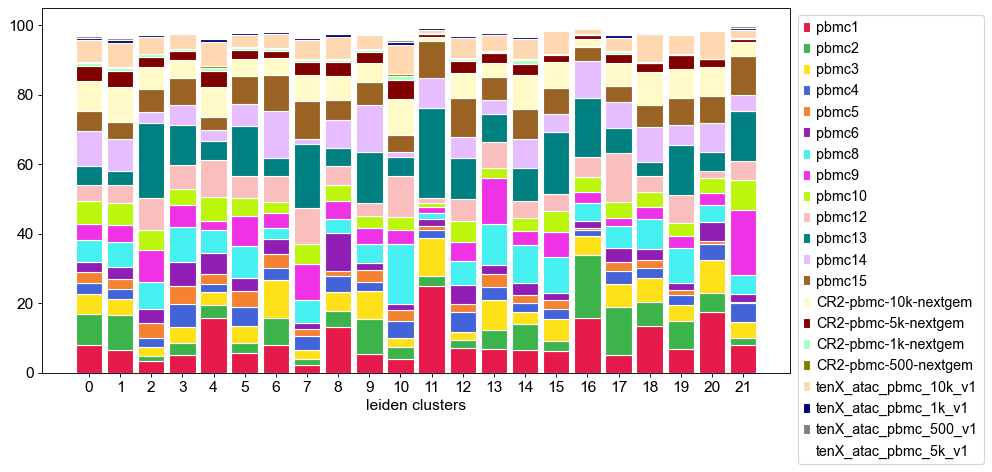

In [26]:
barCols = sorted(adata_norm.obs['leiden'].unique(), key=int)
barDF = pd.DataFrame(index=samples, columns=barCols)
sampleColorDict = {
    'pbmc1' : '#e6194b',
    'pbmc2' : '#3cb44b',
    'pbmc3' : '#ffe119',
    "pbmc4" : '#4363d8',
    "pbmc5" : '#f58231',
    "pbmc6" : '#911eb4',
    "pbmc8" : '#46f0f0',
    "pbmc9" : '#f032e6',
    "pbmc10" : '#bcf60c',
    "pbmc12" : '#fabebe',
    'pbmc13' : '#008080',
    'pbmc14' : '#e6beff',
    'pbmc15' : '#9a6324',
    'CR2-pbmc-10k-nextgem' : '#fffac8',
    'CR2-pbmc-5k-nextgem' : '#800000',
    'CR2-pbmc-1k-nextgem' : '#aaffc3',
    'CR2-pbmc-500-nextgem' : '#808000', 
    'tenX_atac_pbmc_10k_v1' : '#ffd8b1',
    'tenX_atac_pbmc_1k_v1' : '#000075',
    'tenX_atac_pbmc_500_v1' : '#808080',
    'tenX_atac_pbmc_5k_v1' : '#ffffff', 
}


for leid in barCols:
    for sample in samples:
        dfTemp = adata_norm.obs[adata_norm.obs['leiden'].isin([leid])]
        dfTemp = dfTemp[dfTemp['sample'].isin([sample])]
        len1 = len(dfTemp)
        #print(sample, leid, len1)
        barDF.loc[sample, leid] = len1


totalsDict = dict()
for leid in barCols:
    totalsDict[leid] = barDF[leid].sum()

barPercentDF = pd.DataFrame(index=samples, columns=barCols)
for leid in barCols:
    for sample in samples:
        barPercentDF.loc[sample, leid] = barDF.loc[sample, leid] / totalsDict[leid]  * 100
        
        
bottomDict = dict()
listLast = list()
bottomBottomList = list()
for leid in barCols:
    bottomBottomList.append(0)


for sample in samples:
    bottomDict[sample] = bottomBottomList.copy()
    barDfList = barPercentDF.loc[sample,].tolist()
    #print(sample, barDfList)
    for i in range(len(barDfList)):
        bottomBottomList[i] = bottomBottomList[i] + barDfList[i]

    
    
    
    
    
sampleColorDict = {
    'pbmc1' : '#e6194b',
    'pbmc2' : '#3cb44b',
    'pbmc3' : '#ffe119',
    "pbmc4" : '#4363d8',
    "pbmc5" : '#f58231',
    "pbmc6" : '#911eb4',
    "pbmc8" : '#46f0f0',
    "pbmc9" : '#f032e6',
    "pbmc10" : '#bcf60c',
    "pbmc12" : '#fabebe',
    'pbmc13' : '#008080',
    'pbmc14' : '#e6beff',
    'pbmc15' : '#9a6324',
    'CR2-pbmc-10k-nextgem' : '#fffac8',
    'CR2-pbmc-5k-nextgem' : '#800000',
    'CR2-pbmc-1k-nextgem' : '#aaffc3',
    'CR2-pbmc-500-nextgem' : '#808000', 
    'tenX_atac_pbmc_10k_v1' : '#ffd8b1',
    'tenX_atac_pbmc_1k_v1' : '#000075',
    'tenX_atac_pbmc_500_v1' : '#808080',
    'tenX_atac_pbmc_5k_v1' : '#ffffff', 
}
    
    
barWidth = 0.85

fig = plt.figure(figsize=(12, 6), dpi=80)
for sample in samples:
#     plt.bar(barCols, barPercentDF.loc[sample,].tolist(), bottom = bottomDict[sample], \
#         color=sampleColorDict[sample],) 
    plt.bar(barCols, barPercentDF.loc[sample,].tolist(), bottom = bottomDict[sample], \
        color=sampleColorDict[sample], edgecolor='white', width=barWidth)    

plt.legend( sampleColorDict.keys(), numpoints=1, bbox_to_anchor=(1, 1))
#plt.xticks(barCols, barCols )
plt.xlabel("leiden clusters")
plt.grid(False)
# Show graphic
plt.show()

In [57]:
subClustersToRemoveRound1 = [ '3,6',
'6,13',
'7,4',
'15,7',
'18,9',
'19,16',
'19,18',

                            ]
removeRows = getDFOfRowsToRemove (adata_norm, subClustersToRemoveRound1, subClusterDict)
removeRows.head()
print(len(removeRows.index))
removeRows.to_csv(os.path.join(wd, outputFilteredBarcodeFile), header=False, columns=[])

2105


In [58]:
outputFilteredBarcodeFile

'/nfs/lab/jnewsome/pbmc/cluster_Input_Matrix_Softlinks/pbmc1_15_10x.badBarcodes.doubletRemovalRound.3'

In [ ]:
# sc.pl.dotplot(adata_norm, subset_genes,
#                groupby='leiden', dendrogram=True)

In [ ]:
# subset_genes = list(set(subset_genes))

In [ ]:
# sc.pl.dotplot(adata_norm, subset_genes,
#                groupby='leiden', dendrogram=True)

In [ ]:
# sc.pl.dotplot(adata_norm, generalPopDict,
#                groupby='leiden', dendrogram=True)

In [ ]:
# sc.pl.dotplot(adata_norm, detailedPopDict,
#                groupby='leiden', dendrogram=True, save="/doublet9_clusters_FinePopMarkerGenes.png")

In [ ]:
# sc.pl.dotplot(adata_norm, ['FOXP3', 'TCL1A'],
#                groupby='leiden', dendrogram=True)

## ANNOTATE CLUSTER LABELS

In [37]:
# umapIndividualSamples (adata_norm, 5, 1, samples, filterStep, True)


TypeError: bad operand type for unary -: 'str'

<Figure size 1449x400 with 0 Axes>

In [ ]:
       
#get a list of cells in low quality clusters
#adata_norm.obs.loc[(adata_norm.obs['leiden'].isin(['11']))].to_csv(outputFilteredBarcodeFile, header=None, columns=[])
#adata_norm.obs.loc[(adata_norm.obs['leiden'].isin(['11']))].head()

In [30]:
adata_normTemp = adata_norm.copy()

In [31]:
adata_normTemp = makeSubClusterColumnsForEachCluster (adata_normTemp, subClusterDict, 'All_Other_Clusters')

/home/data/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:135: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead


In [31]:
# macro_cluster_labels = {
#                   '0' : 'CD4_T-cell',
#                   '1' : 'Monocyte',
#                   '2' : 'CD8_T-cell',
#                   '3' : 'Monocyte',
#                   '4' : 'CD4_T-cell',
#                   '5' : 'NK_cell',
#                   '6' : 'B-cell',
#                   '7' : 'CD4_T-cell',
#                   '8' : 'Monocyte',
#                   '9' : 'CD4_T-cell',
#                   '10' : 'CD8_T-cell',
#                   '11' : 'CD8_T-cell',
#                   '12' : 'B-cell',
#                   '13' : 'NK_cell',
#                   '14' : 'Megakaryocyte',
#                   '15' : 'Monocyte',
#                   '16' : 'pDC'
#                  }

In [30]:
# makeCellTypeDotPlotsBySubClusters (adata_normTemp, macro_cluster_labels, True, filterStep)     


In [33]:
adata_norm.obs['subcluster'] = adata_norm.obs['leiden']
keys1 = subClusterDict.keys()
adata_norm.obs['subcluster'] = adata_norm.obs.subcluster.astype(str)

for k in keys1:
    list1 = subClusterDict[k]
    for l in list1:
        #print(k)
        #print(str(k))
        #print(l)
        #print( adata_normTemp.obs.loc[[l]]['subcluster'])
        adata_norm.obs.set_value(l,'subcluster', k)
        #adata_normTemp.obs.loc[l, 'subcluster'] = str(k)

/home/data/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:12: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead
  if sys.path[0] == '':


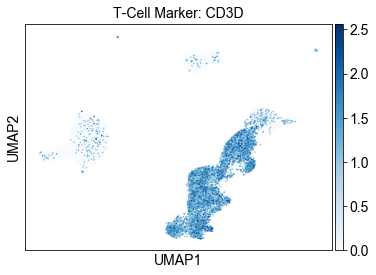

In [47]:
sc.pl.umap(adata_norm, color= ['CD3D'], size=9, color_map='Blues', frameon=True, use_raw=True, title= "T-Cell Marker: CD3D", save="/v6_doublet9_UMAP_CD3D.png")

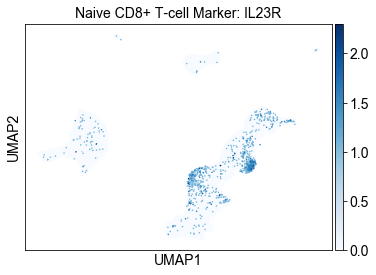

In [49]:
sc.pl.umap(adata_norm, color= ['IL23R'], size=9, color_map='Blues', frameon=True, use_raw=True, title= "Naive CD8+ T-cell Marker: IL23R", save="/v6_doublet9_UMAP_IL23R.png")

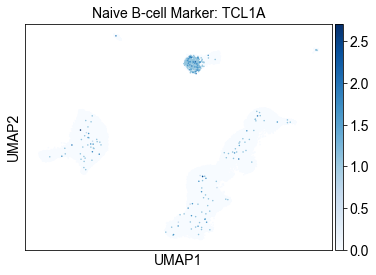

In [50]:
sc.pl.umap(adata_norm, color= ['TCL1A'], size=9, color_map='Blues', frameon=True, use_raw=True, title= "Naive B-cell Marker: TCL1A", save="/v6_doublet9_UMAP_TCL1A.png")

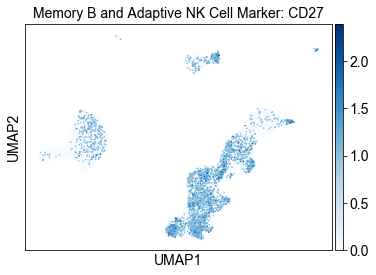

In [54]:
sc.pl.umap(adata_norm, color= ['CD27'], size=9, color_map='Blues', frameon=True, use_raw=True, title= "Memory B and Adaptive NK Cell Marker: CD27", save="/v6_doublet9_UMAP_CD27.png")

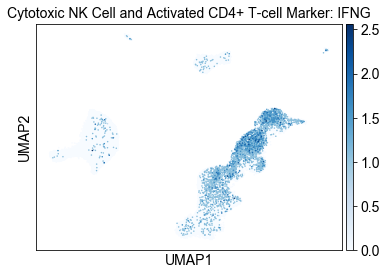

In [52]:
sc.pl.umap(adata_norm, color= ['IFNG'], size=9, color_map='Blues', frameon=True, use_raw=True, title= "Cytotoxic NK Cell and Activated CD4+ T-cell Marker: IFNG", save="/v6_doublet9_UMAP_IFNG.png")

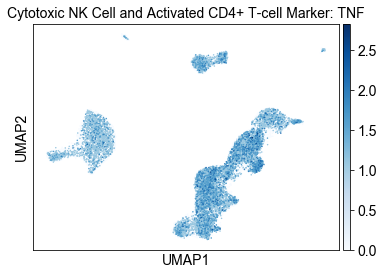

In [53]:
sc.pl.umap(adata_norm, color= ['TNF'], size=9, color_map='Blues', frameon=True, use_raw=True, title= "Cytotoxic NK Cell and Activated CD4+ T-cell Marker: TNF", save="/v6_doublet9_UMAP_TNF.png")

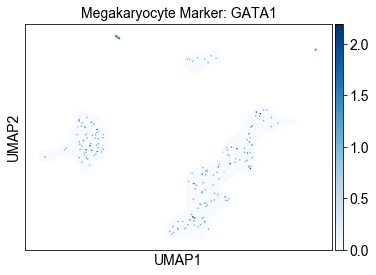

In [55]:
sc.pl.umap(adata_norm, color= ['GATA1'], size=9, color_map='Blues', frameon=True, use_raw=True, title= "Megakaryocyte Marker: GATA1", save="/v6_doublet9_UMAP_GATA1.png")

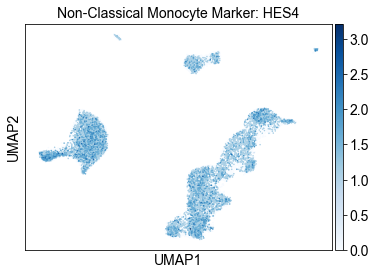

In [56]:
sc.pl.umap(adata_norm, color= ['HES4'], size=9, color_map='Blues', frameon=True, use_raw=True, title= "Non-Classical Monocyte Marker: HES4", save="/v6_doublet9_UMAP_HES4.png")

In [34]:
# New column, label with subcluster and then merge subcluster -> just cluster for any clusters you're not subsetting
adata_norm.obs['finalcluster'] = adata_norm.obs['subcluster']
adata_norm = replaceSubClusterValuesWithClusterName (adata_norm, 'finalcluster', subClusterDict, '0', '0')
adata_norm = replaceSubClusterValuesWithClusterName (adata_norm, 'finalcluster', subClusterDict, '1', '1')
adata_norm = replaceSubClusterValuesWithClusterName (adata_norm, 'finalcluster', subClusterDict, '2', '2')
adata_norm = replaceSubClusterValuesWithClusterName (adata_norm, 'finalcluster', subClusterDict, '3', '3')
adata_norm = replaceSubClusterValuesWithClusterName (adata_norm, 'finalcluster', subClusterDict, '4', '4')
adata_norm = replaceSubClusterValuesWithClusterName (adata_norm, 'finalcluster', subClusterDict, '5', '5')
adata_norm = replaceSubClusterValuesWithClusterName (adata_norm, 'finalcluster', subClusterDict, '6', '6')
adata_norm = replaceSubClusterValuesWithClusterName (adata_norm, 'finalcluster', subClusterDict, '7', '7')
adata_norm = replaceSubClusterValuesWithClusterName (adata_norm, 'finalcluster', subClusterDict, '8', '8')
adata_norm = replaceSubClusterValuesWithClusterName (adata_norm, 'finalcluster', subClusterDict, '10', '10')
adata_norm = replaceSubClusterValuesWithClusterName (adata_norm, 'finalcluster', subClusterDict, '11', '11')
adata_norm = replaceSubClusterValuesWithClusterName (adata_norm, 'finalcluster', subClusterDict, '12', '12')
adata_norm = replaceSubClusterValuesWithClusterName (adata_norm, 'finalcluster', subClusterDict, '13', '13')
adata_norm = replaceSubClusterValuesWithClusterName (adata_norm, 'finalcluster', subClusterDict, '14', '14')
adata_norm = replaceSubClusterValuesWithClusterName (adata_norm, 'finalcluster', subClusterDict, '15', '15')
adata_norm = replaceSubClusterValuesWithClusterName (adata_norm, 'finalcluster', subClusterDict, '16', '16')

In [35]:

replaceDict_9 = {  '9,0' : '9A', '9,1': '9A', '9,2' : '9A', '9,3' : '9A', '9,4' : '9A', 
                 '9,5' : '9A', '9,6' : '9A', '9,7' : '9B', '9,8' : '9A', 
                 '9,9' : '9B', '9,10' : '9A', '9,11' : '9B', '9,12' : '9A', 
                 '9,13' : '9A', '9,14' : '9B', '9,15' : '9A', 
                 '9,16' : '9B'
                }


adata_norm.obs['finalcluster'] = adata_norm.obs['finalcluster'].replace(replaceDict_9)


In [36]:
adata_norm.obs['finalcluster'].unique()

array(['5', '8', '2', '1', '11', '0', '6', '4', '16', '10', '3', '9A',
       '13', '14', '12', '7', '15', '9B'], dtype=object)

In [37]:
micro_cluster_labels = {
      '0' : 'Activated_CD4_T-cell',
      '1' : 'Classical_Monocyte',
      '2' : 'Activated_CD8_T-cell',
      '3' : 'Classical_Monocyte',
      '4' : 'Naive_CD4_T-cell',
      '5' : 'Cytotoxic_NK_cell',
      '6' : 'Naive_B-cell',
      '7' : 'Naive_CD4_T-cell',
      '8' : 'Non-Classical_Monocyte',
      '9A' : 'Activated_CD4_T-cell',
      '9B' : 'Regulatory_CD4_T-cell',
      '10' : 'Naive_CD8_T-cell',
      '11' : 'Activated_CD8_T-cell',
      '12' : 'Memory_B-cell',
      '13' : 'Adaptive_NK_cell',
      '14' : 'Megakaryocyte',
      '15' : 'Conventional_Dendritic_cell',
      '16' : 'pDC'
}

In [38]:
adata_norm.obs['microPopulations'] = adata_norm.obs['finalcluster'].replace(micro_cluster_labels)

In [39]:
adata_norm.obs['macroPopulations'] = adata_norm.obs['leiden'].replace(macro_cluster_labels)

In [40]:
adata_norm.obs['microPopulations'].value_counts()

Classical_Monocyte             17451
Activated_CD4_T-cell           12522
Naive_CD4_T-cell               10413
Activated_CD8_T-cell            9018
Cytotoxic_NK_cell               4896
Naive_B-cell                    4144
Non-Classical_Monocyte          2483
Naive_CD8_T-cell                1915
Memory_B-cell                   1150
Adaptive_NK_cell                 869
Megakaryocyte                    730
Conventional_Dendritic_cell      502
Regulatory_CD4_T-cell            399
pDC                              351
Name: microPopulations, dtype: int64

In [41]:
adata_norm.obs['macroPopulations'].value_counts()

CD4_T-cell       23334
Monocyte         20436
CD8_T-cell       10933
NK_cell           5765
B-cell            5294
Megakaryocyte      730
pDC                351
Name: macroPopulations, dtype: int64

In [42]:
adata_norm.obs['subcluster'].unique()

array(['5,6', '8,8', '2,6', '1,11', '2,7', '11,3', '8,5', '5,4', '0,3',
       '6,2', '1,10', '0,2', '5,9', '4,11', '4,6', '16,5', '10,4', '0,6',
       '6,6', '1,8', '2,4', '8,0', '6,5', '3,1', '6,0', '10,6', '6,8',
       '6,10', '9,3', '1,6', '3,2', '6,11', '1,7', '4,3', '2,0', '10,7',
       '0,1', '0,7', '1,1', '4,10', '10,1', '1,4', '6,12', '2,5', '11,6',
       '2,1', '2,2', '5,3', '4,9', '13,0', '9,5', '5,7', '14,21', '1,13',
       '1,0', '0,0', '8,1', '3,8', '2,8', '3,9', '5,2', '2,16', '9,15',
       '12,0', '0,4', '2,13', '14,1', '1,9', '0,11', '8,6', '5,8', '6,7',
       '2,14', '13,1', '13,10', '0,9', '9,0', '6,3', '7,3', '11,9',
       '13,3', '4,13', '1,12', '4,8', '5,12', '8,4', '11,2', '1,2',
       '0,14', '6,4', '7,0', '0,8', '6,1', '14,16', '5,1', '16,0', '12,1',
       '3,7', '11,4', '3,0', '4,5', '3,5', '7,7', '9,13', '3,6', '14,15',
       '2,3', '5,10', '0,12', '6,14', '14,0', '16,2', '7,2', '8,7', '1,5',
       '3,13', '12,4', '16,24', '3,4', '0,10', '1,3', '1

In [43]:
subclusterNameFileName = '/home/jnewsome/pbmc1to12_v6_subclusterNameFile.txt'
subclusterNameFile = open(subclusterNameFileName, 'w')

for name in adata_norm.obs['subcluster'].unique():
    subclusterNameFile.write(name + " ")
    
subclusterNameFile.close()





In [44]:
clusters = pd.DataFrame(adata_norm.obsm['X_umap'], columns=['UMAP1','UMAP2'], index=adata_norm.obs.index)
clusters['leiden'] = clusters.index.map(adata_norm.obs['leiden'])
clusters['finalcluster'] = clusters.index.map(adata_norm.obs['finalcluster'])
clusters['cluster'] = clusters.index.map(adata_norm.obs['microPopulations'])


clusters.to_csv('/nfs/lab/projects/pbmc_snATAC/pipeline/snATAC/clusterBarcodeFiles/pbmc1to12.cluster_labels_v6_afterDoublet9_microGroups.txt', sep='\t')

In [45]:
clusters.head()

,UMAP1,UMAP2,leiden,finalcluster,cluster
index,,,,,
pbmc1_AAACGAAAGAAAGGGT,8.334658,4.762604,5,5,Cytotoxic_NK_cell
pbmc1_AAACGAAAGAGCCTGA,8.196747,5.300367,5,5,Cytotoxic_NK_cell
pbmc1_AAACGAAAGCGAGAAA,-12.008653,-0.196500,8,8,Non-Classical_Monocyte
pbmc1_AAACGAAAGCTCCGGT,4.778712,0.132388,2,2,Activated_CD8_T-cell
pbmc1_AAACGAAAGTACTCTG,-8.740663,0.698871,1,1,Classical_Monocyte


In [47]:
clusters = pd.DataFrame(adata_norm.obsm['X_umap'], columns=['UMAP1','UMAP2'], index=adata_norm.obs.index)
clusters['leiden'] = clusters.index.map(adata_norm.obs['leiden'])
clusters['cluster'] = clusters['leiden'].map(macro_cluster_labels)
clusters.to_csv('/nfs/lab/projects/pbmc_snATAC/pipeline/snATAC/clusterBarcodeFiles/pbmc1to12.cluster_labels_v6_afterDoublet9_macroGroups.txt', sep='\t')

In [48]:
clusters.head()

,UMAP1,UMAP2,leiden,cluster
index,,,,
pbmc1_AAACGAAAGAAAGGGT,8.334658,4.762604,5,NK_cell
pbmc1_AAACGAAAGAGCCTGA,8.196747,5.300367,5,NK_cell
pbmc1_AAACGAAAGCGAGAAA,-12.008653,-0.196500,8,Monocyte
pbmc1_AAACGAAAGCTCCGGT,4.778712,0.132388,2,CD8_T-cell
pbmc1_AAACGAAAGTACTCTG,-8.740663,0.698871,1,Monocyte


In [50]:
clusters = pd.DataFrame(adata_norm.obsm['X_umap'], columns=['UMAP1','UMAP2'], index=adata_norm.obs.index)
clusters['leiden'] = clusters.index.map(adata_norm.obs['leiden'])
clusters.to_csv('/nfs/lab/projects/pbmc_snATAC/pipeline/snATAC/clusterBarcodeFiles/pbmc1to12.cluster_labels_v6_afterDoublet9_clusters.txt', sep='\t')

In [51]:
adata_norm.obs.head()

,donor,duplicated_reads,frac_duplicated_reads,frac_mito_reads,frac_promoters_used,frac_reads_in_peaks,frac_reads_in_promoters,log10_unique_usable_reads,log10_usable_counts,n_counts,...,total_sequenced_reads,tss_used,unique_mito_reads,unique_usable_reads,leiden,subset,subcluster,finalcluster,microPopulations,macroPopulations
index,,,,,,,,,,,,,,,,,,,,,
pbmc1_AAACGAAAGAAAGGGT,pbmc1,10813,0.389251,0.002608,0.133878,0.664923,0.367526,4.226007,3.361539,17169.0,...,27779,2590,44,16826,5,5,"5,6",5,Cytotoxic_NK_cell,NK_cell
pbmc1_AAACGAAAGAGCCTGA,pbmc1,8192,0.380280,0.005423,0.118474,0.732753,0.420068,4.120771,3.322426,13460.0,...,21542,2292,72,13205,5,5,"5,6",5,Cytotoxic_NK_cell,NK_cell
pbmc1_AAACGAAAGCGAGAAA,pbmc1,5848,0.367360,0.005993,0.070764,0.672428,0.308782,3.997954,3.090258,10226.0,...,15919,1369,60,9952,8,8,"8,8",8,Non-Classical_Monocyte,Monocyte
pbmc1_AAACGAAAGCTCCGGT,pbmc1,5894,0.422358,0.000498,0.074279,0.695728,0.412754,3.904716,3.146748,8176.0,...,13955,1437,4,8029,2,2,"2,6",2,Activated_CD8_T-cell,CD8_T-cell
pbmc1_AAACGAAAGTACTCTG,pbmc1,6565,0.352597,0.008864,0.075209,0.605079,0.271071,4.073865,3.088490,12031.0,...,18619,1455,106,11853,1,1,"1,11",1,Classical_Monocyte,Monocyte


In [53]:
clusters = pd.DataFrame(adata_norm.obsm['X_umap'], columns=['UMAP1','UMAP2'], index=adata_norm.obs.index)
clusters['leiden'] = clusters.index.map(adata_norm.obs['leiden'])
clusters['subcluster'] = clusters.index.map(adata_norm.obs['subcluster'])
clusters.to_csv('/nfs/lab/projects/pbmc_snATAC/pipeline/snATAC/clusterBarcodeFiles/pbmc1to12.cluster_labels_v6_afterDoublet9_subclusters.txt', sep='\t')

In [54]:
clusters.head()

,UMAP1,UMAP2,leiden,subcluster
index,,,,
pbmc1_AAACGAAAGAAAGGGT,8.334658,4.762604,5,"5,6"
pbmc1_AAACGAAAGAGCCTGA,8.196747,5.300367,5,"5,6"
pbmc1_AAACGAAAGCGAGAAA,-12.008653,-0.196500,8,"8,8"
pbmc1_AAACGAAAGCTCCGGT,4.778712,0.132388,2,"2,6"
pbmc1_AAACGAAAGTACTCTG,-8.740663,0.698871,1,"1,11"


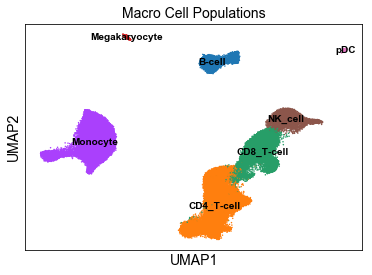

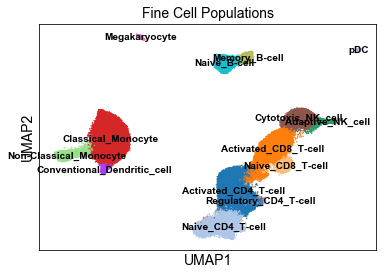

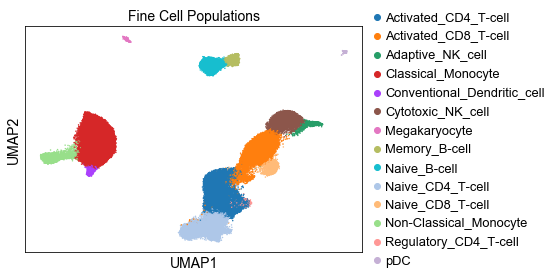

In [76]:
figName_Macro_umap = "/cellPopulationMacro_" + filterStep + "_WholeUMAP.png"
figName_Micro_umap = "/cellPopulationMicro_" + filterStep + "_WholeUMAP.png"
figName_Micro_umapv2 = "/cellPopulationMicro_" + filterStep + "_WholeUMAP_v2.png"
sc.pl.umap(adata_norm, color=['macroPopulations'], size=9, legend_loc='on data', title='Macro Cell Populations', save=figName_Macro_umap) 
sc.pl.umap(adata_norm, color=['microPopulations'], size=9, legend_loc='on data', title='Fine Cell Populations', save=figName_Micro_umap)
sc.pl.umap(adata_norm, color=['microPopulations'], size=9, title='Fine Cell Populations', save=figName_Micro_umapv2)



In [ ]:
# subClustersToRemoveRound1 = sixteenList
# removeRows = getDFOfRowsToRemove (adata_norm, subClustersToRemoveRound1, subClusterDict)
# removeRows.head()
# print(len(removeRows.index))
# removeRows.to_csv(os.path.join(wd, outputFilteredBarcodeFile), header=False, columns=[])